In [53]:
import copy
import socket
import os
import pickle 
# import ssm #need to/ keep 
import sys
import glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')

from scipy.ndimage import gaussian_filter1d
from get_data.read_neuro_beh_data import get_exp_features, load_json
from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
from beh_classification.behavior_features import get_behavior_features
from beh_classification.get_behavior_classifications import get_behavior_classification
# from beh_classification.beh_classification_utils import get_start_end_is_of_ones_in_binary_array
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score

from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.neighbors import NearestNeighbors

from load_data_fncs import load_all_data, get_exp_dates
from analyse_rslds_utils import make_behavior_decoder, input_slds

In [54]:

from matplotlib.colors import LinearSegmentedColormap

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
           "lightblue", # reverse
           "darkgreen", # turn
           "purple","red", "yellow", "black", "pink"]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))


# Load data, model, behavior decoder

In [55]:


T = 1599
full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()

velocity_og = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
acceleration_og = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
head_curvature_og = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
worm_curvature_og = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
pumping_og = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])
body_angle_mag_og = np.array([full_beh_data[i]["body_angle_mag"][0:1599] for i in range(len(full_beh_data))])
midlines_og =  np.array([full_beh_data[i]["midlines"][0:1599] for i in range(len(full_beh_data))])
body_angles_og =  np.array([full_beh_data[i]["body_angles"][0:1599] for i in range(len(full_beh_data))])

velocity = copy.deepcopy(velocity_og)
acceleration = copy.deepcopy(acceleration_og)
head_curvature = copy.deepcopy(head_curvature_og)
worm_curvature = copy.deepcopy(worm_curvature_og)
pumping = copy.deepcopy(pumping_og)
body_angle_mag =copy.deepcopy(body_angle_mag_og)
midlines =copy.deepcopy( midlines_og)
body_angles = copy.deepcopy(body_angles_og)


np.random.seed(0)

foldername = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/test_rslds_QM_run_061325/model_selection/top_2_combined/"
items = np.array(os.listdir(foldername))
folders = np.array(["." not in directory for directory in items], dtype=bool)
folders = items[folders]

folder = folders[0]

with open(foldername+"/Y.npy", 'rb') as handle:  
    Y = pickle.load(handle)


with open(foldername+folder+"/saved_data/prior.npy", 'rb') as handle:
    global_worm = pickle.load(handle)
    global_worm.D = int(global_worm.D)

with open(foldername+folder+"/saved_data/prior_q.npy", 'rb') as handle:
    q = pickle.load(handle)
    

slds = global_worm

neural_labels = np.load(foldername+"/neurons.npy", allow_pickle=True)

# set up a single behavioral state array ("z" in the language of scott): 
z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]

# get estimated latents, states
q_x = q.mean_continuous_states
q_z = [slds.most_likely_states(q_x[w], Y[w]) for w in range(len(q_x))]

# traces, neural_labels, behavior_classification, mask = load_all_data_but_pretend_its_all_one_worm()

# velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
# # velocity_all = 
# acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
# head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
# worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
# pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])

q_z_all = np.concatenate(q_z)
z_all = np.concatenate(z)

# Input rSLDS
input_list = ["AVA", "RIB", "RIM", "AIB"]
new_slds, input_dict = input_slds(slds,neural_labels, input_list, input_list)
new_slds.D = int(new_slds.D)
input_dict

beh_decoder = make_behavior_decoder(q_x, z)



Worm 0, date: 2022-06-14-01
Worm 1, date: 2023-01-23-08
Worm 2, date: 2022-06-28-07
Worm 3, date: 2022-07-15-12
Worm 4, date: 2023-01-19-01
Worm 5, date: 2022-08-02-01
Worm 6, date: 2022-06-14-07
Worm 7, date: 2022-06-28-01
Worm 8, date: 2023-01-23-15
Worm 9, date: 2022-07-26-01
Worm 10, date: 2023-01-19-15
Worm 11, date: 2023-03-07-01
Worm 12, date: 2022-06-14-13
Worm 13, date: 2023-01-23-21
Worm 14, date: 2023-01-19-22
Worm 15, date: 2023-01-23-01
Worm 16, date: 2023-01-17-01
Worm 17, date: 2022-07-20-01
Worm 18, date: 2023-01-09-28
Worm 19, date: 2023-01-19-08
Worm 20, date: 2022-07-15-06


/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


In [56]:

from rslds_visualization_utils import plot_states_and_neurons
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from compute_donut_utils import fix_signs, compute_phase,compute_radius, extract_rotation_angle, set_seed

import sys 

sys.path.append("/Users/friederikebuck/")
sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')
sys.path.append("/Users/friederikebuck/Downloads/worm notes/worm_code/fit_hierarchical/")

emissions_dim = max(traces.shape[1] for traces in full_traces)
model = slds

exp_dates = get_exp_dates() 




y = np.array(q_x)
pca = PCA(n_components=9, svd_solver="full")
pca.fit(np.concatenate(q_x[:-2])) #leave out two worms to test generalization
pca.components_ = fix_signs(pca.components_)
pca_x = pca.transform(np.concatenate(q_x))

#instead of training on phase, we'll train on sin and cosine to avoid the jumping between 2pi and 0
thetas = np.array([compute_phase(q_x[i], pca) for i in range(21)])
y_sin = [np.sin(y_i) for y_i in thetas]
y_cos = [np.cos(y_i) for y_i in thetas]

y = np.zeros((21, 1599, 3))
y[:,:,0] = y_sin
y[:,:,1] = y_cos
y[:,:,2] = [compute_radius(q_x[i], pca) for i in range(21)]

rotated_data = extract_rotation_angle(pca_x, n_neighbors=5)

rotated_data2d = rotated_data[:, 1:3]  # Project onto the principal plane
angles = np.arctan2(rotated_data2d[:, 1], rotated_data2d[:, 0])  

n_worms, timepoints = [21, 1599]
# angles = np.radians((270-np.degrees(angles+ np.pi))%360-180)

angles = angles.reshape(n_worms, timepoints)
rotated_data2d = rotated_data2d.reshape(n_worms, timepoints, 2)

y_sin = np.sin(angles)
y_cos = np.cos(angles)
radii = np.sqrt(rotated_data2d[..., 0]**2 + rotated_data2d[..., 1]**2)

y = np.stack([y_sin, y_cos, radii], axis=-1)
y.shape
z_norm = np.array(z, np.float64)

### This block is the main new thing compared to angles.ipynb

In [57]:
velocity -= velocity.mean()
velocity /= velocity.std()
acceleration -= acceleration.mean()
acceleration /= acceleration.std()
worm_curvature -= worm_curvature.mean()
worm_curvature /= worm_curvature.std()
z_norm -= z_norm.mean()
z_norm /= z_norm.std()
z_flat = np.array(z).flatten()
from angle.preprocess import prepare_data, split_and_normalize
from angle.train import train_model
from angle.plot_funcs_1 import plot_prediction, plot_held_out_worm

set_seed(42)
normalize=False
T = 5
X_all, y_all = prepare_data([velocity, acceleration, worm_curvature, z_norm], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize) # test here is held-out timepoints of held-in worms

input_dim = X_train.shape[2]
output_dim = y_train.shape[1]

in load data
[]
NOT using body angle mag for curvature
in replace_outliers_exp
in plot data
in reformar data
plotted
exp_acc1 (709200,)
exp_acc1.shape) (189120,)

resampled_pause (189120,)
in plot data


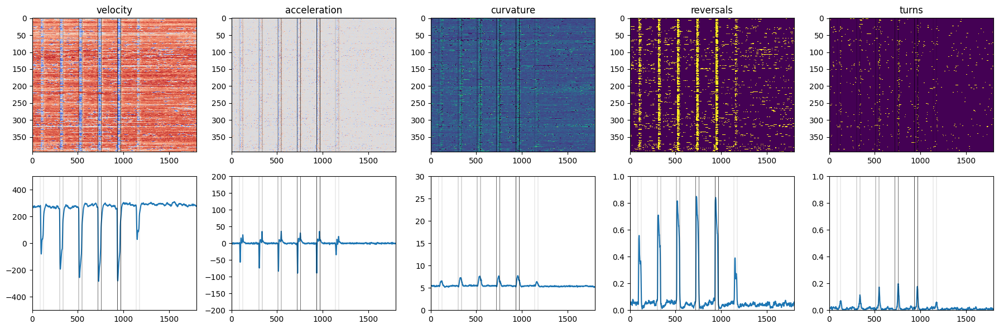

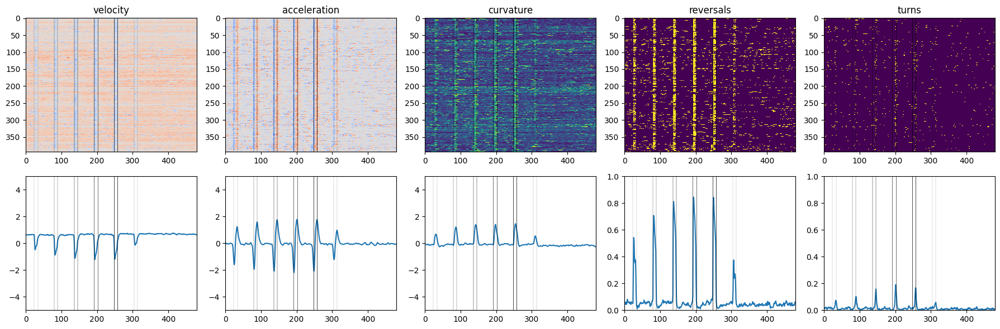

In [58]:

import pickle 
pickle_fname = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/worm_angles_concat_neural.pickle"
with open(pickle_fname, "rb") as handle:
    worm_angles_concat_neural, worm_radii_concat_neural, model_neural_directed = pickle.load(handle) 
    



pickle_fname = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/worm_angles_concat_beh.pickle"
with open(pickle_fname, "rb") as handle:
   worm_angles, worm_radii, model_beh_directed =  pickle.load( handle) 
    
    
from load_and_process_FB_data_fncs_1 import load_data, reformat_data,plot_data,  analyze_data, replace_outliers_exp
# experiment = "duty_cycle"
# condition = "exp"
# neuron = "AVA"
# path = "/Users/friederikebuck/beh_analysis_results/csv/_Aim1_AVA_duty_cycle/"


# experiment = "duty_cycle"
# condition = "exp"
# neuron = "AIB"
# path = "/Users/friederikebuck/beh_analysis_results/csv/_AIBC-3_Aim1_AIB_duty_cycle/"


experiment = "duty_cycle"
condition = "exp"
neuron = "RIM"
path = "/Users/friederikebuck/beh_analysis_results/csv/_Aim1_RIM_duty_cycle/"


exp_data = load_data(experiment, condition, neuron, path = path)


exp_vel, exp_acc, exp_curve, exp_rev, exp_pause, exp_turn, exp_body_angle_mag  = replace_outliers_exp(exp_data, exp_data[0].shape)

exp_onsets = plot_data(exp_vel, exp_acc, exp_curve, exp_rev, exp_turn, experiment, fps=6)

resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn = reformat_data(exp_vel, 
                                                                                             exp_acc,
                                                                                             exp_curve,
                                                                                             exp_rev,
                                                                                             exp_turn, 
                                                                                             exp_pause,
                                                                                             z_flat,
                                                                                             velocity, 
                                                                                             acceleration, 
                                                                                             worm_curvature,
                                                                                            #  X_all,  
                                                                                             plot=False, 
                                                                                             sep_pos_neg_resample = True)

onsets = plot_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, experiment, fps=1.6, orig = False)
resampled_onsets = onsets

###using body angle mag;
pickle_fname = f"/Users/friederikebuck/Downloads/worm notes/processed_checkpts/aim1_FB_beh_{neuron}_{condition}_{experiment}_phase_features_exp.pickle"
with open(pickle_fname, "rb") as handle:
    resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,behaviors_all,  inferred_phases_all, inferred_rad_all = pickle.load(handle) 
    

# Plot all worms -- LSTM

In [59]:


from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, TweedieRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import tree
import warnings
from predict_latency_prob_from_features_donut_6 import prep_FB_inputs, fit_visualize_model_classifiction, prep_FB_inputs_donut_only, prep_FB_inputs_features_only, fit_visualize_model_regression, latency_to_reversal
from predict_latency_prob_from_features_donut_6 import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only, feature_all_to_resampled, resample_2d
# # from predict_latency_prob_from_features_donut_6 import visualize_model_classification, combine_FB_features_across_stim, prep_FB_inputs_select_features_only, latency_to_reversal, fit_visualize_model_regression
from predict_latency_prob_from_features_donut_6 import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only

from predict_latency_prob_from_features_donut_6 import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only
from predict_latency_prob_from_features_donut_6 import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only
from predict_latency_prob_from_features_donut_6 import visualize_model_classification, combine_FB_features_across_stim
from predict_latency_prob_from_features_donut_6 import prep_FB_inputs_feature_and_donut, prep_FB_inputs_features_only
# from predict_latency_prob_from_features_donut import visualize_model_classification, combine_FB_features_across_stim


from predict_latency_prob_from_features_donut_6 import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only, feature_all_to_resampled

from predict_latency_prob_from_features_donut_6 import resample_2d, fit_visualize_model_regression, feature_all_to_resampled

from predict_latency_prob_from_features_donut_6 import visualize_model_regression


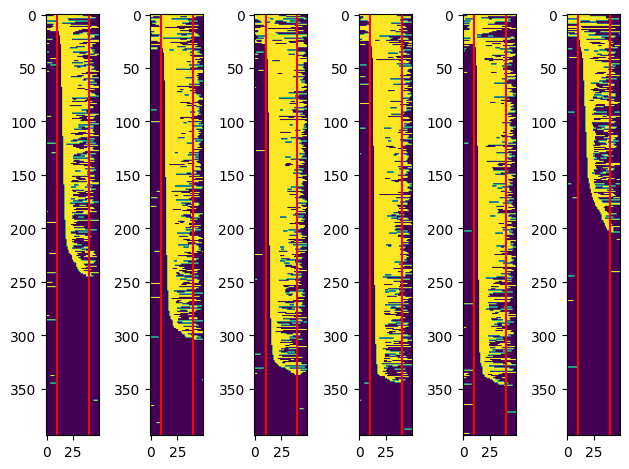

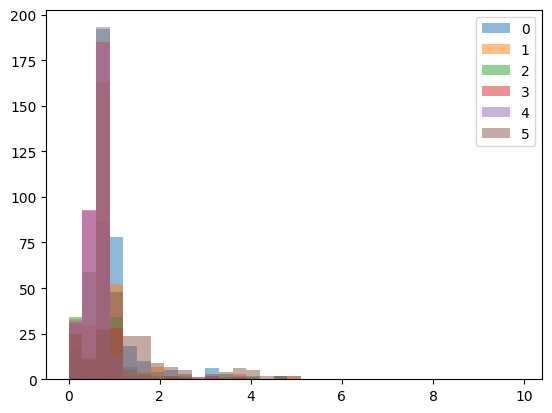

In [60]:
if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]

exp_offsets = np.array([exp_onsets[i] + 6*durations[i] for i in range(len(durations))])


fig,ax = plt.subplots(1,len(durations))
fig2,ax2 = plt.subplots()

latencies = []
for i in range(len(durations)):
    latency = latency_to_reversal(exp_rev, exp_onsets[i], max_latency = 6*durations[i]+1)
    idx = np.argsort(latency)
    ax[i].imshow(exp_rev[idx, -10+exp_onsets[i]:exp_offsets[i]+10], aspect="auto")
    ax[i].axvline(10, c='r')
    ax[i].axvline(10+6*durations[i], c='r')
    ax2.hist(latency/6, bins = np.arange(0,10,.3), alpha = 0.5, label=i)
    # latency[np.isnan(latency)] = np.nanmax(latency)+1
    latencies.append(latency)
fig.tight_layout()
latencies = np.array(latencies)/6
ax2.legend()

In [ ]:
# ###############
# ###############checkk get donut stim works** 
# ###get inputs into lstm 
# ###############
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import copy

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

import copy
import pickle
import matplotlib.cm as cm

import warnings
    
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, TweedieRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import tree


from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
import copy
import pickle

import pandas as pd 

from plot_donut_vs_phase import create_X_sequences


def feature_all_to_resampled(inferred_phases_all, n_tracks):
   
    inferred_phases_all = inferred_phases_all.reshape(n_tracks, -1)
   
    n_timesteps = inferred_phases_all.shape[1]
    print("n_timesteps", n_timesteps)
    # inferred_phases_all_shifted = np.zeros((n_tracks,n_timesteps+5+8))+np.nan #ask Bennet about the 8 extra time steps missing
    # inferred_phases_all_shifted[:, 5:-8] = inferred_phases_all
    
    inferred_phases_all_shifted = np.zeros((n_tracks,n_timesteps+5+8+8))+np.nan #ask Bennet about the 8 extra time steps missing
    inferred_phases_all_shifted[:, 5:-16] = inferred_phases_all
    return inferred_phases_all_shifted

def flatten_and_remove_nans(resampled_features):
    return resampled_features.flatten()

def prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, z,   T = 5
                #    times, beh_map, 
                #    lag=16, inclusion_thresh =3, 
                #    remove_revs=False, 
                  
                   ): 

    behavior_input = np.array(resampled_rev+2*resampled_turn, dtype=np.float64)
    behavior_input -= np.array(z).mean()
    behavior_input /= np.array(z).std()

    X_all_LSTM = []
    for new_worm_idx in range(len(resampled_vel)):
       
        X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], resampled_curve[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
        # X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
        X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)
        
        if T > 0:
            X_new_seq1 = create_X_sequences(X_new_tensor, T).numpy() #torch.Size([475, 5, 4]), = n_frames, time delay, 4 is the feature  #
        else: 
            X_new_seq1 = X_new_tensor.numpy()
        
        n_frames, delay, n_features = X_new_seq1.shape
        X_new_seq1 = X_new_seq1.reshape((n_frames,  delay*n_features)) # check how this is shaped it will be f1_t-T, f2_t-T, f3_t-T, f4_t-T, ; f1_t-T+1, f2_T+1, f3_T+1 f4_T+1
        
            
        X_all_LSTM.append(X_new_seq1)
    # X_all_LSTM = np.concatenate(X_all_LSTM, axis = 1 ) # i guess should check if reshape how it reshapes.. ie if feautres are all together or not 
    X_all_LSTM = np.array(X_all_LSTM)#shape (n_tracks, n_frames, n_features)
    # feature_names = np.array([[f"vel_t-{T - t - 1}", f"accel_t-{T - t - 1}",
    #                                f"curv_t-{T - t - 1}", f"beh_t-{T - t - 1}"]
    #                               for t in range(T)]).flatten()

    return X_all_LSTM


    
    
def plot_coeffs(model, feature_names, model_label,  n_time_steps, feature_names_ordered = None, xlim = None, coeffs = None):
    if coeffs is None: 
            
        try: 
            
            coeffs = model.coef_
        except: 
            # print(model.coef_.shape)
            coeffs = model.coef_[0]
            # coeffs = pd.Series(model.coef_[0], index=feature_names)
            
        if feature_names_ordered : 
            coeffs = coeffs.reshape(n_time_steps,-1 ).reshape((len(feature_names), -1), order='F').flatten()
            feature_names = feature_names.reshape( n_time_steps, -1).reshape((len(feature_names), -1), order='F').flatten()
    # if coeffs is None: 
    try: 
        coeffs = pd.Series(model.coef_, index=feature_names)
    except:
        coeffs = pd.Series(model.coef_[0], index=feature_names)
        # sort_indices = np.argsort(np.argsort(feature_names_ordered)[np.argsort(feature_names)])
        # coeffs = coeffs[sort_indices]
        # feature_names = feature_names[sort_indices]

    # Filter non-zero coefficients and sort
    # nonzero_coeffs = coeffs[coeffs != 0].sort_values()
    nonzero_coeffs = coeffs

    # Plot
    fig_height = max(2, 0.3 * len(nonzero_coeffs))
    fig, ax = plt.subplots(figsize=(8, fig_height))

    # Plot on ax
    nonzero_coeffs.plot(kind='barh', ax=ax)

    # Labels and formatting
    ax.set_xlabel("Coefficient Value")
    if xlim is not None: 
        
        ax.set_xlim(xlim)
    ax.set_title(f"{model_label} coefficients")
    ax.grid(True, axis='x')

    fig.tight_layout()
    return fig, ax 
    # plt.show()
    
def fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, get_coeff = True,  feature_names_ordered = None,  xlim = None, coeffs = None):
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    # model_label = f"{i}; logistic"
    print(f"{model_label}Accuracy:", accuracy_score(y_test, y_pred))
    print(f"{model_label}Precision:", precision_score(y_test, y_pred, average='weighted'))
    print(f"{model_label}Recall:", recall_score(y_test, y_pred, average='weighted'))
    print(f"{model_label}F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    disp = ConfusionMatrixDisplay.from_estimator(model, X_train,  y_train, cmap='Blues')
    disp.ax_.set_title(f"{model_label}train")
    disp = ConfusionMatrixDisplay.from_estimator(model, X_test,  y_test, cmap='Blues')
    disp.ax_.set_title(f"{model_label}test")
    if get_coeff:
        fig, ax = plot_coeffs(model, feature_names, model_label, n_time_steps, feature_names_ordered = feature_names_ordered, xlim = xlim, coeffs = coeffs)
        ax.set_title(f"{model_label}")
    return model, y_pred

def fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = None, coeffs = None):
    # model_real = copy.deepcopy(model)
    # model_real.fit(X_train, y_train)
    # print(f"{model_label} Linear Regression R²:", model.score(X_test, y_test))
    # # print("Coefficients:", model.coef_)
    # # model_label= f"{i};lin"
    # plot_results(model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered)
    fit_visualize_model_regression_vs_shuffle(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = feature_names_ordered, coeffs = coeffs)


def latency_to_reversal(reshaped_rev, start_time, max_latency=None):
    n_worms, T = reshaped_rev.shape
    latencies = np.full(n_worms, np.nan)

    for i in range(n_worms):
        end_time = T if max_latency is None else min(T, start_time + max_latency)
        future = reshaped_rev[i, start_time:end_time]
        reversal_indices = np.where(future)[0]
        if reversal_indices.size > 0:
            latencies[i] = reversal_indices[0]
    
    return latencies

    
def fit_visualize_model_regression_vs_shuffle(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = None, coeffs = None):
    model_real = copy.deepcopy(model)
    model_real.fit(X_train, y_train)
    # print(f"{model_label} Linear Regression R²:", model_real.score(X_test, y_test))
    # plot_results(model_real, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    # print("Coefficients:", model.coef_)
    # model_label= f"{i};lin"
    model_shuffle = copy.deepcopy(model)
    model_shuffle.fit(X_train, np.random.permutation(y_train))
    # plot_results(model_shuffle, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    
    
    y_pred_real = model_real.predict(X_test)
    fig, axs = plt.subplots(1,2)
    ax = axs[0]
    ax.scatter(y_test, y_pred_real, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    ax.set_title( f"{model_label}; R²:{np.round(model_real.score(X_test, y_test),2)}")
    
    y_pred_shuffled = model_shuffle.predict(X_test)
    ax = axs[1]
    ax.scatter(y_test, y_pred_shuffled, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    ax.set_title( f"{model_label}; shuffled; R²:{np.round(model_shuffle.score(X_test, y_test),2)}")
    # plt.tight_layout()
    y_pred_real = model_real.predict(X_train)
    fig, axs = plt.subplots(1,2)
    ax = axs[0]
    ax.scatter(y_train, y_pred_real, alpha=0.7)
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    ax.set_title( f"{model_label}; R²:{np.round(model_real.score(X_train, y_train),2)}")
    
    y_pred_shuffled = model_shuffle.predict(X_train)
    ax = axs[1]
    ax.scatter(y_train, y_pred_shuffled, alpha=0.7)
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    ax.set_title( f"{model_label}; shuffled; R²:{np.round(model_shuffle.score(X_train, y_train),2)}")
    # plt.tight_layout()
    
    plot_coeffs(model_real, feature_names,model_label,n_time_steps,   feature_names_ordered = feature_names_ordered, coeffs = coeffs)


def visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test,n_time_steps, feature_names_ordered = None, xlim = None, coeffs = None):
    model_real = copy.deepcopy(model)
    # model_real.fit(X_train, y_train)
    # # print(f"{model_label} Linear Regression R²:", model_real.score(X_test, y_test))
    # # plot_results(model_real, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    # # print("Coefficients:", model.coef_)
    # # model_label= f"{i};lin"
    # model_shuffle = copy.deepcopy(model)
    # model_shuffle.fit(X_train, np.random.permutation(y_train))
    # # plot_results(model_shuffle, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = feature_names_ordered, compare_to_suffle = compare_to_suffle  )
    
    
    y_pred_real = model_real.predict(X_test)
    fig, axs = plt.subplots(1,2)
    ax = axs[0]
    ax.scatter(y_test, y_pred_real, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    ax.set_title( f"{model_label}; R²:{np.round(model_real.score(X_test, y_test),2)}")
    
    # y_pred_shuffled = model_shuffle.predict(X_test)
    # ax = axs[1]
    # ax.scatter(y_test, y_pred_shuffled, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency")
    ax.set_ylabel("Test Predicted Latency")
    # test_r2 = model_shuffle.score(X_test, y_test)
    
    # ax.set_title( f"{model_label}; shuffled; R²:{np.round(test_r2,2)}")
    plt.tight_layout()
    y_pred_real = model_real.predict(X_train)
    # fig, ax = plt.subplots()
    ax = axs[1]
    ax.scatter(y_train, y_pred_real, alpha=0.7)
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    test_r2 = model_real.score(X_train, y_train)
    ax.set_title( f"{model_label}; R²:{np.round(test_r2,2)}")
    
    # y_pred_shuffled = model_shuffle.predict(X_train)
    # ax = axs[1]
    # ax.scatter(y_train, y_pred_shuffled, alpha=0.7)
    # ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency")
    ax.set_ylabel("Train Predicted Latency")
    # ax.set_title( f"{model_label}; shuffled; R²:{np.round(model_shuffle.score(X_train, y_train),2)}")
    plt.tight_layout()
    
    fig, ax = plot_coeffs(model, feature_names, model_label, n_time_steps, feature_names_ordered = feature_names_ordered, xlim = xlim, coeffs = coeffs)
    

############
##############

def prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks):
    phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
    radii_resampled = feature_all_to_resampled(inferred_rad_all, n_tracks) 
    
    X_donut_stim = np.concatenate([phase_resampled[:, resampled_onset, None] ,  radii_resampled[:, resampled_onset, None] ], axis = 1)
    # X_donut_stim = X_donut[:, resampled_onset,:]
    
    feature_names = ["phase", "radius"]
    return X_donut_stim, feature_names

    
def prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps, z,lstm_lag = 0, include_beh = False):
    # print("n_timesteps", n_timesteps)
    X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, resampled_onset,   n_timesteps,z, lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)

    X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks)

    X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
    feature_names_all = np.array(feature_names.tolist()+donut_names)
    return X_stim_all, feature_names_all


    
def visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, get_coeff = True,  feature_names_ordered = None,  xlim = None, coeffs = None):
    
    # model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"{model_label}Accuracy:", accuracy_score(y_test, y_pred))
    print(f"{model_label}Precision:", precision_score(y_test, y_pred, average='weighted'))
    print(f"{model_label}Recall:", recall_score(y_test, y_pred, average='weighted'))
    print(f"{model_label}F1 Score:", f1_score(y_test, y_pred, average='weighted'))
    # disp = ConfusionMatrixDisplay.from_estimator(model, X_train,  y_train, cmap='Blues')
    # disp.ax_.set_title(f"{model_label}train")
    disp = ConfusionMatrixDisplay.from_estimator(model, X_test,  y_test, cmap='Blues')
    disp.ax_.set_title(f"{model_label}test")
    if get_coeff:
        fig, ax = plot_coeffs(model, feature_names, model_label, n_time_steps, feature_names_ordered = feature_names_ordered, xlim = xlim, coeffs = coeffs)
        ax.set_title(f"{model_label}")
    return model, y_pred

def resample_fps(feature_arr, target_fps,  original_fps):
    # Resample using linear interpolation
    indices = np.arange(len(feature_arr))
    new_indices = np.linspace(0, len(feature_arr) - 1, int(len(feature_arr) * (target_fps / original_fps)))
    resampled_values = np.interp(new_indices, indices, feature_arr)
    return resampled_values

def resample_2d(inferred_phases_all_shifted, target_fps,  original_fps):
    n_tracks = inferred_phases_all_shifted.shape[0]
    resampled_tracks = []
    for track_i in range(n_tracks):
        resampled = resample_fps(inferred_phases_all_shifted[track_i, :], target_fps,  original_fps)
        resampled_tracks.append(resampled[None,:])

    inferred_phases_all_shifted_high_fps = np.concatenate(resampled_tracks, axis= 0 )
    return inferred_phases_all_shifted_high_fps



def plot_results_prediction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_time_steps, feature_names_ordered = None):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    fig, ax = plt.subplots()
    ax.scatter(y_test, y_pred, alpha=0.7)
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    ax.set_xlabel("Test Actual Latency (s) ")
    ax.set_ylabel("Test Predicted Latency (s) ")
    ax.set_title( f"{model_label}; R²:{model.score(X_test, y_test)}")
    ax.set_ylim([0,6])
    ax.set_xlim([0,6])
    
    
    
    y_pred = model.predict(X_train)
    fig, ax = plt.subplots()
    ax.scatter(y_train, y_pred, alpha=0.7)
    ax.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)
    ax.set_xlabel("Train Actual Latency (s) ")
    ax.set_ylabel("Train Predicted Latency (s) ")
    ax.set_title( f"{model_label}; R²:{model.score(X_train, y_train)}")
    ax.set_ylim([0,6])
    ax.set_xlim([0,6])
    
    plot_coeffs(model, feature_names,model_label,n_time_steps,   feature_names_ordered = feature_names_ordered)
  
  
def prep_FB_inputs_select_features_only(
                    features_list, feature_labels, 
                    resampled_onset,  n_timesteps,
                    z, 
                    lstm_lag = 0,
                    stim_onset = None, fps = None
                   ): 
    if fps is None: 
        fps = 1

    X_all_LSTM = []
    for new_worm_idx in range(len(features_list[0])):
        X_new_worm = np.stack([feature[new_worm_idx] for feature in features_list
                                ], axis=1)  
        feature_names = np.array([[f"{lbl}_t-{(n_timesteps - t - 1)/fps}" for lbl in feature_labels] for t in range(n_timesteps)]).flatten()
        X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)
        
        if n_timesteps> 0:
            X_new_seq1 = create_X_sequences(X_new_tensor, n_timesteps).numpy() #torch.Size([475, 5, 4]), = n_frames, time delay, 4 is the feature  #
        else: 
            X_new_seq1 = X_new_tensor.numpy()
        
        n_frames, delay, n_features = X_new_seq1.shape
        X_new_seq1 = X_new_seq1.reshape((n_frames,  delay*n_features)) # check how this is shaped it will be f1_t-T, f2_t-T, f3_t-T, f4_t-T, ; f1_t-T+1, f2_T+1, f3_T+1 f4_T+1

        
        X_all_LSTM.append(X_new_seq1)
    X_all_LSTM = np.array(X_all_LSTM)

    if stim_onset is None: 
        stim_onset = resampled_onset #- lstm_lag
    X_stim_features = X_all_LSTM[:, stim_onset, :]

    return X_stim_features, feature_names

def prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, resampled_onset,  n_timesteps, z,
                                 lstm_lag = 0,
                                 stim_onset = None, 
                                 include_beh = False, 
                                 fps = None
                   ): 

    behavior_input = np.array(resampled_rev+2*resampled_turn, dtype=np.float64)
    behavior_input -= np.array(z).mean()
    behavior_input /= np.array(z).std()
    if fps is None: 
        fps = 1

    X_all_LSTM = []
    for new_worm_idx in range(len(resampled_vel)):
        if include_beh:
            X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], resampled_curve[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  

            feature_names = np.array([[f"vel_t-{np.round((n_timesteps - t - 1)/fps, 2)}", f"accel_t-{np.round((n_timesteps - t - 1)/fps, 2)}",
                                f"curv_t-{np.round((n_timesteps - t - 1)/fps, 2)}", f"beh_t-{np.round((n_timesteps - t - 1)/fps, 2)}"]
                                for t in range(n_timesteps)]).flatten()
        else: 
            X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], resampled_curve[new_worm_idx], 
                                   
                                #    behavior_input[new_worm_idx]
                                   
                                   ], axis=1)  
            feature_names = np.array([[f"vel_t-{np.round((n_timesteps - t - 1)/fps, 2)}", f"accel_t-{np.round((n_timesteps - t - 1)/fps, 2)}",
                                f"curv_t-{np.round((n_timesteps - t - 1)/fps, 2)}"]
                                for t in range(n_timesteps)]).flatten()
        # X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
        X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)
        
        if n_timesteps> 0:
            X_new_seq1 = create_X_sequences(X_new_tensor, n_timesteps).numpy() #torch.Size([475, 5, 4]), = n_frames, time delay, 4 is the feature  #
        else: 
            X_new_seq1 = X_new_tensor.numpy()
        
        n_frames, delay, n_features = X_new_seq1.shape
        X_new_seq1 = X_new_seq1.reshape((n_frames,  delay*n_features)) # check how this is shaped it will be f1_t-T, f2_t-T, f3_t-T, f4_t-T, ; f1_t-T+1, f2_T+1, f3_T+1 f4_T+1

        
        X_all_LSTM.append(X_new_seq1)
    # X_all_LSTM = np.concatenate(X_all_LSTM, axis = 1 ) # i guess should check if reshape how it reshapes.. ie if feautres are all together or not 
    X_all_LSTM = np.array(X_all_LSTM)#shape (n_tracks, n_frames, n_features)

    if stim_onset is None: 
        stim_onset = resampled_onset #- lstm_lag
    X_stim_features = X_all_LSTM[:, stim_onset, :]
    # X_stim_features = X_all_LSTM[:, resampled_onset - lstm_lag, :]

    return X_stim_features, feature_names


def combine_FB_features_across_stim(
    stim_i_to_features,stim_i_to_Ys,  feature_names, 
  
                   ): 
    feature_names_all = np.array(feature_names.tolist()+[f"stim_{stim_i}" for stim_i in stim_i_to_features.keys()])
    
    all_stim_X_stim_features  = []
    all_stim_Y = []
    n_stim = len(stim_i_to_features.keys())
    for i, (stim_i, X_stim_features) in enumerate(stim_i_to_features.items()):
        n_frames, n_features = X_stim_features.shape
        stim_bin_features = np.zeros((n_frames,n_stim ))
        stim_bin_features[:, i] = 1
        all_stim_X_stim_features.append(np.concatenate([X_stim_features, stim_bin_features], axis =1))
        all_stim_Y.append(stim_i_to_Ys[stim_i])
    all_stim_X_stim_features = np.concatenate(all_stim_X_stim_features, axis =0)
    all_stim_Y = np.concatenate(all_stim_Y, axis = 0 )
        
    
    return all_stim_X_stim_features, all_stim_Y, feature_names_all


In [ ]:

def prep_data_latency(X_stim_all, Y_latency):
    valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() 
    X_stim_all_latency = X_stim_all[valid_indices]
    Y_latency_valid = Y_latency[valid_indices]
    return Y_latency_valid, X_stim_all_latency


def prep_data_rev_prob(X_stim_all, Y_latency):
    no_rev_at_onset = Y_latency!=0
    Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
    X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
    return X_prob, Y_prob

def fit_eval_lasso(X_train, X_test, y_train, y_test):
    alphas = np.logspace(-4, 2, 20)
    lasso = Lasso(max_iter=10000)
    grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    score = score_fnc(y_test, y_pred)
    return best_model, y_pred, score
def fit_eval_linearSVC(X_train, X_test, y_train, y_test):
    
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100]
    }

    model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
    # Grid search
    grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
    grid.fit(X_train, y_train)
    c = grid.best_params_['C']
    best_model = grid.best_estimator_
    
    y_pred = best_model.predict(X_test)
    score = balanced_accuracy_score(y_test, y_pred)  


    return best_model, y_pred, score

def train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               single_feature = False, 
                               rev_bin = None, 
                               all_timesteps = None
                            ):
    fig, ax = plt.subplots()
    best_models = {} 
    all_scores_per_i = {}
    results_dict = {}
    for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
        
        onset = data_onset-1
        score_means = []
        score_stds = []
        n_timesteps_list = []
        Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
        if rev_bin is not None: 
            fig3, ax3 = plt.subplots(figsize = (8,20))
            vline = onset - lstm_lag
            sort = np.argsort(Y_latency)
            ax3.imshow(rev_bin[sort, vline-25:vline+25])
            
            ax3.set_title(f"onset: {onset}")
            ax3.axvline(25, color = "red")
            
        
        if all_timesteps is None: 
            all_timesteps = range(1, 15, 3)

        for n_timesteps in all_timesteps:
            print("i, n_timesteps",i,  n_timesteps)
            scores = []
            models = []

        

            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, fps = fps
                            )
            


            
            X,Y = data_prep_fnc(X_stim_all, Y_latency)



            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X, Y, test_size=test_size, random_state=split_idx)
                best_model, y_pred, score = model_fit_fnc(X_train, X_test, y_train, y_test)
                scores.append(score)
                models.append((best_model,X_train, X_test, y_train, y_test))

            scores_mean = np.mean(scores)
            scores_std = np.std(scores)
            best_model_idx = np.argmax(scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = scores
            score_means.append(scores_mean)
            score_stds.append(scores_std)
            results_dict[(i, n_timesteps)] = (scores_mean, scores_std)
            best_models[(i, n_timesteps)] = best_model_overall
            

        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(title_label)
        ax.set_xlabel("max time delay (sec)")
        ax.set_ylabel("balanced accuracy")
        ax.legend()
        plt.grid(True)
        plt.tight_layout()


    n_timesteps = all_timesteps[-2]
    for i in range(len(exp_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 

        model_label= f"{title_label}; stim{i}"#; lasso_a{np.round(alpha,2)}"
        if single_feature: 
            feature_lbl = feature_labels[0]
            feature_names = np.array([[f"{feature_lbl}_t-{np.round((n_timesteps - t - 1)/fps, 2)}"]
                                for t in range(n_timesteps)]).flatten()
            result_visualization_fnc(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-2,1])
            
        else: 
            _,  feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag,  fps = fps
                            )
            print("feature_names_all",feature_names_all)
            result_visualization_fnc(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])
    
def train_model_single_feature(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               rev_bin = None, 
                               all_timesteps= None
                               ):
    
    
    for feature, feature_lbl in zip(feature_list, feature_labels
                                                    ):
        
        single_feature_list = [feature]
        single_feature_labels = [feature_lbl]
        train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               single_feature_list, 
                               single_feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size =test_size, 
                               n_splits = n_splits, 
                               lstm_lag = lstm_lag, 
                               single_feature = True, 
                               rev_bin = rev_bin, 
                               all_timesteps  = all_timesteps
                            )
        

    plt.show()


In [ ]:
####get rev prob; resampled  all beh feature s
feature_list = [resampled_vel, resampled_acc, resampled_curve]
feature_labels = ["vel", "accel", "curv"]
data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
data_onsets = resampled_onsets
title_label = f"{neuron}; Reversal prediction;\n Mean ± STD balanced accuracy"
fps = 1.6
train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               single_feature = False, 
                               rev_bin = resampled_rev
                            )
   

In [ ]:
####get rev prob; resampled  single feature 
feature_list = [resampled_vel, resampled_acc, resampled_curve]
feature_labels = ["vel", "accel", "curv"]
data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
data_onsets = resampled_onsets
title_label = f"{neuron}; Reversal prediction;\n Mean ± STD balanced accuracy"
fps = 1.6
train_model_single_feature(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0
                           )


In [ ]:
####get rev prob; resampled  all features

####get rev prob; resampled  single feature phase

In [ ]:
feature_list = [exp_vel, exp_acc, exp_curve]
feature_labels = ["vel", "accel", "curv"]
data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
data_onsets = exp_onsets
fps = 6
lstm_lag = 0
train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = lstm_lag, 
                               single_feature = False, 
                               rev_bin = exp_rev, 
                               all_timesteps = np.arange(1,15,5)
                            )
   

In [ ]:
feature_list = [exp_vel,exp_acc, exp_curve]
feature_labels = ["vel", "accel", "curv"]
data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
itle_label = f"{neuron}; Reversal prediction;\n Mean ± STD balanced accuracy; exp fps"

data_onsets = exp_onsets
fps = 6
train_model_single_feature(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               rev_bin = exp_rev
                           )


In [ ]:
# feature_list = [exp_vel,exp_acc, exp_curve]
# feature_labels = ["vel", "accel", "curv"]
feature_list = [exp_rev, exp_vel,exp_acc, exp_curve]
feature_labels = ["rev", "vel", "accel", "curv"]
data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
itle_label = f"{neuron}; Reversal prediction;\n Mean ± STD balanced accuracy; exp fps"

data_onsets = exp_onsets
fps = 6
###TODO print exp_rev vals around onset for both resampled and exp features 
train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               single_feature = False, 
                               rev_bin = exp_rev
                            )


feature_list = [resampled_rev, resampled_vel, resampled_acc, resampled_curve]
feature_labels = ["rev", "vel", "accel", "curv"]
data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
itle_label = f"{neuron}; Reversal prediction;\n Mean ± STD balanced accuracy; exp fps"

data_onsets = resampled_onsets
fps = 1.6
train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               single_feature = False
                            )



In [81]:
# ##########Test single feature precdcition - exp frame rate ###figuer wout why this is different ahtn above 



# with warnings.catch_warnings():


#     warnings.simplefilter("ignore")
#     fps = 6
#     test_size = 0.3
#     for feature, feature_lbl in zip([exp_vel, exp_acc, exp_curve], ["vel", "accel", "curv"]):
#         print("feature_lbl", feature_lbl)
#         include_beh = False
#         n_tracks = resampled_rev.shape[0]
#         n_splits = 10
#         results_dict = {}  # Store mean/std r² per i and n_timesteps
#         best_models = {}   # Store best model per (i, n_timesteps)
        
#         idxs = [[0],[1],[2],[3],[4],[5]]
#         fig, ax = plt.subplots()
#         for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
#             score_means = []
#             score_stds = []
#             # all_r2_means = []
#             all_scores_per_i = {}
#             n_timesteps_list = []
#             onset = exp_onset-1
            
#             Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 

#             fig3, ax3 = plt.subplots(figsize = (8,20))
#             vline = onset
#             sort = np.argsort(Y_latency)
#             ax3.imshow(exp_rev[sort, vline-25:vline+25])
#             ax3.set_title(f"onset: {onset}")
#             ax3.axvline(25, color = "red")

#             for n_timesteps in range(1, 15, 3):
#             # for n_timesteps in range(1, 15, 1):
#                 print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

#                 # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
#                 # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
#                 # X_stim_all1, _ = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
#                 features_list = [feature]
#                 feature_labels = [feature_lbl]
#                 X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
#                     features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
#                                 )

#                 Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
#                 no_rev_at_onset = Y_latency!=0
#                 Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
#                 X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
                
#                 balanced_accuracy_scores = []
#                 models = []

#                 for split_idx in range(n_splits):
#                     # X_train, X_test, y_train, y_test = train_test_split(
#                     #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                    
#                     X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
#                     param_grid = {
#                         'C': [0.001, 0.01, 0.1, 1, 10, 100]
#                     }

#                     model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
#                     # Grid search
#                     grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
#                     grid.fit(X_train, y_train)
#                     c = grid.best_params_['C']
#                     best_model = grid.best_estimator_
                    
#                     y_pred = best_model.predict(X_test)
#                     score =balanced_accuracy_score(y_test, y_pred)  

#                     balanced_accuracy_scores.append(score)
#                     # models.append(best_model)
#                     models.append((best_model,X_train, X_test, y_train, y_test, c))

#                 accuracy_mean = np.mean(balanced_accuracy_scores)
#                 accuracy_std = np.std(balanced_accuracy_scores)
#                 best_model_idx = np.argmax(balanced_accuracy_scores)
#                 best_model_overall = models[best_model_idx]

#                 # Save results
#                 n_timesteps_list.append(n_timesteps)
#                 # all_r2_means.append(r2s)
#                 all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
#                 score_means.append(accuracy_mean)
#                 score_stds.append(accuracy_std)
#                 results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
#                 best_models[(i, n_timesteps)] = best_model_overall


#             # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
#             ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
#                         fmt='-o', capsize=5, label = f"stim {i}")

#             ax.set_title(f"{neuron}; {feature_lbl} only; Reversal prediction;\n Mean ± STD balanced accuracy")
#             ax.set_xlabel("max time delay (sec)")
#             ax.set_ylabel("balanced accuracy")
#         ax.legend()
#         plt.grid(True)
#         plt.tight_layout()
#         # plt.savefig(f"r2_plot_i{i}.png")
#         # plt.close()

#         n_timesteps = 10
#         include_beh = False
        
#         feature_names = np.array([[f"{feature_lbl}_t-{(n_timesteps - t - 1)/fps}"]
#                                     for t in range(n_timesteps)]).flatten()

#         for i in range(len(resampled_onsets)):
#             model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#             model_label= f"{neuron} stim: {i}; linear SVC; {feature_lbl}] only "#; lasso_a{np.round(alpha,2)}"
#             visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, get_coeff = True, coeffs = model.coef_[0])#, xlim = [-1,1])
            
# plt.show()


feature_lbl vel

Processing i=0, n_timesteps=1

Processing i=0, n_timesteps=4

Processing i=0, n_timesteps=7

Processing i=0, n_timesteps=10

Processing i=0, n_timesteps=13

Processing i=1, n_timesteps=1

Processing i=1, n_timesteps=4

Processing i=1, n_timesteps=7

Processing i=1, n_timesteps=10

Processing i=1, n_timesteps=13

Processing i=2, n_timesteps=1

Processing i=2, n_timesteps=4

Processing i=2, n_timesteps=7

Processing i=2, n_timesteps=10

Processing i=2, n_timesteps=13

Processing i=3, n_timesteps=1

Processing i=3, n_timesteps=4

Processing i=3, n_timesteps=7

Processing i=3, n_timesteps=10

Processing i=3, n_timesteps=13

Processing i=4, n_timesteps=1

Processing i=4, n_timesteps=4

Processing i=4, n_timesteps=7

Processing i=4, n_timesteps=10

Processing i=4, n_timesteps=13

Processing i=5, n_timesteps=1

Processing i=5, n_timesteps=4

Processing i=5, n_timesteps=7

Processing i=5, n_timesteps=10

Processing i=5, n_timesteps=13
RIM stim: 0; linear SVC; vel] only Accurac

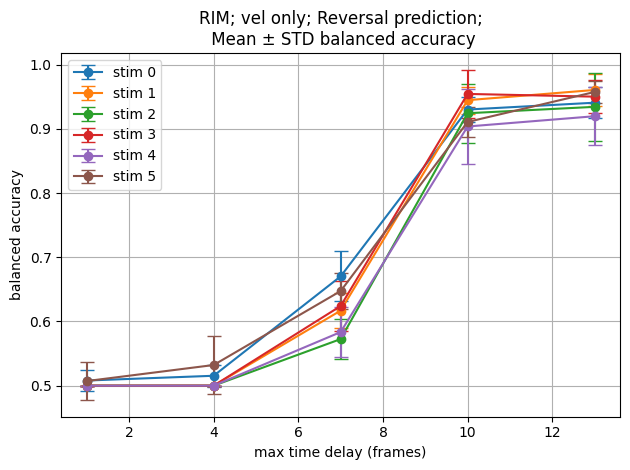

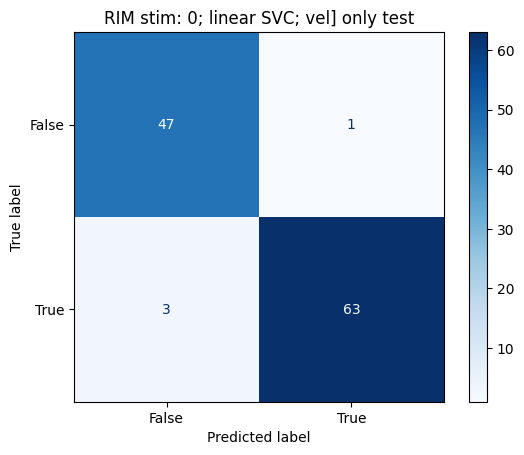

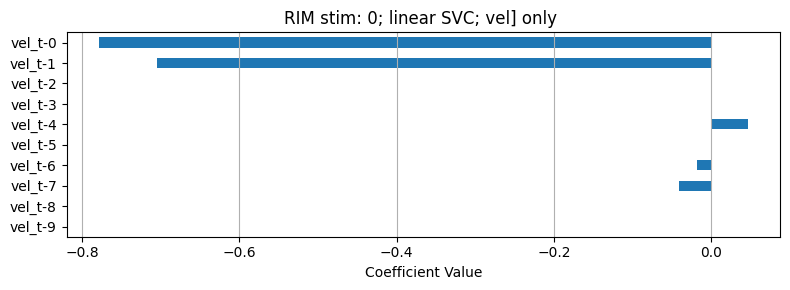

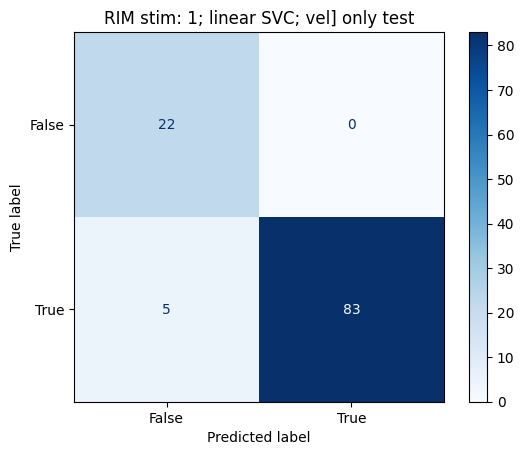

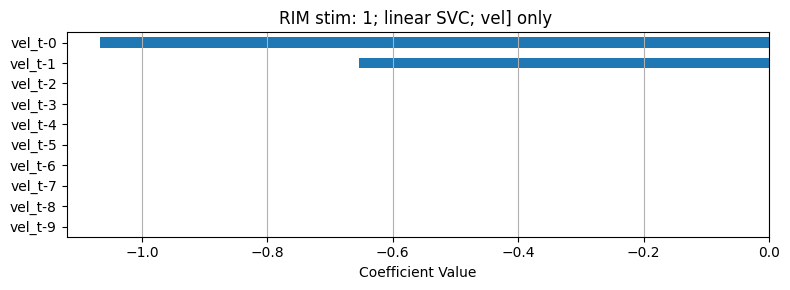

...

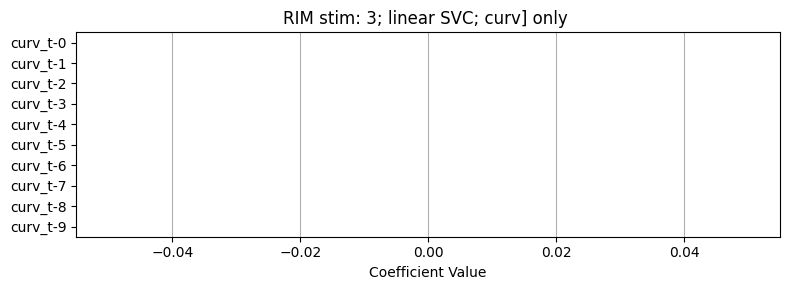

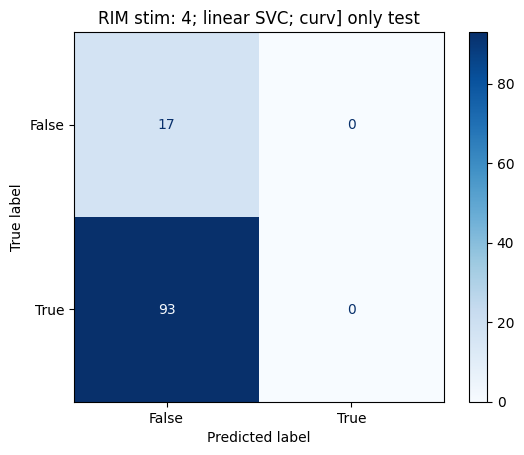

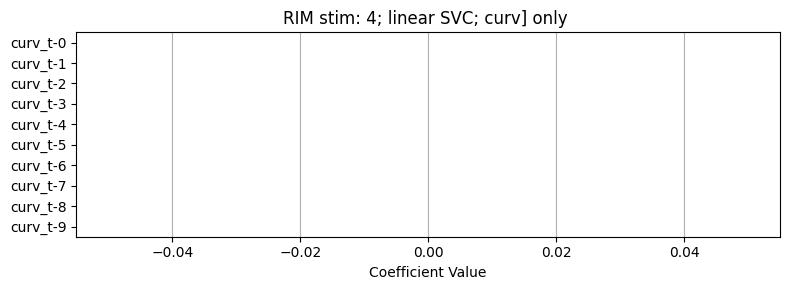

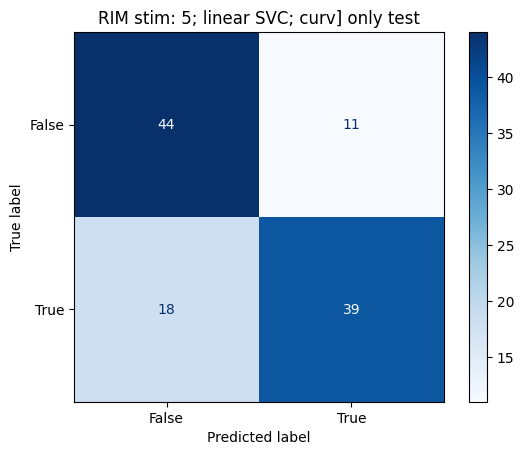

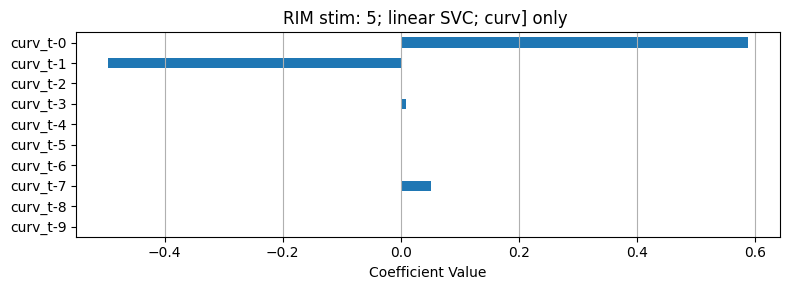

In [ ]:


###############look at single feature contribution - resmapled fps 
with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    fps = 1.6
    
    for feature, feature_lbl in zip([resampled_vel, resampled_acc, resampled_curve], ["vel", "accel", "curv"]):
        print("feature_lbl", feature_lbl)
        include_beh = False
        n_tracks = resampled_rev.shape[0]
        n_splits = 10
        results_dict = {}  # Store mean/std r² per i and n_timesteps
        best_models = {}   # Store best model per (i, n_timesteps)
        lstm_lag = 0
        idxs = [[0],[1],[2],[3],[4],[5]]
        fig, ax = plt.subplots()
        for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
            

            score_means = []
            score_stds = []
            # all_r2_means = []
            all_scores_per_i = {}
            n_timesteps_list = []
            onset = resampled_onset-1
            
                        ########
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            # if rev_bin is not None: 
            fig3, ax3 = plt.subplots(figsize = (8,20))
            vline = onset - lstm_lag
            sort = np.argsort(Y_latency)
            ax3.imshow(resampled_rev[sort, vline-25:vline+25])
            
            ax3.set_title(f"onset: {onset}")
            ax3.axvline(25, color = "red")
            ########


            for n_timesteps in range(1, 15, 3):
            # for n_timesteps in range(1, 15, 1):
                print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

                # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
                # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
                # X_stim_all1, _ = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
                features_list = [feature]
                feature_labels = [feature_lbl]
                X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                    # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                    features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
                
                                )
                
                fig, ax = plt.subplots()
                ax.imshow(resampled_rev)
                ax.set_title(f"n_timesteps: {n_timesteps}")
                ax.axvline(onset - lstm_lag, color = "red")
                
                # print(np.all(X_stim_all1==X_stim_all))
                Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
                no_rev_at_onset = Y_latency!=0
                Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
                X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
                
                ###    
                # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
                balanced_accuracy_scores = []
                models = []

                for split_idx in range(n_splits):
                    # X_train, X_test, y_train, y_test = train_test_split(
                    #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                    
                    X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                    
                    param_grid = {
                        'C': [0.001, 0.01, 0.1, 1, 10, 100]
                    }

                    model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                    # Grid search
                    grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                    grid.fit(X_train, y_train)
                    c = grid.best_params_['C']
                    best_model = grid.best_estimator_
                    
                    y_pred = best_model.predict(X_test)
                    score =balanced_accuracy_score(y_test, y_pred)  

                    balanced_accuracy_scores.append(score)
                    # models.append(best_model)
                    models.append((best_model,X_train, X_test, y_train, y_test, c))

                accuracy_mean = np.mean(balanced_accuracy_scores)
                accuracy_std = np.std(balanced_accuracy_scores)
                best_model_idx = np.argmax(balanced_accuracy_scores)
                best_model_overall = models[best_model_idx]

                # Save results
                n_timesteps_list.append(n_timesteps)
                # all_r2_means.append(r2s)
                all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
                score_means.append(accuracy_mean)
                score_stds.append(accuracy_std)
                results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
                best_models[(i, n_timesteps)] = best_model_overall


            # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
            ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                        fmt='-o', capsize=5, label = f"stim {i}")

            ax.set_title(f"{neuron}; {feature_lbl} only; Reversal prediction;\n Mean ± STD balanced accuracy")
            ax.set_xlabel("max time delay (frames)")
            ax.set_ylabel("balanced accuracy")
        ax.legend()
        plt.grid(True)
        plt.tight_layout()
        # plt.savefig(f"r2_plot_i{i}.png")
        # plt.close()

        n_timesteps = 10
        feature_names = np.array([[f"{feature_lbl}_t-{(n_timesteps - t - 1)/fps}"]
                                    for t in range(n_timesteps)]).flatten()

        for i in range(len(resampled_onsets)):
            model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

            model_label= f"{neuron} stim: {i}; linear SVC; {feature_lbl}] only "#; lasso_a{np.round(alpha,2)}"
            visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, get_coeff = True, coeffs = model.coef_[0])#, xlim = [-1,1])
            
plt.show()


feature_lbl vel

Processing i=0, n_timesteps=1
['vel_t-0']
['vel_t-0']

Processing i=1, n_timesteps=1
['vel_t-0']
['vel_t-0']

Processing i=2, n_timesteps=1
['vel_t-0']
['vel_t-0']

Processing i=3, n_timesteps=1
['vel_t-0']
['vel_t-0']

Processing i=4, n_timesteps=1
['vel_t-0']
['vel_t-0']

Processing i=5, n_timesteps=1
['vel_t-0']
['vel_t-0']
feature_lbl accel

Processing i=0, n_timesteps=1
['accel_t-0']
['accel_t-0']

Processing i=1, n_timesteps=1
['accel_t-0']
['accel_t-0']

Processing i=2, n_timesteps=1
['accel_t-0']
['accel_t-0']

Processing i=3, n_timesteps=1
['accel_t-0']
['accel_t-0']

Processing i=4, n_timesteps=1
['accel_t-0']
['accel_t-0']

Processing i=5, n_timesteps=1
['accel_t-0']
['accel_t-0']
feature_lbl curv

Processing i=0, n_timesteps=1
['curv_t-0']
['curv_t-0']

Processing i=1, n_timesteps=1
['curv_t-0']
['curv_t-0']

Processing i=2, n_timesteps=1
['curv_t-0']
['curv_t-0']

Processing i=3, n_timesteps=1
['curv_t-0']
['curv_t-0']

Processing i=4, n_timesteps=1
['curv

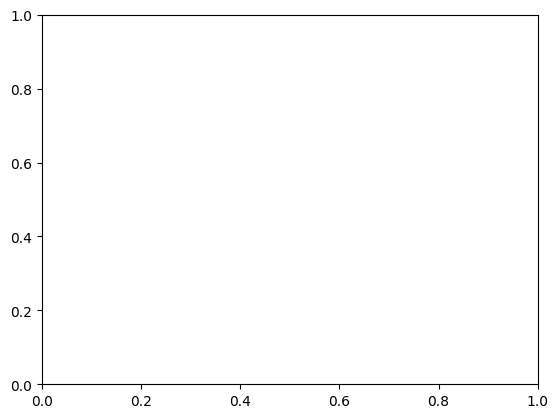

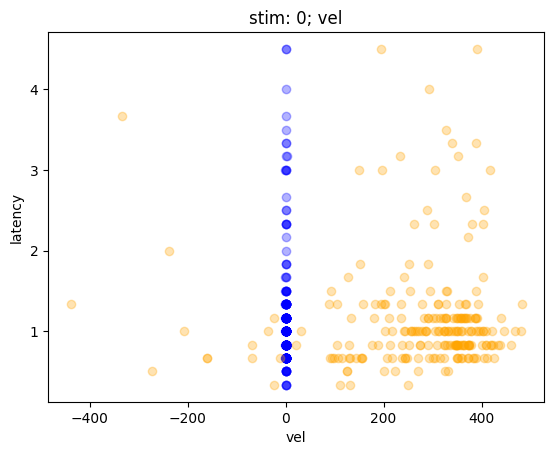

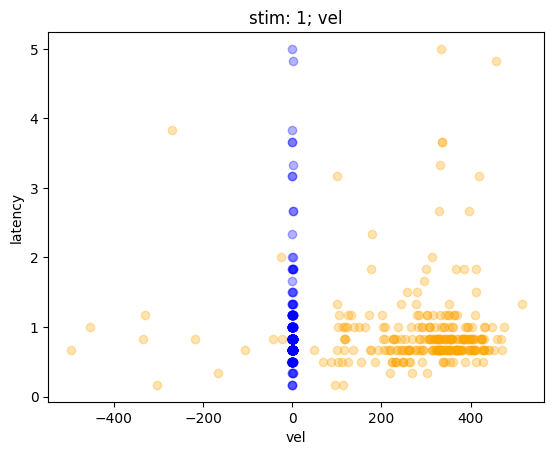

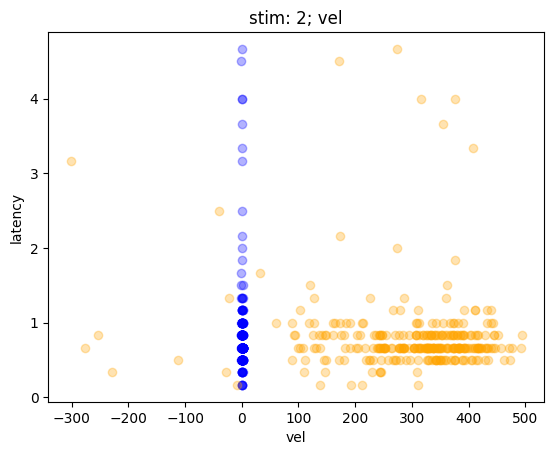

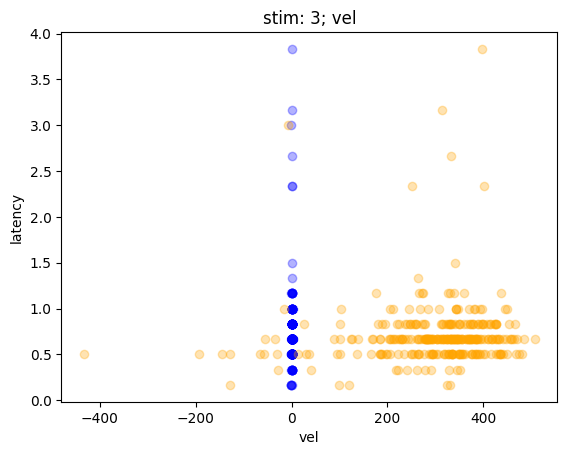

...

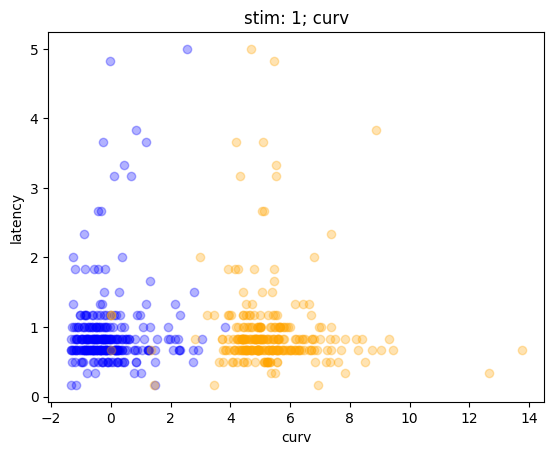

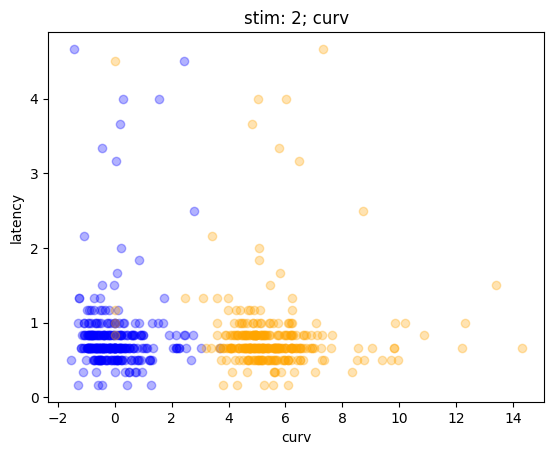

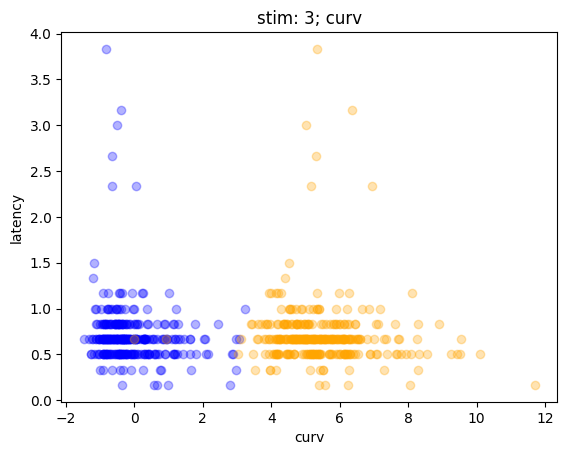

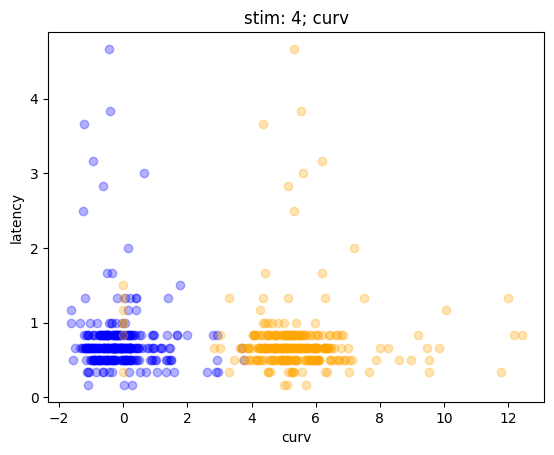

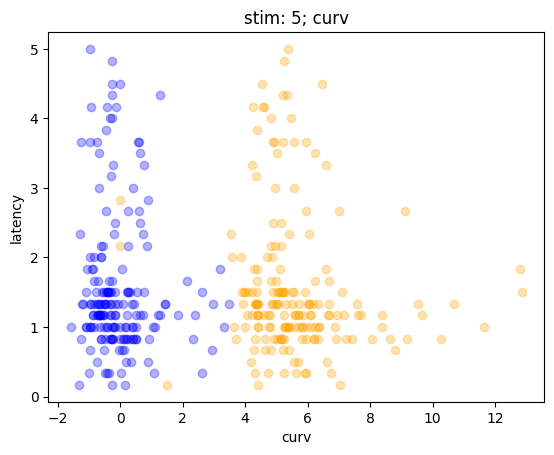

In [ ]:


with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    
    for feature, exp_feature, feature_lbl in zip([resampled_vel, resampled_acc, resampled_curve],
                                                 [exp_vel, exp_acc, exp_curve], 
                                                 ["vel", "accel", "curv"]):
        print("feature_lbl", feature_lbl)
        include_beh = False
        n_tracks = resampled_rev.shape[0]
        n_splits = 10
        results_dict = {}  # Store mean/std r² per i and n_timesteps
        best_models = {}   # Store best model per (i, n_timesteps)
        lstm_lag = 0
        idxs = [[0],[1],[2],[3],[4],[5]]
        fig, ax = plt.subplots()
        for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
            score_means = []
            score_stds = []
            # all_r2_means = []
            all_scores_per_i = {}
            n_timesteps_list = []
            onset = resampled_onset-1
            n_timesteps = 1
            # for n_timesteps in range(1, 15, 3):
            # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
            # X_stim_all1, _ = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
            features_list = [feature]
            feature_labels = [feature_lbl]
            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
            
                            )
            
            # X_stim_features = X_all_LSTM[:, stim_onset, :]

            
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            Y_latency1 = Y_latency[no_rev_at_onset]
            print(feature_names_all)
            fig, ax = plt.subplots()
            ax.scatter(X_prob.flatten(), Y_latency1, color = "blue", alpha = 0.3)
            
            
            
            
            features_list = [exp_feature]
            feature_labels = [feature_lbl]
            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                features_list, feature_labels, exp_onset-1,  n_timesteps, z, lstm_lag = lstm_lag, 
            
                            )
            
                        
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            Y_latency1 = Y_latency[no_rev_at_onset]
            print(feature_names_all)
            # fig, ax = plt.subplots()
            
            ax.scatter(X_prob.flatten(), Y_latency1, color = "orange", alpha = 0.3)
            
            
            
            ax.set_title(f"stim: {i}; {feature_lbl}")
            ax.set_xlabel(f"{feature_lbl}")
            ax.set_ylabel(f"latency")
            
        ##plot smoothed phase vss curvature 



In [ ]:

# with warnings.catch_warnings():
        
#     # ##get inputs into lstm 
#     # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

#     warnings.simplefilter("ignore")
#     include_beh = False
#     fps = 1.6
#     n_tracks = resampled_rev.shape[0]
#     n_splits = 10
#     results_dict = {}  # Store mean/std r² per i and n_timesteps
#     best_models = {}   # Store best model per (i, n_timesteps)
#     lstm_lag = 0
#     idxs = [[0],[1],[2],[3],[4],[5]]
#     fig, ax = plt.subplots()
#     for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
#         score_means = []
#         score_stds = []
#         # all_r2_means = []
#         all_scores_per_i = {}
#         n_timesteps_list = []
#         onset = resampled_onset-1

#         for n_timesteps in range(1, 15, 3):
#         # for n_timesteps in range(1, 15, 1):
#             print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

#             # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
#             X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)

            
#             Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
#             no_rev_at_onset = Y_latency!=0
#             Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
#             X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
#             ###    
#             # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
#             balanced_accuracy_scores = []
#             models = []

#             for split_idx in range(n_splits):
#                 # X_train, X_test, y_train, y_test = train_test_split(
#                 #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
#                 X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
#                 param_grid = {
#                     'C': [0.001, 0.01, 0.1, 1, 10, 100]
#                 }

#                 model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
#                 # Grid search
#                 grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
#                 grid.fit(X_train, y_train)
#                 c = grid.best_params_['C']
#                 best_model = grid.best_estimator_
                
#                 y_pred = best_model.predict(X_test)
#                 score =balanced_accuracy_score(y_test, y_pred)  

#                 balanced_accuracy_scores.append(score)
#                 # models.append(best_model)
#                 models.append((best_model,X_train, X_test, y_train, y_test, c))

#             accuracy_mean = np.mean(balanced_accuracy_scores)
#             accuracy_std = np.std(balanced_accuracy_scores)
#             best_model_idx = np.argmax(balanced_accuracy_scores)
#             best_model_overall = models[best_model_idx]

#             # Save results
#             n_timesteps_list.append(n_timesteps)
#             # all_r2_means.append(r2s)
#             all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
#             score_means.append(accuracy_mean)
#             score_stds.append(accuracy_std)
#             results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
#             best_models[(i, n_timesteps)] = best_model_overall


#         # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
#         ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
#                     fmt='-o', capsize=5, label = f"stim {i}")

#         ax.set_title(f"{neuron}; features only; Reversal prediction;\n Mean ± STD balanced accuracy")
#         ax.set_xlabel("max time delay (seconds)")
#         ax.set_ylabel("balanced accuracy")
#     ax.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     # plt.savefig(f"r2_plot_i{i}.png")
#     # plt.close()

# n_timesteps = 10
# include_beh = False


# feature_names = np.array([[f"vel_t-{(n_timesteps - t - 1)/fps}", f"accel_t-{(n_timesteps - t - 1)/fps}",
#                         f"curv_t-{(n_timesteps - t - 1)/fps}"]
#                         for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#     model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
#     visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
# plt.show()

    




Processing i=0, n_timesteps=1

Processing i=0, n_timesteps=4

Processing i=0, n_timesteps=7

Processing i=0, n_timesteps=10

Processing i=0, n_timesteps=13

Processing i=1, n_timesteps=1

Processing i=1, n_timesteps=4

Processing i=1, n_timesteps=7

Processing i=1, n_timesteps=10

Processing i=1, n_timesteps=13

Processing i=2, n_timesteps=1

Processing i=2, n_timesteps=4

Processing i=2, n_timesteps=7

Processing i=2, n_timesteps=10

Processing i=2, n_timesteps=13

Processing i=3, n_timesteps=1

Processing i=3, n_timesteps=4

Processing i=3, n_timesteps=7

Processing i=3, n_timesteps=10

Processing i=3, n_timesteps=13

Processing i=4, n_timesteps=1

Processing i=4, n_timesteps=4

Processing i=4, n_timesteps=7

Processing i=4, n_timesteps=10

Processing i=4, n_timesteps=13

Processing i=5, n_timesteps=1

Processing i=5, n_timesteps=4

Processing i=5, n_timesteps=7

Processing i=5, n_timesteps=10

Processing i=5, n_timesteps=13
RIM stim: 0; linear SVC; Features only Accuracy: 0.9736842

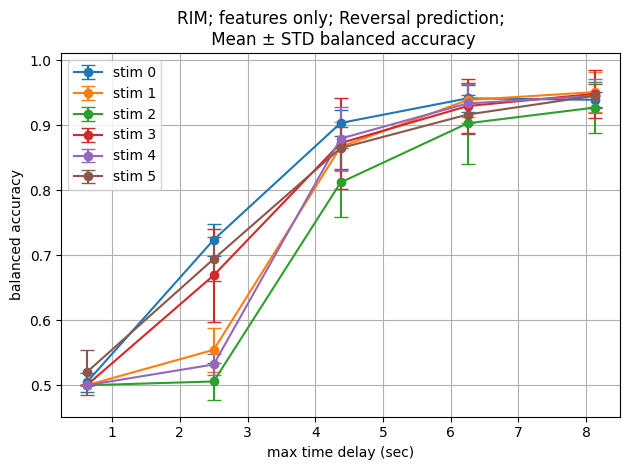

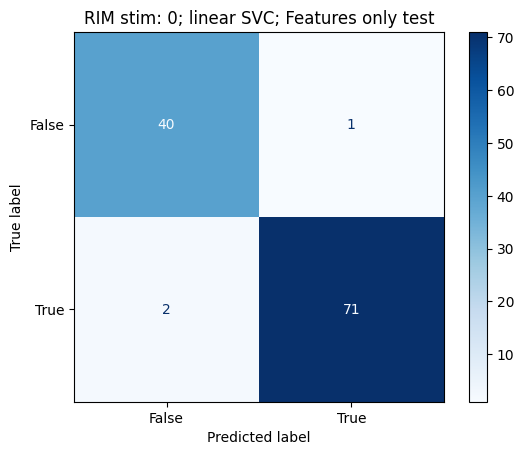

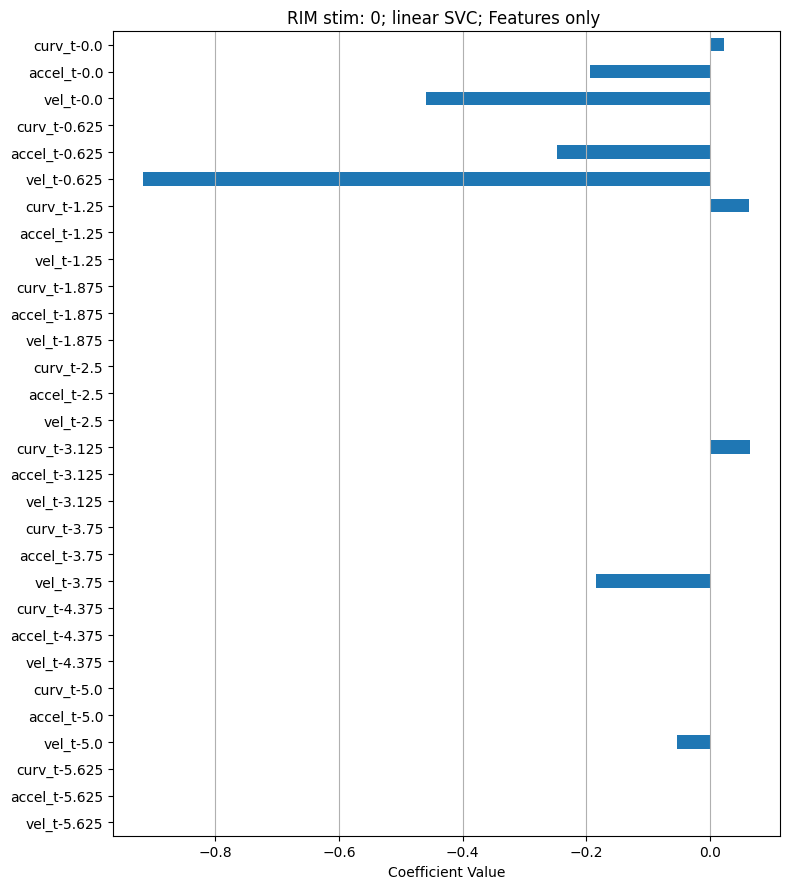

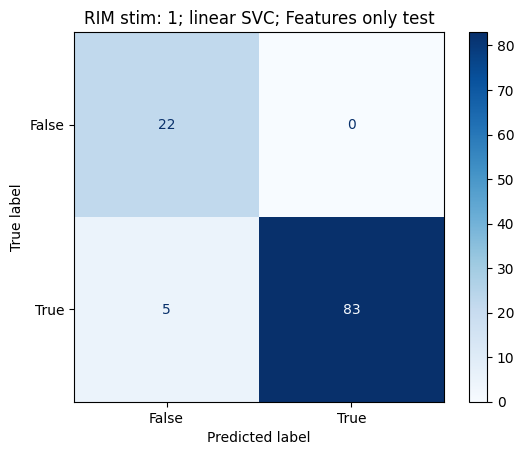

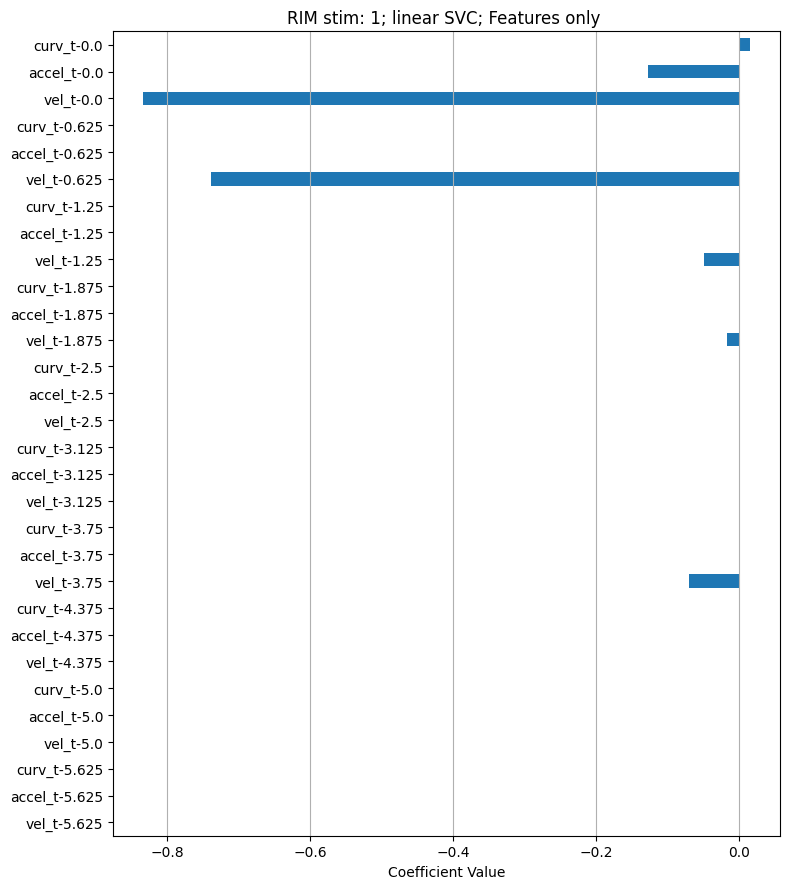

...

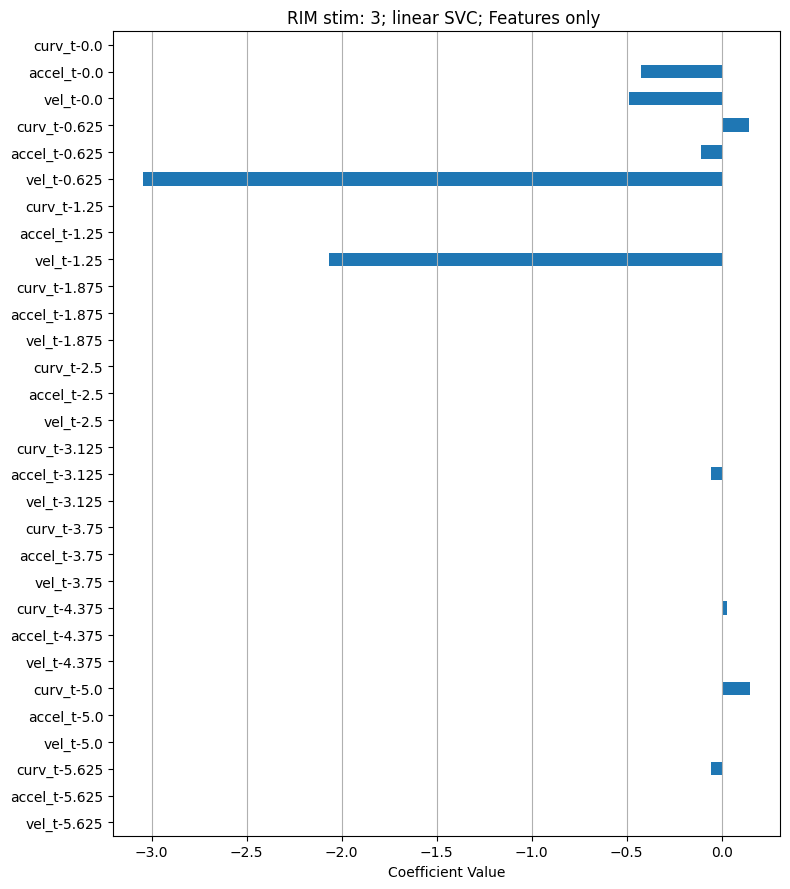

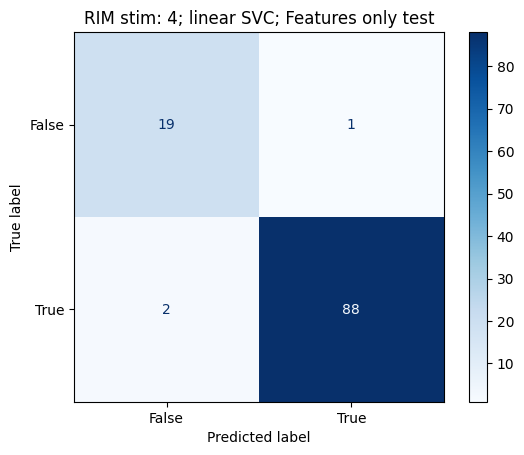

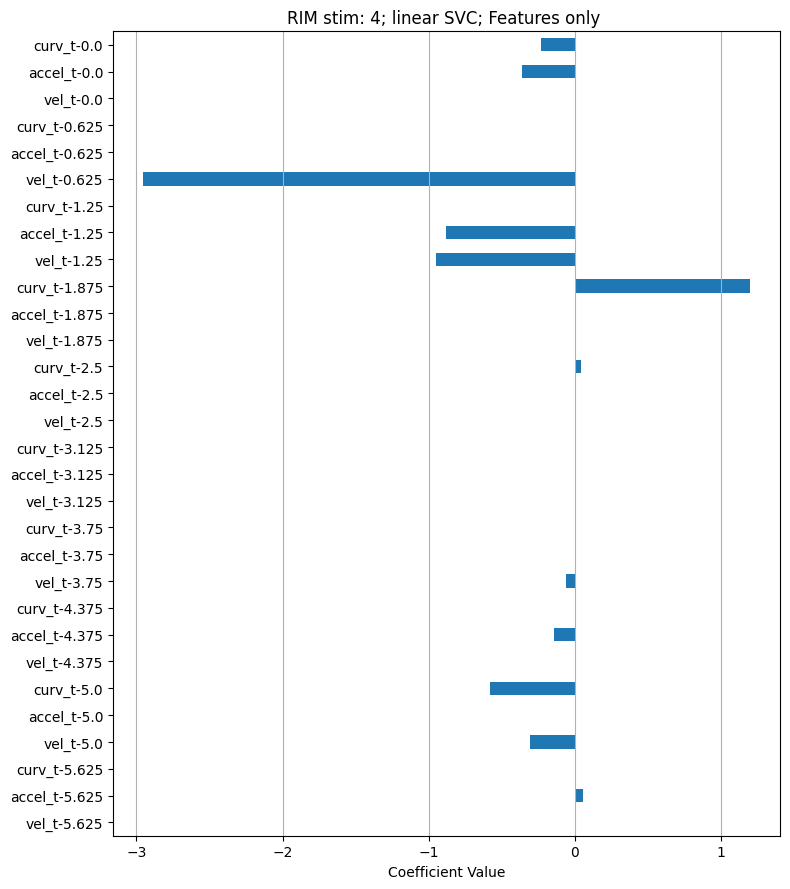

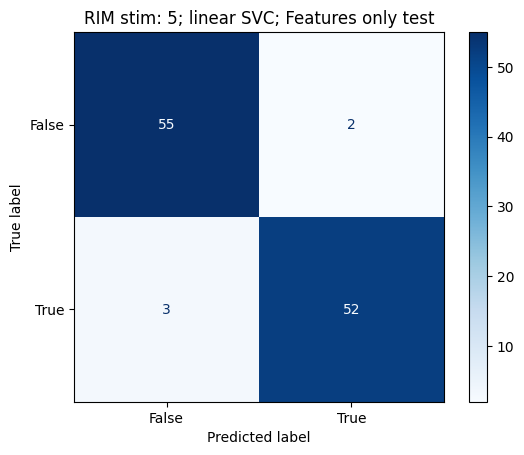

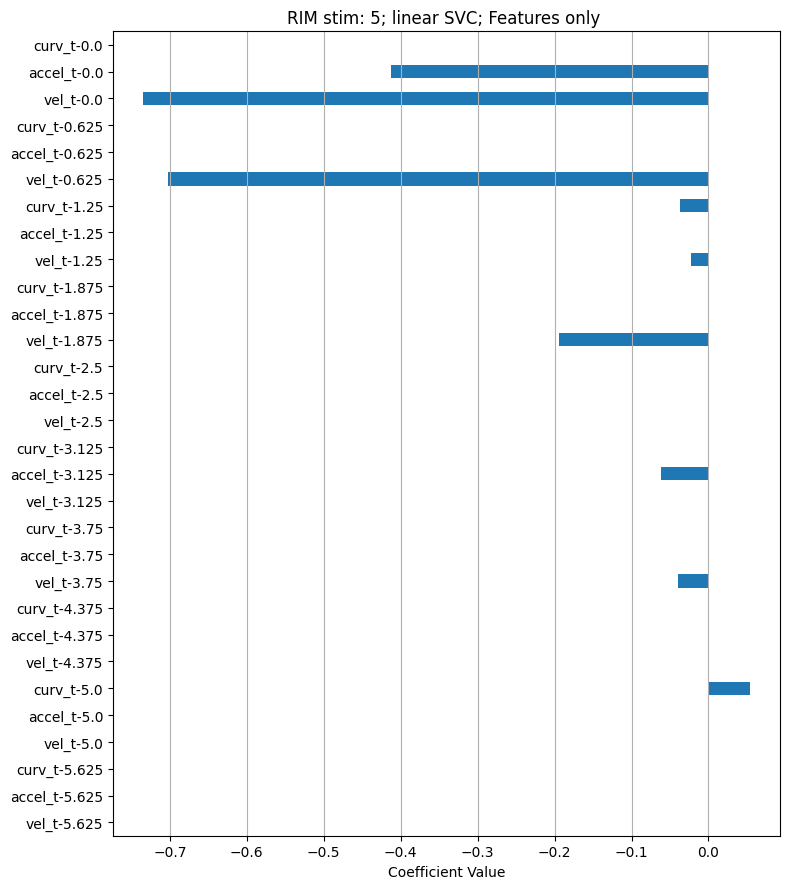

In [ ]:


with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    fps = 1.6
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; features only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (sec)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

n_timesteps = 10


feature_names = np.array([[f"vel_t-{(n_timesteps - t - 1)/fps}", f"accel_t-{(n_timesteps - t - 1)/fps}",
                        f"curv_t-{(n_timesteps - t - 1)/fps}"]
                        for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

    model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()

    




Processing i=0, n_timesteps=1

Processing i=0, n_timesteps=4

Processing i=0, n_timesteps=7

Processing i=0, n_timesteps=10

Processing i=0, n_timesteps=13

Processing i=1, n_timesteps=1

Processing i=1, n_timesteps=4

Processing i=1, n_timesteps=7

Processing i=1, n_timesteps=10

Processing i=1, n_timesteps=13

Processing i=2, n_timesteps=1

Processing i=2, n_timesteps=4

Processing i=2, n_timesteps=7

Processing i=2, n_timesteps=10

Processing i=2, n_timesteps=13

Processing i=3, n_timesteps=1

Processing i=3, n_timesteps=4

Processing i=3, n_timesteps=7

Processing i=3, n_timesteps=10

Processing i=3, n_timesteps=13

Processing i=4, n_timesteps=1

Processing i=4, n_timesteps=4

Processing i=4, n_timesteps=7

Processing i=4, n_timesteps=10

Processing i=4, n_timesteps=13

Processing i=5, n_timesteps=1

Processing i=5, n_timesteps=4

Processing i=5, n_timesteps=7

Processing i=5, n_timesteps=10

Processing i=5, n_timesteps=13
RIM stim: 0; linear SVC; Features only Accuracy: 0.9561403

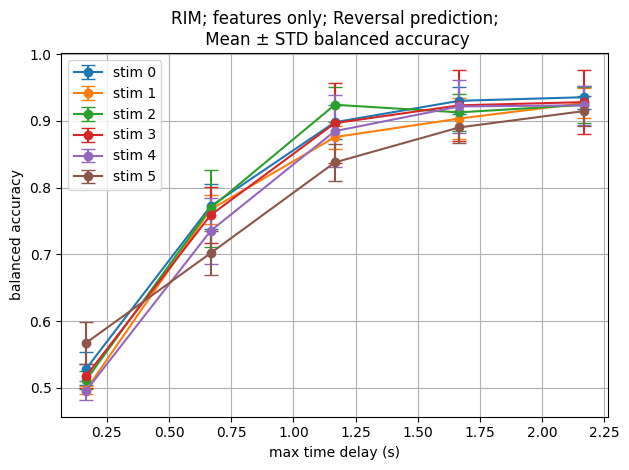

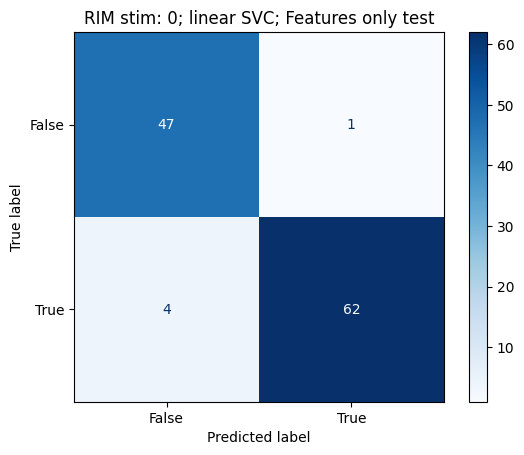

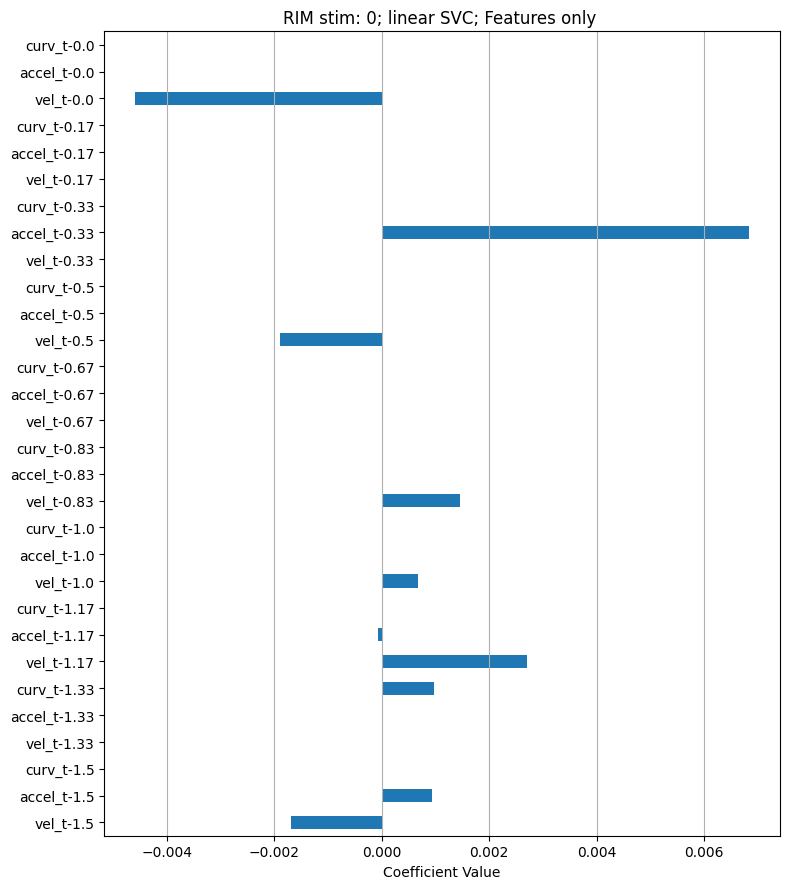

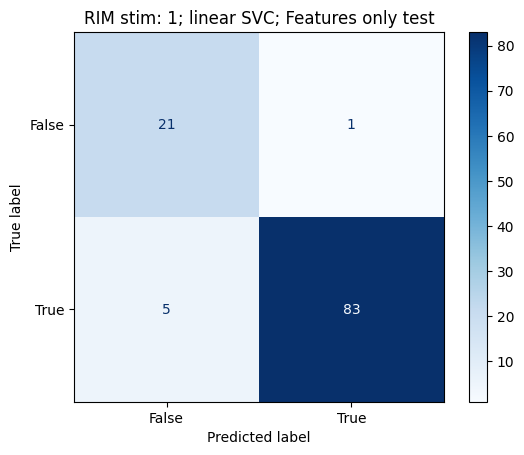

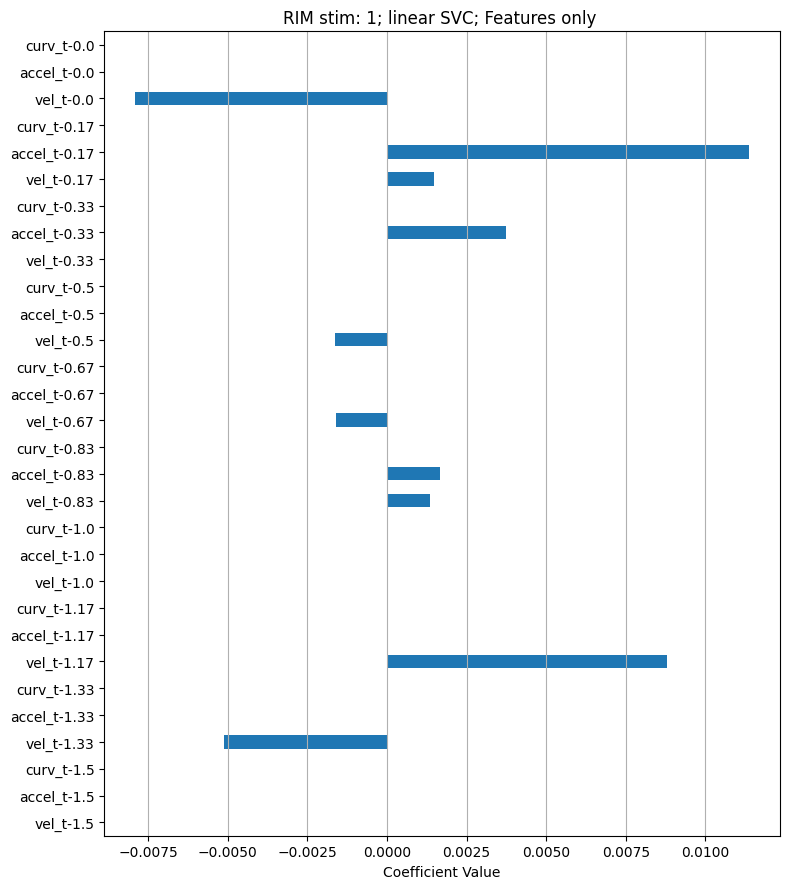

...

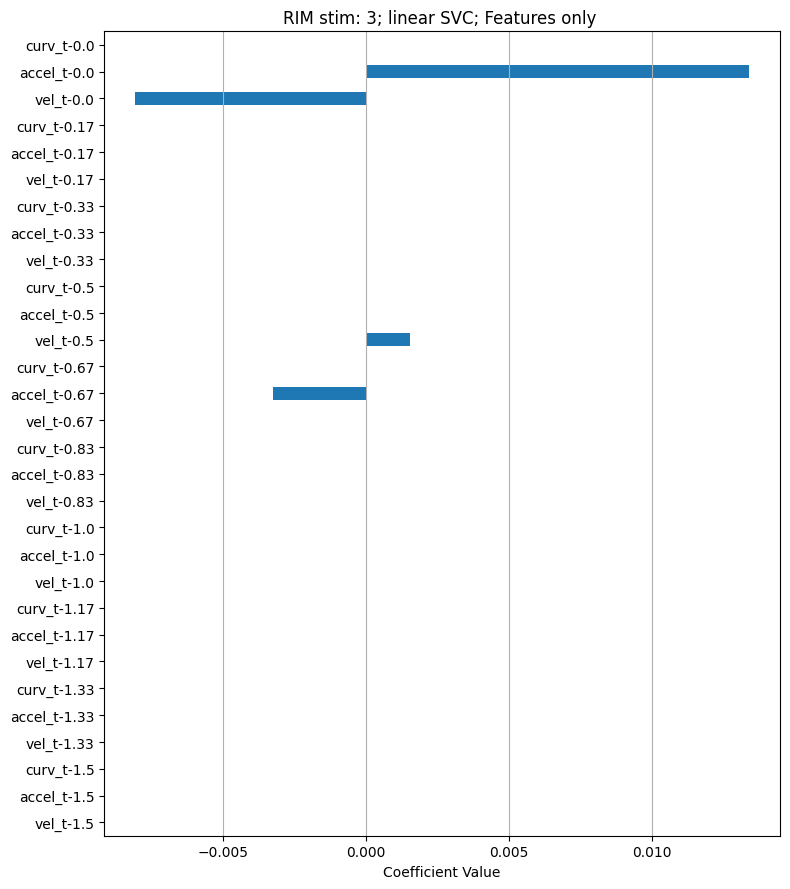

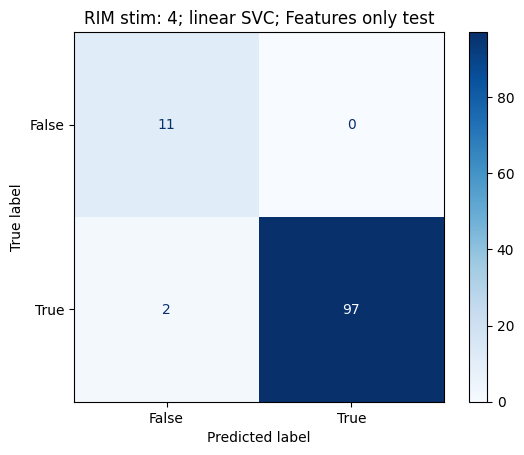

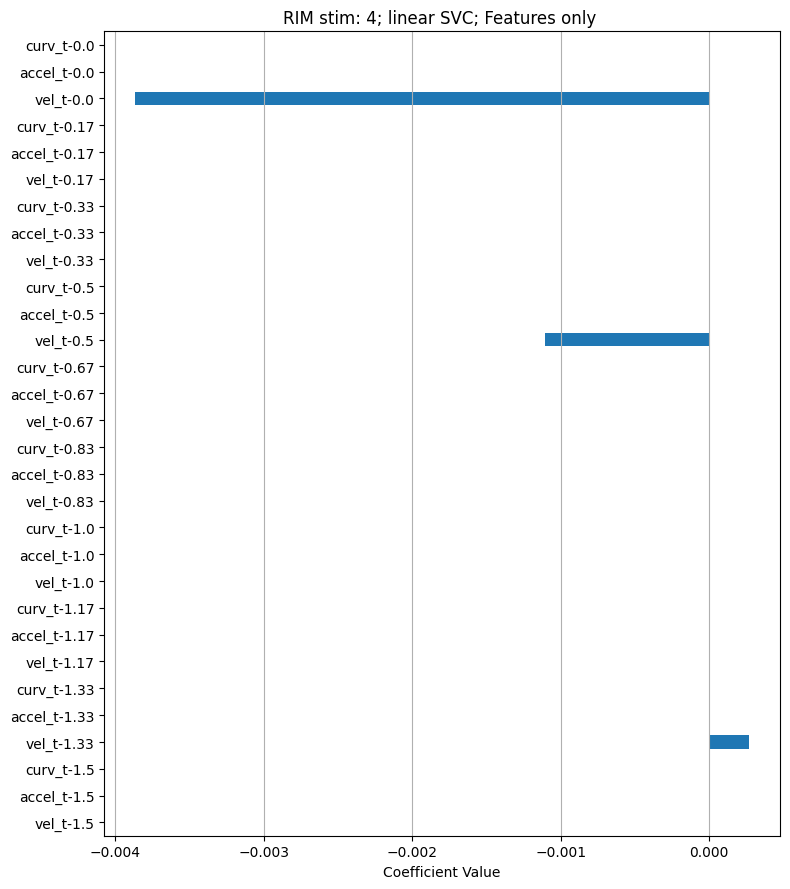

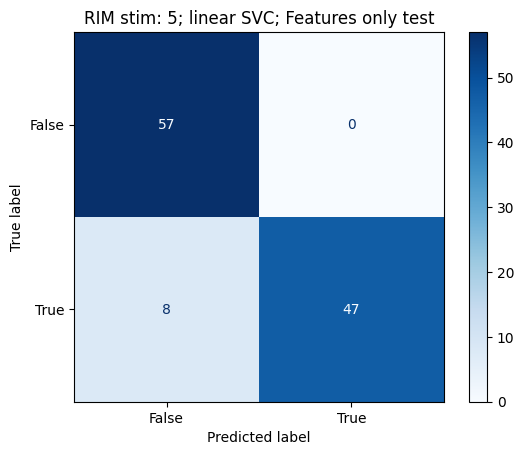

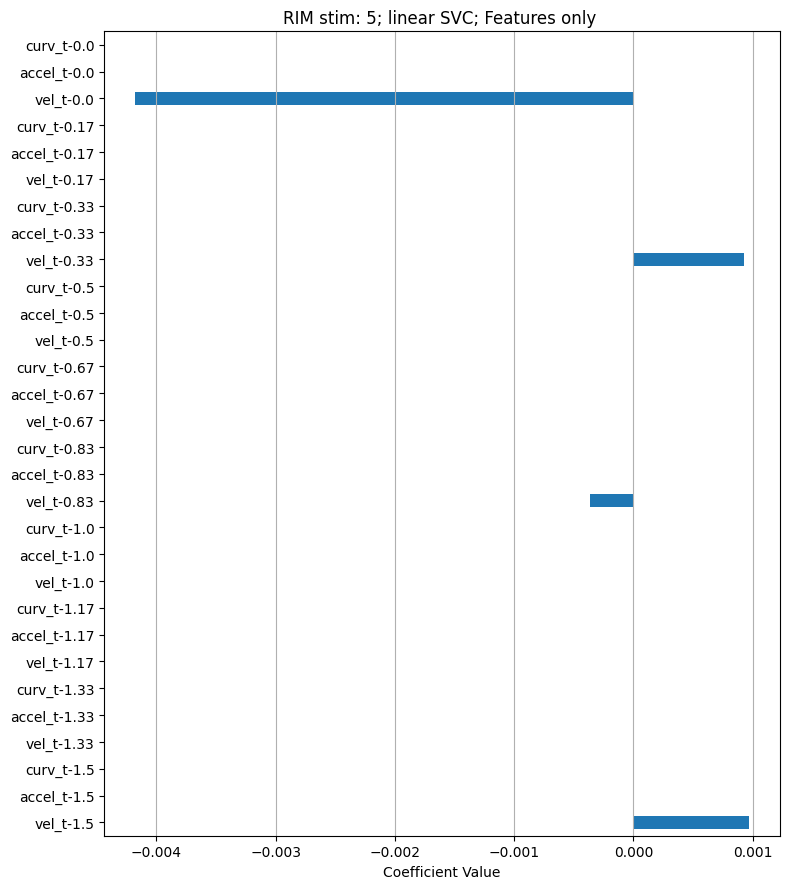

In [ ]:
##############
#######test prediction from features - exp fps 
################


with warnings.catch_warnings():

    fps = 6
    warnings.simplefilter("ignore")
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    # exp_lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all = prep_FB_inputs_features_only(exp_vel, exp_acc, exp_curve, exp_rev, exp_turn, exp_onset, n_timesteps, z, 
                                                                         lstm_lag = 0, include_beh = include_beh)#shape (n_tracks, n_frames, n_features)

            
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; features only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (s)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()

# plt.show()
n_timesteps = 10
include_beh = False

feature_names = np.array([[f"vel_t-{np.round((n_timesteps - t - 1)/fps, 2)}", f"accel_t-{np.round((n_timesteps - t - 1)/fps, 2)}",
                        f"curv_t-{np.round((n_timesteps - t - 1)/fps, 2)}"]
                        for t in range(n_timesteps)]).flatten()
for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

    model_label= f"{neuron} stim: {i}; linear SVC; Features only "#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()

    


Processing i=5, n_timesteps=2

Processing i=5, n_timesteps=6

Processing i=5, n_timesteps=10

Processing i=5, n_timesteps=14


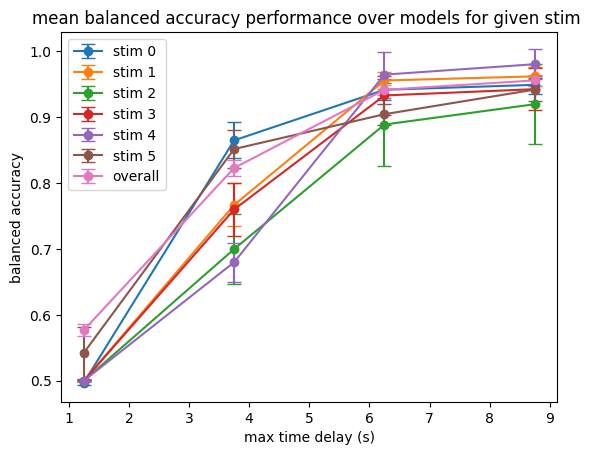

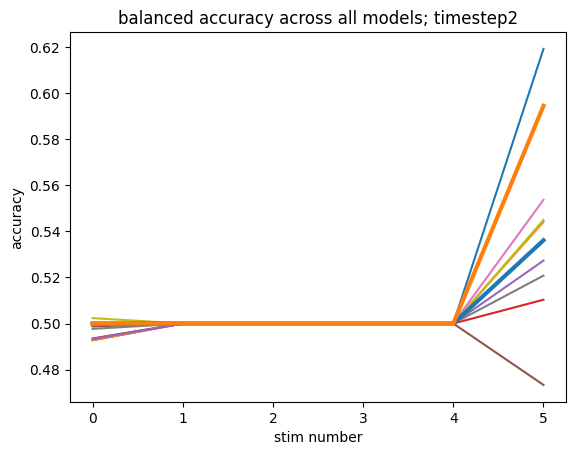

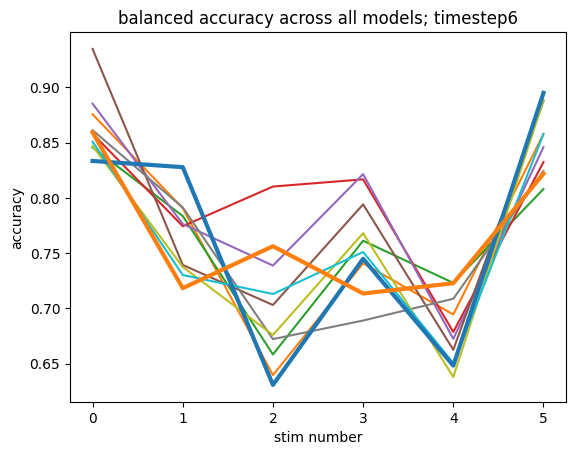

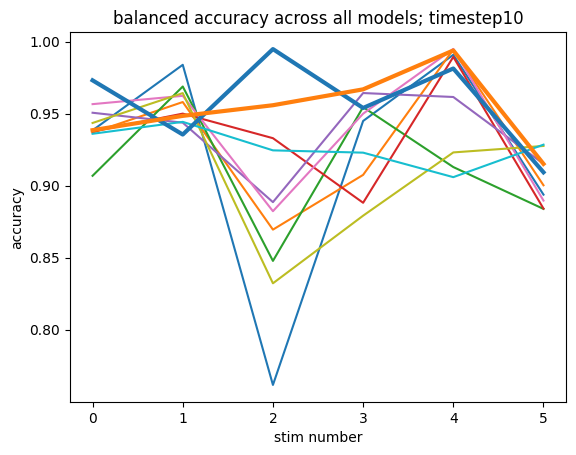

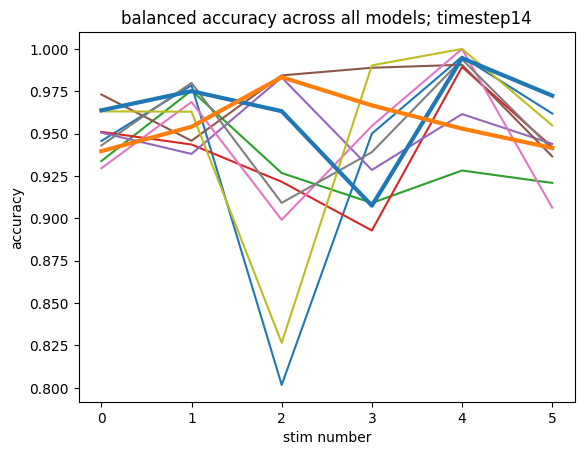

In [ ]:
import warnings
from sklearn import metrics


###########
###########test predicitons from features only compare models 
#############
with warnings.catch_warnings():
    fps = 1.6
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    test_size = 0.3
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]


    results_dict_score_overall = {}
    best_models_score_overall ={}
    results_dict_auc_overall ={}
    best_models_auc_overall = {}
    
    results_dict_score_stim ={}
    best_models_score_stim = {}
    best_models_auc_stim = {}
    
    results_dict_auc_stim={}
    
    t_to_all_data = {}
    t_to_all_models = {}
    t_to_all_stim_scores ={}
    t_to_overall_aucs = {}
    t_to_best_model_using_min_idx_score ={}
    
    n_timesteps_list = []
    t_to_best_model_idx_auc = {}
    t_to_best_model_idx_score = {}
    for n_timesteps in range(2, 15, 4):#range(1, 15, 4):
        print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

        all_data = []
        n_stim = len(resampled_onsets)
        stim_i_to_score_means = {i:[] for i in range(n_stim)}
        stim_i_to_score_stds = {i:[] for i in range(n_stim)}
        
        stim_i_to_Xs = {}
        stim_i_to_Ys = {}
        
        ##########prep data 
        for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
            onset = resampled_onset-1
            X_stim_all, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps, z,  lstm_lag = lstm_lag, include_beh = False)#shape (n_tracks, n_frames, n_features)
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            stim_i_to_Xs[i] = X_prob
            stim_i_to_Ys[i] = Y_prob
       
        all_stim_X_stim_features, all_stim_Y, feature_names_all = combine_FB_features_across_stim(stim_i_to_Xs, stim_i_to_Ys,  feature_names)
            
            
        ###    
        # X_train, X_test, y_train, y_test = train_test_split(all_stim_X_stim_features, all_stim_Y,  test_size=test_size, random_state=random_state)
        overall_scores = []
        overall_aucs = []
        all_stim_aucs = []
        all_stim_scores =[]# np.zeros((n_splits,n_stim))
        
        best_model_idx = []
        models = [] # n_splits
        ######split data and fit model on split 
        for split_idx in range(n_splits):
            X_train, X_test, y_train, y_test = train_test_split(all_stim_X_stim_features, all_stim_Y,  test_size=test_size, random_state=split_idx)
            all_data.append((X_train, X_test, y_train, y_test))
            
            param_grid = {
                'C': [0.001, 0.01, 0.1, 1, 10, 100]
            }

            model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
            # Grid search
            grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
            grid.fit(X_train, y_train)
            c = grid.best_params_['C']
            best_model = grid.best_estimator_

            #get stim_i for each row in test data
            stim_bin_test = X_test[:, -1*n_stim:]
            stim_i_test = np.argmax(stim_bin_test, axis = 1)
            # print(np.all(np.sum(stim_bin_test, axis = 1)==1))
            stim_scores = [] #model specfic for each stim 
            stim_aucs = []
            for j in range(n_stim):
                
                X_test_stim = X_test[stim_i_test == j, :]
                y_test_stim = y_test[stim_i_test == j]
                
                y_pred = best_model.predict(X_test_stim)
                
                
                fpr, tpr, thresholds = metrics.roc_curve(y_test_stim, y_pred, pos_label=2)
                stim_auc = metrics.auc(fpr, tpr)
                stim_score = balanced_accuracy_score(y_test_stim, y_pred)  
                stim_scores.append(stim_score)
                stim_aucs.append(stim_auc)
            all_stim_scores.append(stim_scores)
            all_stim_aucs.append(stim_aucs)
            
            y_pred = best_model.predict(X_test)
             
            
            fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred, pos_label=2)
            overall_auc = metrics.auc(fpr, tpr)
            overall_score = balanced_accuracy_score(y_test, y_pred) 
            
            overall_scores.append(overall_score)
            overall_aucs.append(overall_auc)
            models.append((best_model, c))
            
            
            # overall_balanced_accuracy_scores.append(tuple(all_scores))
            # overall_aucs.append(tuple(all_aucs))
            # balanced_accuracy_scores.append(all_scores)
            # aucs.append(all_aucs)
            
                
        all_stim_scores = np.array(all_stim_scores)#n_splits,n_stim
        all_stim_aucs = np.array(all_stim_aucs)
        
        
        ###overall scores
        accuracy_mean_overall = np.mean(overall_scores)
        accuracy_std_overall= np.std(overall_scores)
        
        best_model_idx_score_overall = np.argmax(overall_scores)
        # np.argmin(overall_scores)
        best_model_score_overall, _ = models[best_model_idx_score_overall]
        t_to_best_model_idx_score[n_timesteps] = best_model_idx_score_overall
        
        results_dict_score_overall[n_timesteps] = (accuracy_mean_overall, accuracy_std_overall)
        best_models_score_overall[ n_timesteps] = best_model_score_overall

        
        ###overall aucs 
        auc_mean_overall = np.mean(overall_aucs)
        auc_std_overall = np.std(overall_aucs)
        
        best_model_idx_auc_overall = np.argmax(overall_aucs)
        best_model_auc_overall, _ = models[best_model_idx_auc_overall]
        t_to_best_model_idx_auc[n_timesteps] = best_model_idx_auc_overall
        
        results_dict_auc_overall[n_timesteps] = (accuracy_mean_overall, accuracy_std_overall)
        best_models_auc_overall[ n_timesteps] = best_model_score_overall
        t_to_all_models[ n_timesteps] = models

        #####stim scores
        accuracy_mean_stim_specific = np.mean(all_stim_scores, axis =0)
        accuracy_std_stim_specific = np.std(all_stim_scores, axis =0)

        
        best_model_idx_score_stim_min = np.argmax(np.min(all_stim_scores, axis = 1)) # has lowest min on all stim 
        best_model_score_stim_min, _ = models[best_model_idx_score_stim_min]
        t_to_best_model_using_min_idx_score[n_timesteps] = best_model_idx_score_stim_min
        

        results_dict_score_stim[n_timesteps] = (accuracy_mean_stim_specific, accuracy_std_stim_specific)
        best_models_score_stim[ n_timesteps] = best_model_score_stim_min
        
        #####stim aucs
        auc_mean_stim_specific = np.mean(all_stim_aucs, axis = 0)
        auc_std_stim_specific = np.std(all_stim_aucs, axis = 0)
        
        
        best_model_idx_auc_stim_min = np.argmax(np.min(all_stim_aucs, axis = 1)) # has lowest min on all stim 
        best_model_auc_stim_min, _ = models[best_model_idx_auc_stim_min]
        
        
        t_to_all_stim_scores[n_timesteps] = all_stim_scores
        t_to_overall_aucs[n_timesteps] = all_stim_aucs
        
        results_dict_auc_stim[n_timesteps] = (auc_mean_stim_specific, auc_std_stim_specific)
        best_models_auc_stim[ n_timesteps] = best_model_auc_stim_min
        t_to_all_data[n_timesteps] = all_data
        

        n_timesteps_list.append(n_timesteps)

    ####plot overall mean and std overall and for each stim  
    fig, ax = plt.subplots()
    accuracy_mean_overall_over_t =[]
    accuracy_std_overall_over_t = []
    stim_acc_mean_over_t = []
    stim_acc_std_over_t = []
    for n_timesteps in n_timesteps_list:

        accuracy_mean_overall, accuracy_std_overall = results_dict_score_overall[n_timesteps]
        accuracy_mean_overall_over_t.append(accuracy_mean_overall)
        accuracy_std_overall_over_t.append(accuracy_std_overall)
        accuracy_mean_stim_specific, accuracy_std_stim_specific = results_dict_score_stim[n_timesteps]
        stim_acc_mean_over_t.append(accuracy_mean_stim_specific)
        stim_acc_std_over_t.append(accuracy_std_stim_specific)
    stim_acc_mean_over_t = np.array(stim_acc_mean_over_t)
    stim_acc_std_over_t = np.array(stim_acc_std_over_t)
    for j in range(n_stim):
        ax.errorbar(np.array(n_timesteps_list)/fps, stim_acc_mean_over_t[:,j], yerr=stim_acc_std_over_t[:,j], fmt='-o', capsize=5, label = f"stim {j}")#color=cmap1(i),
        
    ax.errorbar(np.array(n_timesteps_list)/fps, accuracy_mean_overall_over_t, yerr=accuracy_std_overall_over_t, #color=cmap1(i),
                fmt='-o', capsize=5, label = f"overall")
    ax.set_title('mean balanced accuracy performance over models for given stim ')
    ax.set_ylabel("balanced accuracy")
    ax.set_xlabel("max time delay (s)")
    ax.legend()
        
    #  ####for best overall mdoel plto how it did overall and on each stim 
    # fig, ax = plt.subplots()
    
    # for j in range(n_stim):
    #     all_scores = []
    #     for n_timesteps in n_timesteps_list:
    #         all_data = t_to_all_data[n_timesteps]
            
    #         best_model_score_overall = best_models_score_overall[ n_timesteps]
       
    #         for X_train, X_test, y_train, y_test in all_data:
    #             stim_bin_test = X_test[:, -1*n_stim:]
    #             stim_i_test = np.argmax(stim_bin_test, axis = 1)
    #             X_test_stim = X_test[stim_i_test == j, :]
    #             y_test_stim = y_test[stim_i_test == j, :]

    #             y_pred = best_model_score_overall.predict(X_test)
    #             score = balanced_accuracy_score(y_test, y_pred) 
    #             all_scores.append(score)
    #     ax.plot(n_timesteps_list, all_scores, label = f"stim {j}")
    # ax.set_xlabel("timestep")
    # ax.set_ylabel("acc")

    # # all_scores = []
    # # for n_timesteps in n_timesteps_list:
    # #     X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps]
            

    # #     best_model_score_overall = best_models_score_overall[ n_timesteps]
    # #     y_pred = best_model_score_overall.predict(X_test)
    # #     score = balanced_accuracy_score(y_test, y_pred) 
    # #     all_scores.append(score)
    # #     ax.plot(n_timesteps_list, all_scores, label = "overall")
    # ax.legend()
    
    ####plot best over stim how it does overall - score for each T overall 
    # fig, ax = plt.subplots()
    
    # for j in range(n_stim):
    #     all_scores = []
    #     for n_timesteps in n_timesteps_list:
    #         X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps]
    #         best_model_score_overall = best_model_score_stim_min[ n_timesteps]
       
        
    #         X_test_stim = X_test[stim_i_test == j, :]
    #         y_test_stim = y_test[stim_i_test == j, :]
            
    #         y_pred = best_model_score_overall.predict(X_test)
    #         score = balanced_accuracy_score(y_test, y_pred) 
    #         all_scores.append(score)
    #     ax.plot(n_timesteps_list, all_scores, label = f"stim {j}")
    # all_scores = []
    # for n_timesteps in n_timesteps_list:
    #     X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps]
            

    #     best_model_score_overall = best_model_score_stim_min[ n_timesteps]
    #     y_pred = best_model_score_overall.predict(X_test)
    #     score = balanced_accuracy_score(y_test, y_pred) 
    #     all_scores.append(score)
    #     ax.plot(n_timesteps_list, all_scores, label = "overall")
    # ax.legend()
    
    ####plot score overall score on each stim (each line a model)
    for n_timesteps in n_timesteps_list:
        all_stim_scores = t_to_all_stim_scores[n_timesteps]
        
        fig, ax = plt.subplots()
        for k in range(n_splits): 
            ax.plot(np.arange(n_stim), all_stim_scores[k])
        ax.set_title(f"balanced accuracy across all models; timestep{n_timesteps}")
        ax.set_xlabel("stim number")
        ax.set_ylabel("accuracy")
        idx = t_to_best_model_idx_score[n_timesteps]
        ax.plot(np.arange(n_stim), all_stim_scores[idx], linewidth = 3, label = "best")
        
        idx = t_to_best_model_using_min_idx_score[n_timesteps]
        ax.plot(np.arange(n_stim), all_stim_scores[idx], linewidth = 3, label = "best using min")

            
    

    



Processing i=0, n_timesteps=1
n_timesteps 1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=4
n_timesteps 4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4


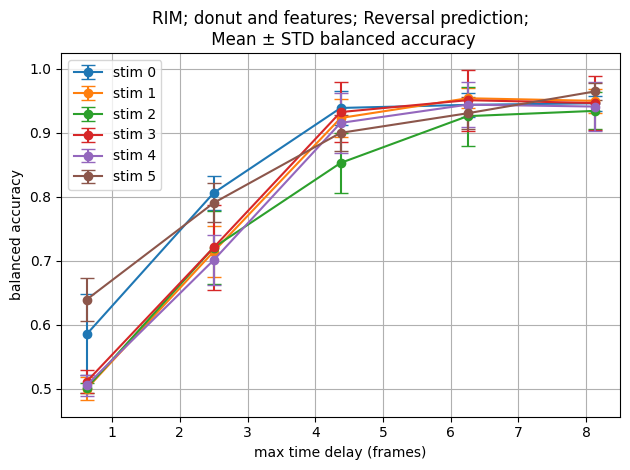

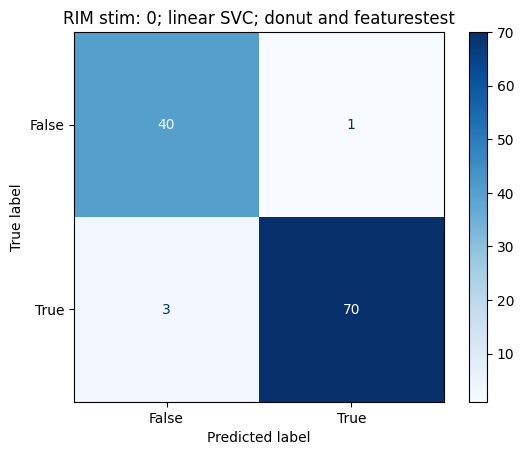

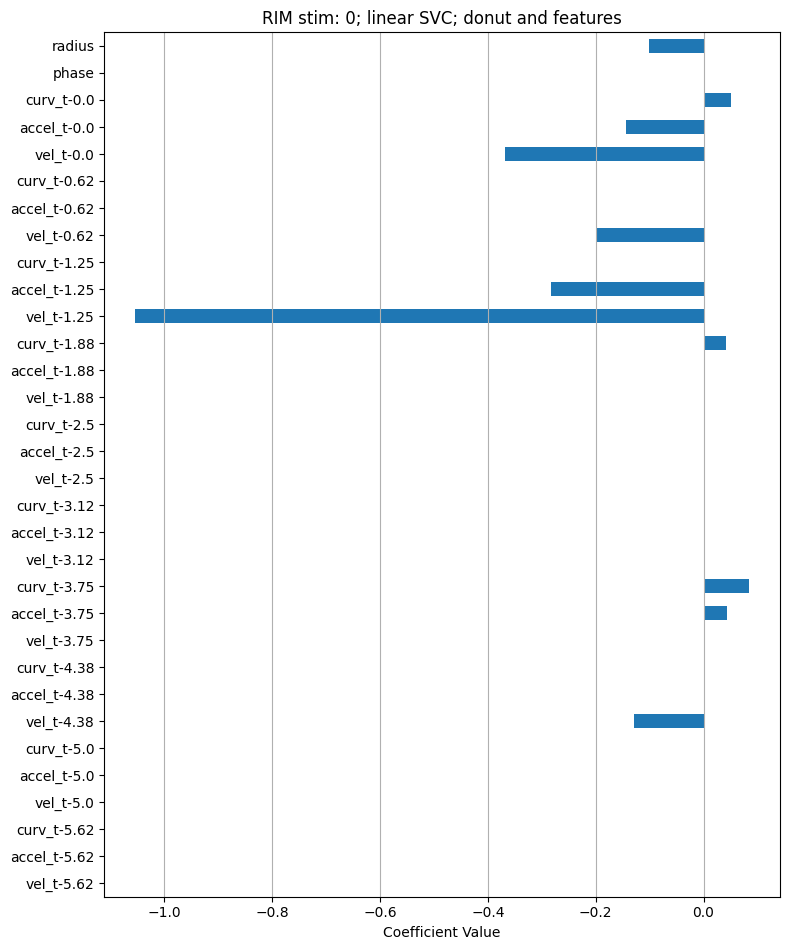

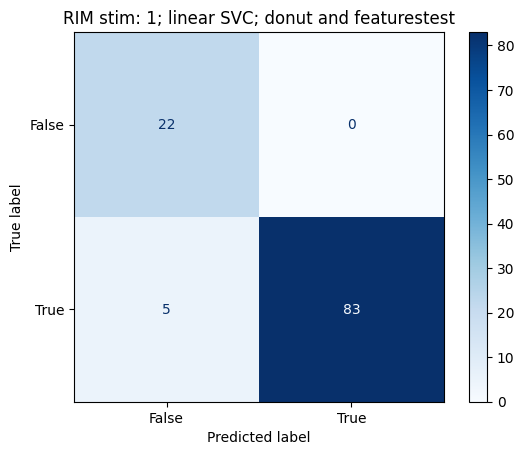

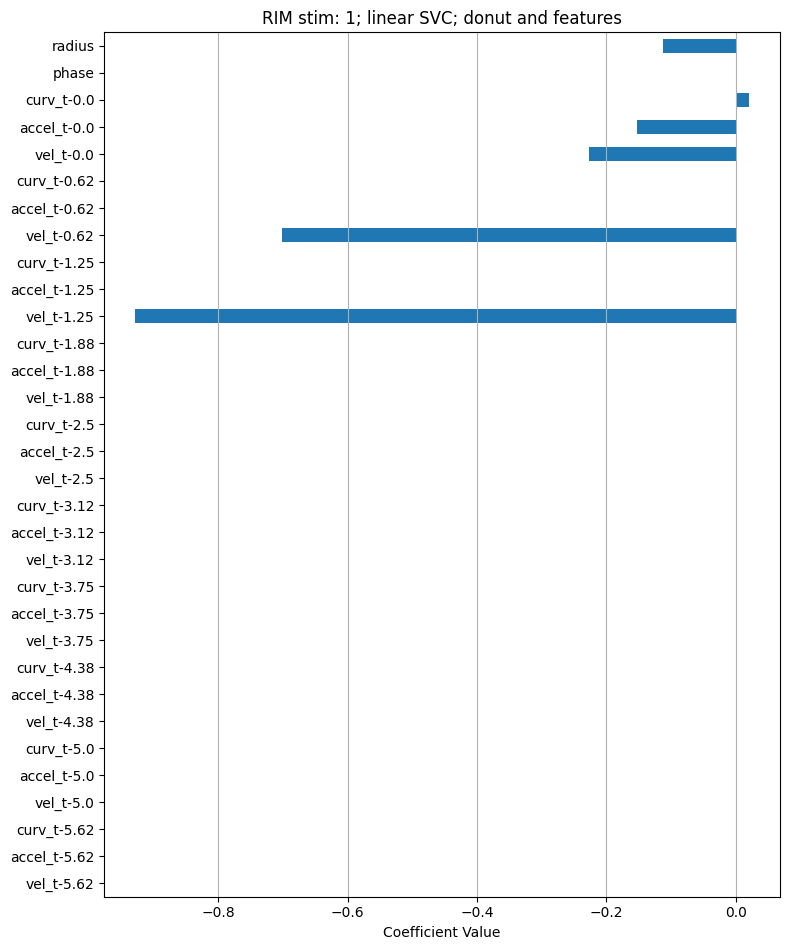

...

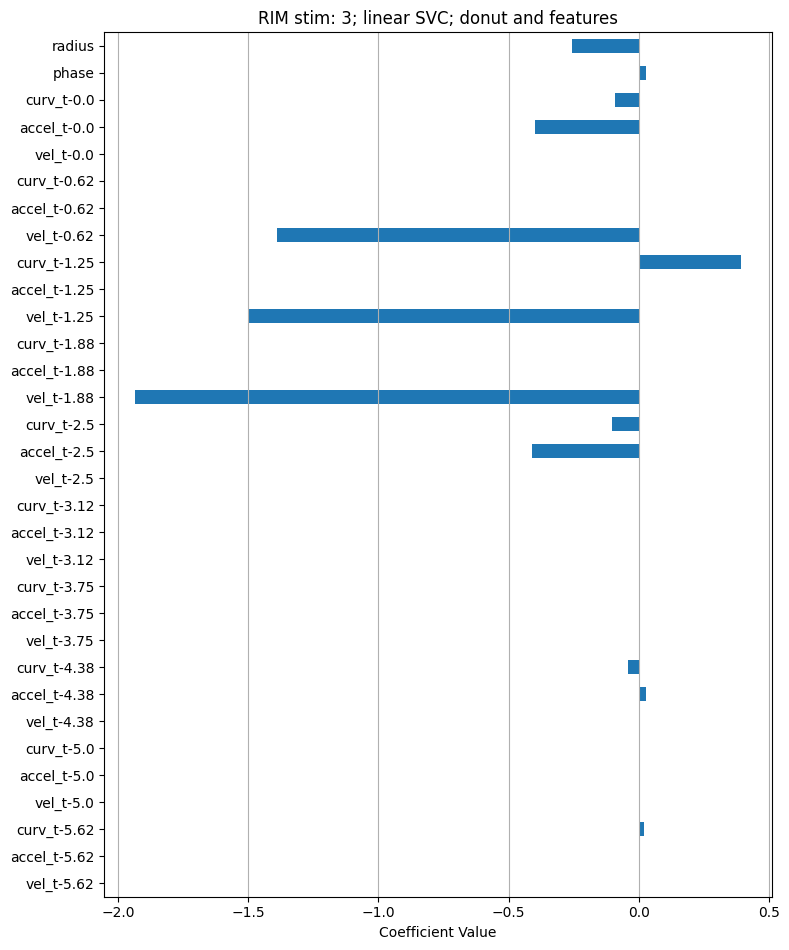

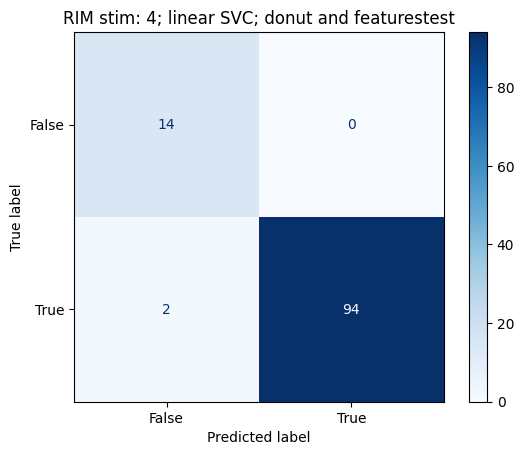

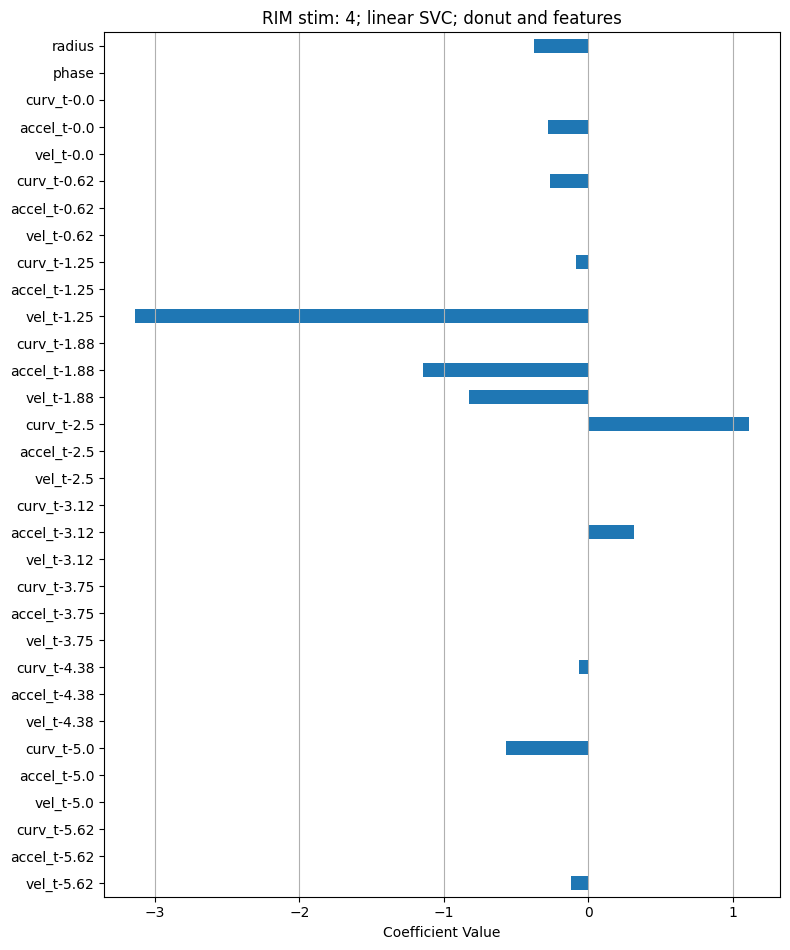

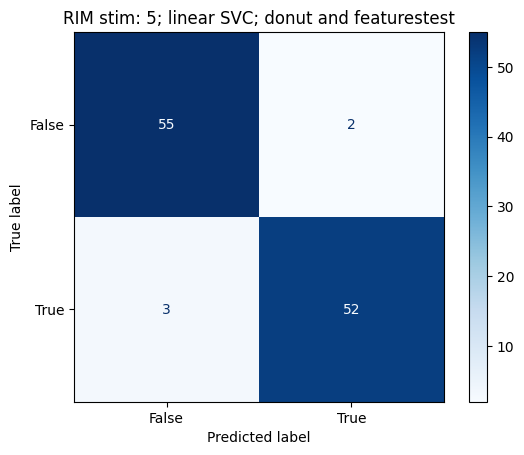

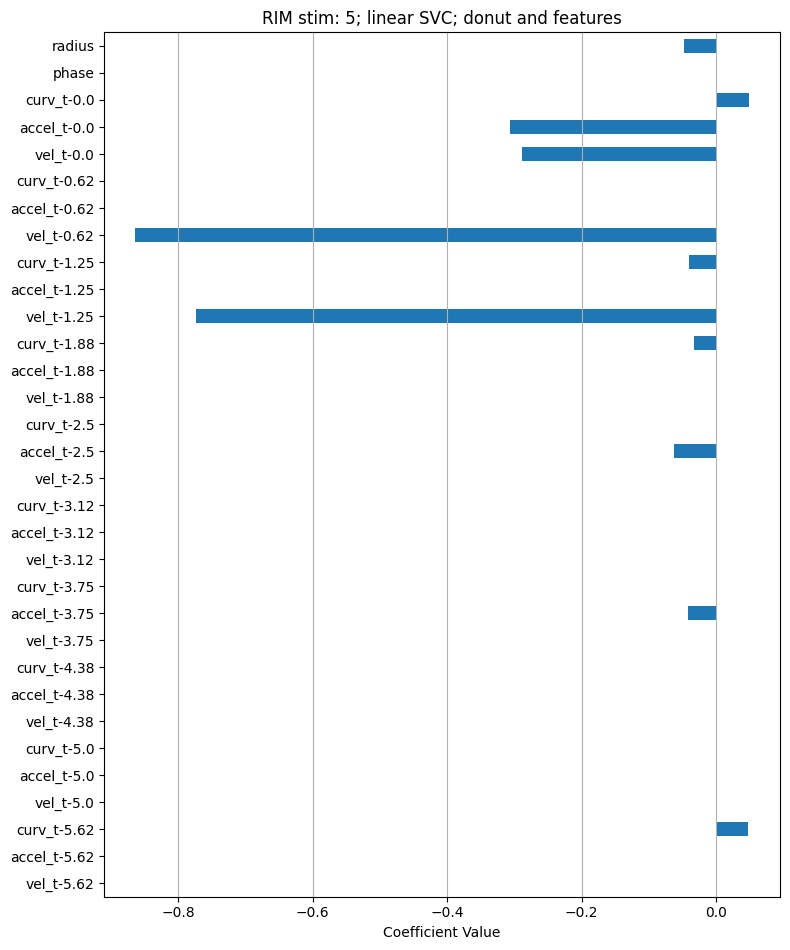

In [ ]:
###########predict prob from features and donut
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import balanced_accuracy_score
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy as np
import copy
import pickle
import matplotlib.cm as cm


import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            print("n_timesteps",n_timesteps)
            # t(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks, z,n_timestepslstm_lag = 0, include_beh = False)
            X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,n_timesteps, z,   lstm_lag = 0)
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; donut and features; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()#
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()
n_timesteps = 10


for i in range(len(resampled_onsets)):
    model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 
    
    
    X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, resampled_onset,   n_timesteps,z, lstm_lag = lstm_lag, include_beh = False, fps = fps)#shape (n_tracks, n_frames, n_features)
    X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks)
    X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
    feature_names_all = np.array(feature_names.tolist()+donut_names)

    model_label= f"{neuron} stim: {i}; linear SVC; donut and features"#; lasso_a{np.round(alpha,2)}"
    visualize_model_classification(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
plt.show()
    


Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=3, n_timesteps=1
n_timesteps 459
n_

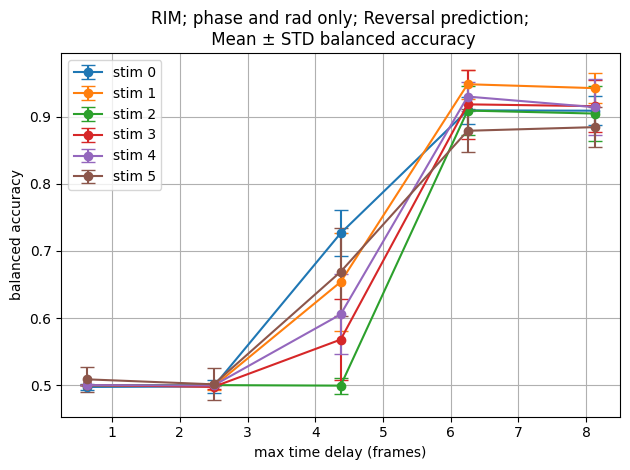

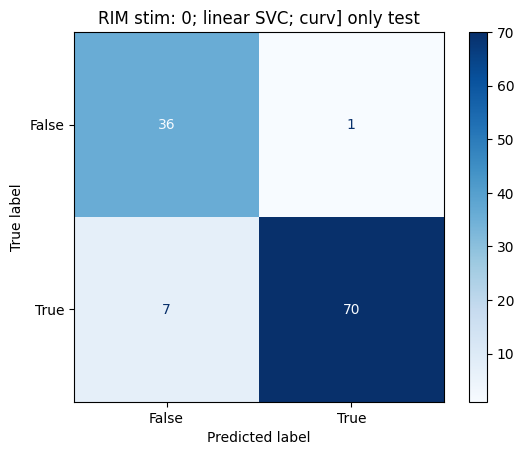

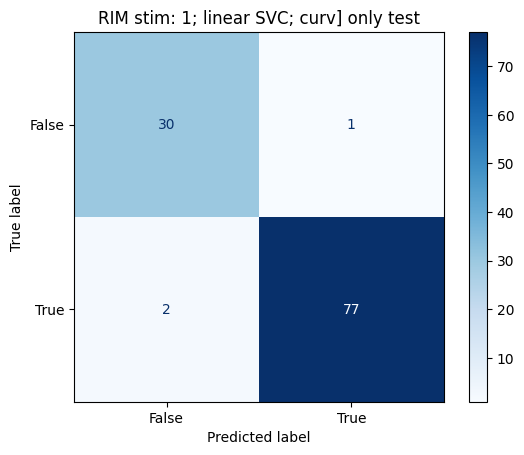

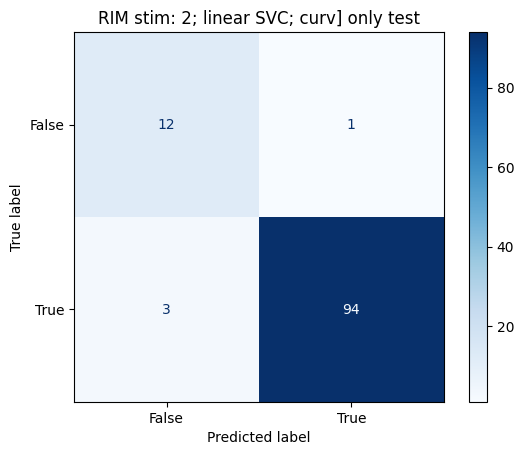

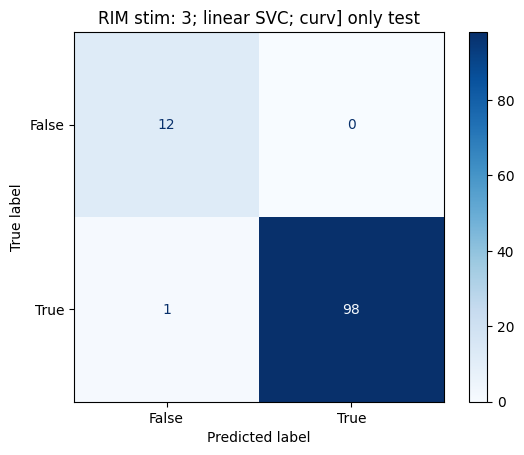

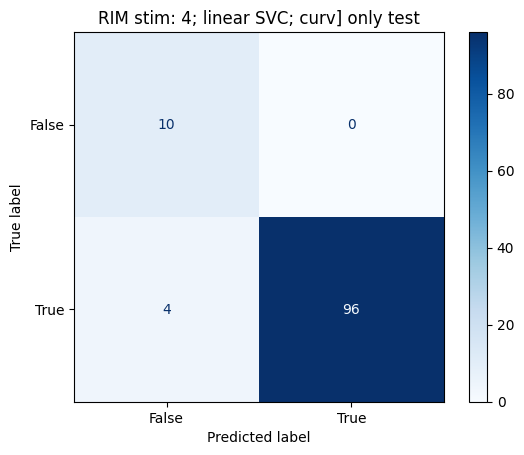

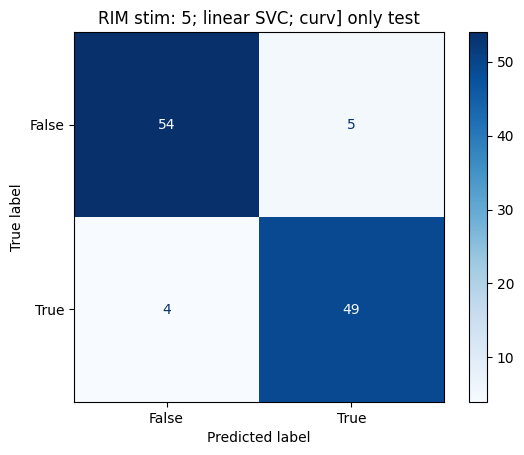

In [ ]:
###############
###############
###predict from time delayed phase resampeld frame rate
################


with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    fps = 1.6

    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
            radii_resampled =  feature_all_to_resampled(inferred_rad_all, n_tracks)
            features_list = [phase_resampled, radii_resampled]
            feature_labels = ["phase", "radii"]
            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
            
                            )
            # print(np.all(X_stim_all1==X_stim_all))
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; phase and rad only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

    n_timesteps = 10
    include_beh = False

    feature_names = np.array([[f"phase_t-{np.round((n_timesteps - t - 1)/fps, 2) }", f"rad_t-{np.round((n_timesteps - t - 1)/fps, 2) }"
                       ]
                            for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

        model_label= f"{neuron} stim: {i}; linear SVC; {feature_lbl}] only "#; lasso_a{np.round(alpha,2)}"
        visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, get_coeff = False, coeffs = model.coef_[0])#, xlim = [-1,1])
        
plt.show()


Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=1, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=2, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=3, n_timesteps=1
n_timesteps 459
n_

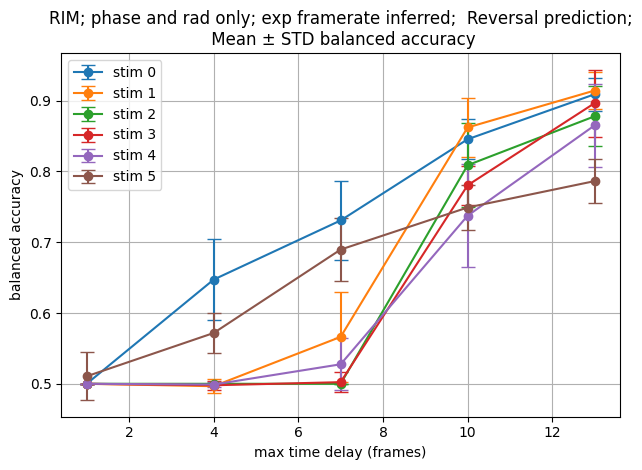

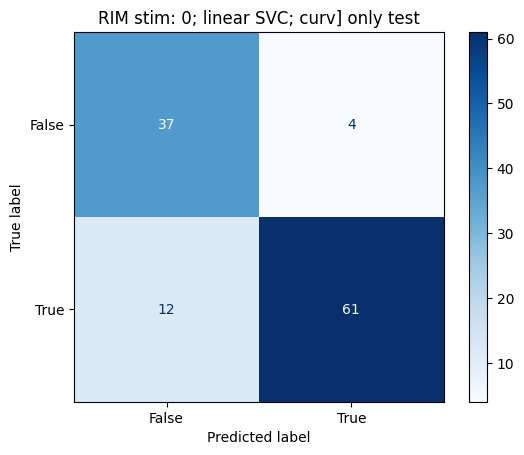

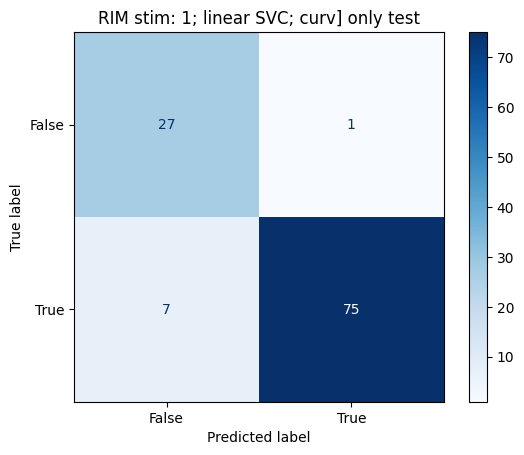

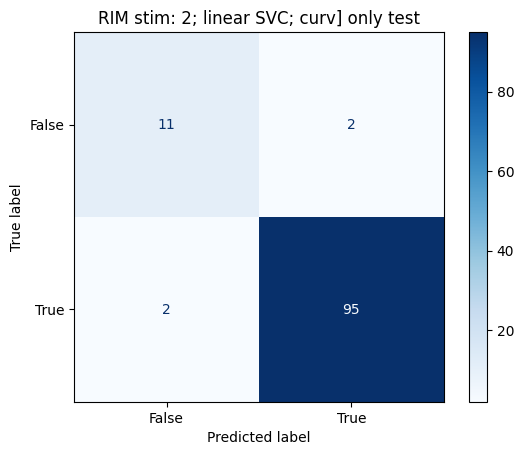

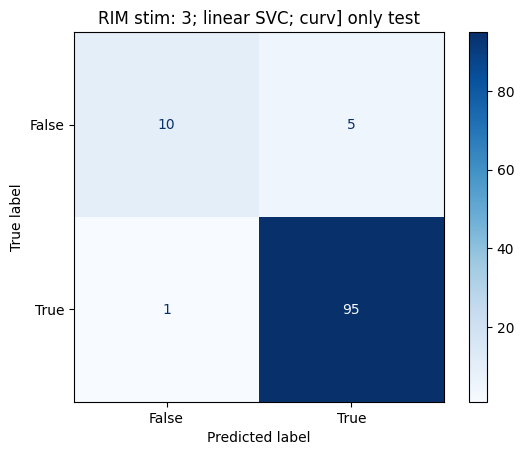

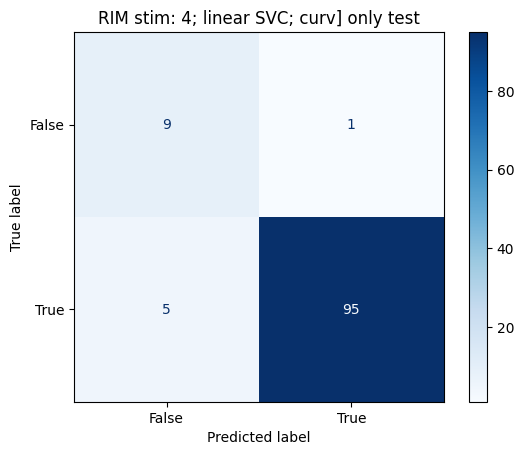

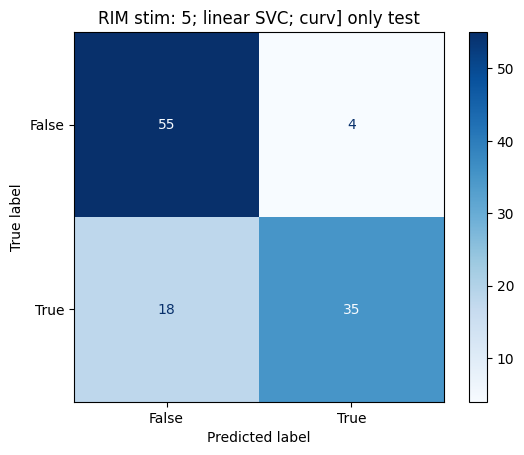

In [ ]:


with warnings.catch_warnings():
    ###############
    ###############
    ###predict from time delayed phase high frame rate
    ################
    fps = 6
    warnings.simplefilter("ignore")
    # print("feature_lbl", feature_lbl)
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = exp_onset-1

        for n_timesteps in range(1, 15, 3):
        # for n_timesteps in range(1, 15, 1):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
            radii_resampled =  feature_all_to_resampled(inferred_rad_all, n_tracks)
            exp_phase_high_fps = resample_2d(phase_resampled, target_fps=6, original_fps=1.6)
            exp_rad_high_fps = resample_2d(radii_resampled, target_fps=6, original_fps=1.6)
            features_list = [exp_phase_high_fps, exp_rad_high_fps]
            feature_labels = ["phase", "radii"]
            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
            
                            )
            # print(np.all(X_stim_all1==X_stim_all))
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                
                param_grid = {
                    'C': [0.001, 0.01, 0.1, 1, 10, 100]
                }

                model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
                # Grid search
                grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
                grid.fit(X_train, y_train)
                c = grid.best_params_['C']
                best_model = grid.best_estimator_
                
                y_pred = best_model.predict(X_test)
                score =balanced_accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; phase and rad only; exp framerate inferred;  Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (sec)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

    n_timesteps = 10
    include_beh = False

    feature_names = np.array([[f"phase_t-{np.round((n_timesteps - t - 1)/fps,2)}", f"rad_t-{np.round((n_timesteps - t - 1)/fps,2)}"
                       ]
                            for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

        model_label= f"{neuron} stim: {i}; linear SVC; {feature_lbl}] only "#; lasso_a{np.round(alpha,2)}"
        visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, get_coeff = False, coeffs = model.coef_[0])#, xlim = [-1,1])
        
plt.show()

In [ ]:
#############
#####check if can infer phase from interpatlated tim ebetwen revs 
##########

import numpy as np
def event_interpolation_fraction(events):
    """
    Input: 1D np.array with 1 where event occurs, 0 elsewhere.
    Output: 
      - -1 at event indices
      - linearly interpolated fraction of time to next event for other positions
    """
    events = np.asarray(events)
    result = np.full_like(events, np.nan, dtype=float)
    event_idxs = np.where(events == 1)[0]

    if len(event_idxs) == 0:
        return result  # no events, return NaNs

    # # Set -1 where events occur
    # result[event_idxs] = -1.0

    # Loop over event pairs to fill in between
    for i in range(len(event_idxs) - 1):
        start = event_idxs[i]
        end = event_idxs[i + 1]
        gap = end - start
        for j in range(1, gap):
            frac = j / gap  # fraction toward the next event
            result[start + j] = frac

    return result

def get_interpolated_time_since_last_reversal(rev_bin):
    n_frames, n_tracks = rev_bin.shape
    interpolated_fwd_time = np.zeros_like(rev_bin)
    for track in range(n_tracks):
        interpolated_fwd_time[:,track] = event_interpolation_fraction(rev_bin[:,track])
        
    return interpolated_fwd_time

# from 
from sklearn.linear_model import LogisticRegression, Lasso, LinearRegression
from sklearn.model_selection import GridSearchCV, train_test_split
######see if can predict phase from time_since_last_rev 
###need to get phase interpolated or somte 
random_state = 30
test_size = 0.3
interpolated_fwds = get_interpolated_time_since_last_reversal(exp_rev)
n_tracks, n_frames_exp = exp_rev.shape


phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
exp_phase_high_fps = resample_2d(phase_resampled, target_fps=6, original_fps=1.6)
Y = exp_phase_high_fps.flatten()
X = interpolated_fwds.flatten()

non_nan_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(X)), np.logical_not(np.isnan(Y)))).flatten()
X = X[non_nan_is]
X = X.reshape(-1, 1)
Y = Y[non_nan_is]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=random_state)


alphas = np.logspace(-4, 2, 20)
model_label= f"lasso"
# lasso = Lasso(max_iter=10000)
model = LinearRegression()
model.fit(X_train, y_train)
# grid_search = GridSearchCV(model, {'alpha': alphas}, cv=5, scoring='r2')
# grid_search.fit(X_train, y_train)

# best_model = grid_search.best_estimator_
# y_pred = best_model.predict(X_test)
# r2 = r2_score(y_test, y_pred)
# model = LinearRegression()

n_timesteps = 1
fit_visualize_model_regression(model, model_label, np.array(["interpol"]), X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered =  np.array(["interpol"]))




Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=2
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=3
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=5
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=6
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=8
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=9
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=11
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=12
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459

Processing i=0, n_timesteps=14
n_timesteps 459
n_timesteps 459


KeyError: (1, 14)

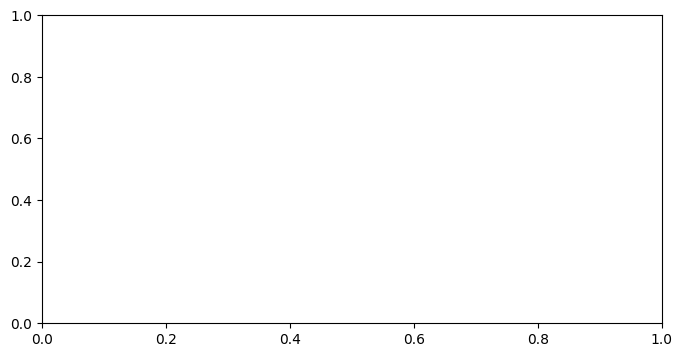

In [ ]:
##########
######get auc (shoudl add balanced accuarcy but wasnt goos)form phase and odontu from single time point
#########

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    all_scores_per_i = {}
    all_auc_per_i = {}
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    # fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []

        n_timesteps_list = []
        onset = resampled_onset-1

        
        for n_timesteps in range(1, 15, 4):
            # n_timesteps = 0
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")

            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, onset, n_tracks)
            
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            no_rev_at_onset = Y_latency!=0
            Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
            X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
            
            ###    
            # X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
            balanced_accuracy_scores = []
            aucs = []
            models = []

            for split_idx in range(n_splits):
                # X_train, X_test, y_train, y_test = train_test_split(
                #     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)
                
                X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=split_idx)
                


                best_model = LogisticRegression(penalty='l2', solver='liblinear')
                best_model.fit(X_train, y_train)
                
                y_pred = best_model.predict(X_test)
                score = balanced_accuracy_score(y_test, y_pred)  
                # score = accuracy_score(y_test, y_pred)  

                balanced_accuracy_scores.append(score)
                y_proba = best_model.predict_proba(X_test)[:, 1]
                
                # y_proba = best_model.decision_function(X_test)
                aucs.append(roc_auc_score(y_test, y_proba)  )
                # print("balanced_accuracy_scores", balanced_accuracy_scores)
                # print(aucs)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test, c))

            accuracy_mean = np.mean(balanced_accuracy_scores)
            accuracy_std = np.std(balanced_accuracy_scores)
            best_model_idx = np.argmax(balanced_accuracy_scores)
            best_model_overall = models[best_model_idx]
            

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_scores_per_i[(i, n_timesteps)] = balanced_accuracy_scores
            all_auc_per_i[(i, n_timesteps)] = aucs
            score_means.append(accuracy_mean)
            score_stds.append(accuracy_std)
            results_dict[(i, n_timesteps)] = (accuracy_mean, accuracy_std)
            best_models[(i, n_timesteps)] = best_model_overall


            # # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
            # ax.errorbar(n_timesteps_list, score_means, yerr=score_stds, #color=cmap1(i),
            #             fmt='-o', capsize=5, label = f"stim {i}")


            # ax.set_title(f"{neuron}; donut only; Reversal prediction;\n Mean ± STD balanced accuracy")
            # ax.set_xlabel("max time delay (frames)")
            # ax.set_ylabel("balanced accuracy")
        #
        # ax.legend()
        # n_timesteps = 0
        fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
        x_vals = list(range(len(resampled_onsets)))  # i values
        for i in range(len(resampled_onsets)):
            # Collect bar plot data
            
            # bar_heights = [results_dict[(i, n_timesteps)][0] for i in x_vals]  # mean balanced accuracy
            # bar_errors = [results_dict[(i, n_timesteps)][1] for i in x_vals]  # std 
            bar_heights = [np.mean(all_scores_per_i[(i, n_timesteps)]) for i in x_vals]  # mean balanced accuracy
            bar_errors = [np.std(all_scores_per_i[(i, n_timesteps)]) for i in x_vals]  # std 

        # Create bar plot
            ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
        ax_bar.set_xticks(x_vals)
        ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
        ax_bar.set_ylabel("Mean Balanced Accuracy")
        ax_bar.set_title(f"{neuron}; donut only; Reversal prediction\nBar plot of balanced accuracy ± STD")
        ax_bar.set_ylim(0, 1)
        ax_bar.grid(True, axis='y')

        
        
        fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
        x_vals = list(range(len(resampled_onsets)))  # i values
        # Collect bar plot data
        for i in range(len(resampled_onsets)):
        
            bar_heights = [np.mean(all_auc_per_i[(i, n_timesteps)]) for i in x_vals]  # mean balanced accuracy
            bar_errors = [np.std(all_auc_per_i[(i, n_timesteps)]) for i in x_vals]  # std 

            # Create bar plot
            ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
        ax_bar.set_xticks(x_vals)
        ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
        ax_bar.set_ylabel("Mean auc")
        ax_bar.set_title(f"{neuron}; {n_timesteps}; donut only; Reversal prediction\nBar plot of auc ± STD")
        ax_bar.set_ylim(0, 1)
        ax_bar.grid(True, axis='y')
        plt.grid(True)
        plt.tight_layout()
        # plt.savefig(f"r2_plot_i{i}.png")
        # plt.close()



# n_timesteps = 0
# # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
# #                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
# #                             for t in range(n_timesteps)]).flatten()
# for i in range(len(resampled_onsets)):
#     model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#     model_label= f"{neuron} stim: {i}; linear SVC;\ndonut only "#; lasso_a{np.round(alpha,2)}"
#     visualize_model_classification(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-1,1])
    
# plt.show()


Processing i=0, n_timesteps=1
Best split R²: -0.000, Mean R²: -0.035 ± 0.040

Processing i=0, n_timesteps=4
Best split R²: 0.213, Mean R²: 0.007 ± 0.202

Processing i=0, n_timesteps=7
Best split R²: 0.690, Mean R²: 0.532 ± 0.105

Processing i=0, n_timesteps=10
Best split R²: 0.827, Mean R²: 0.733 ± 0.076

Processing i=0, n_timesteps=13
Best split R²: 0.828, Mean R²: 0.732 ± 0.075

Processing i=1, n_timesteps=1
Best split R²: -0.000, Mean R²: -0.027 ± 0.033

Processing i=1, n_timesteps=4
Best split R²: 0.193, Mean R²: 0.063 ± 0.082

Processing i=1, n_timesteps=7
Best split R²: 0.504, Mean R²: 0.341 ± 0.137

Processing i=1, n_timesteps=10
Best split R²: 0.590, Mean R²: 0.406 ± 0.156

Processing i=1, n_timesteps=13
Best split R²: 0.602, Mean R²: 0.423 ± 0.158

Processing i=2, n_timesteps=1
Best split R²: 0.030, Mean R²: -0.037 ± 0.067

Processing i=2, n_timesteps=4
Best split R²: 0.097, Mean R²: -0.023 ± 0.117

Processing i=2, n_timesteps=7
Best split R²: 0.525, Mean R²: 0.333 ± 0.094

P

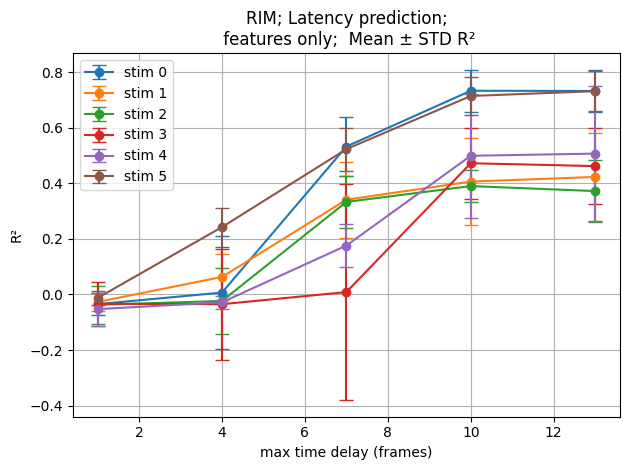

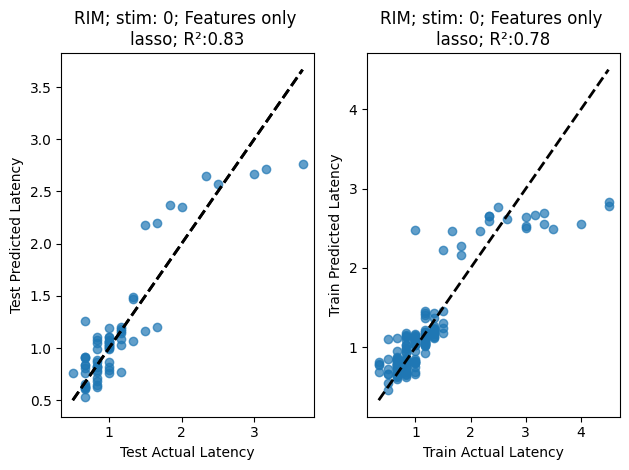

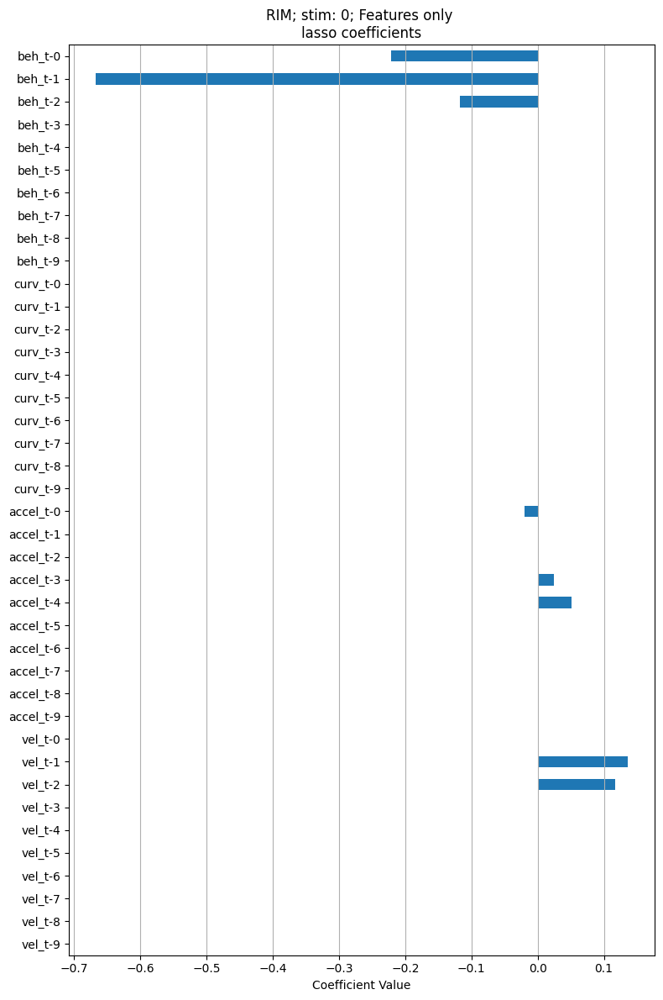

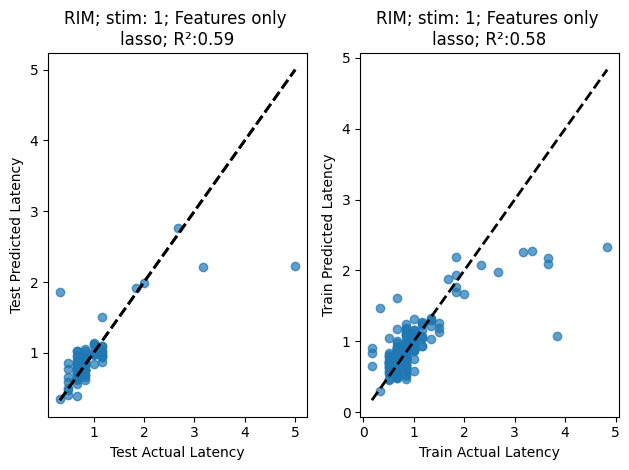

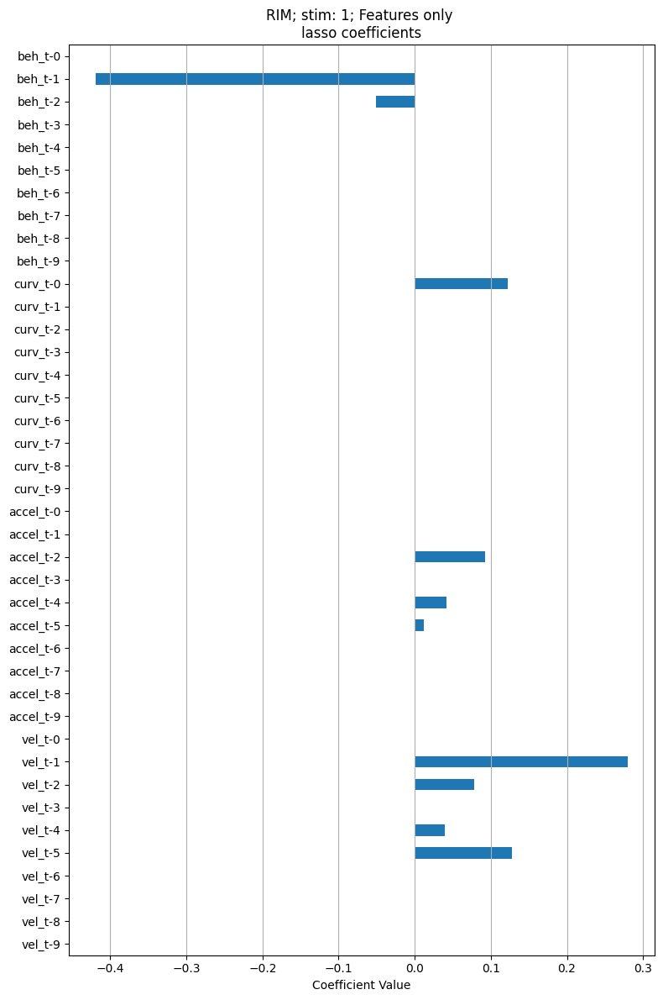

...

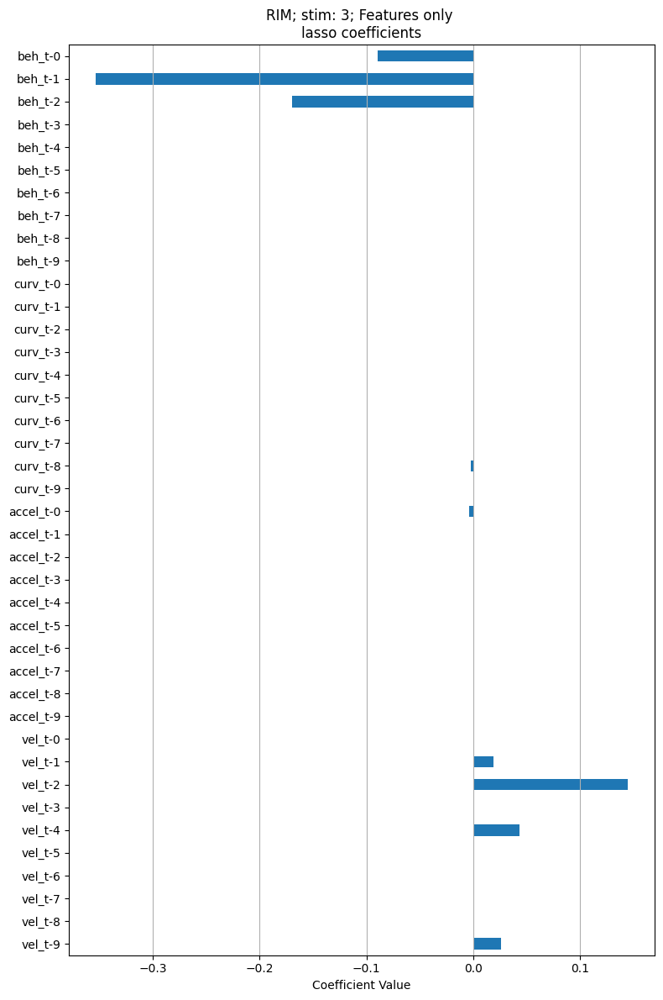

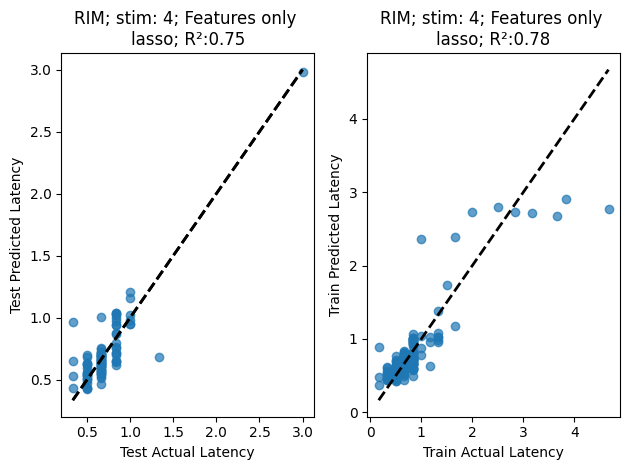

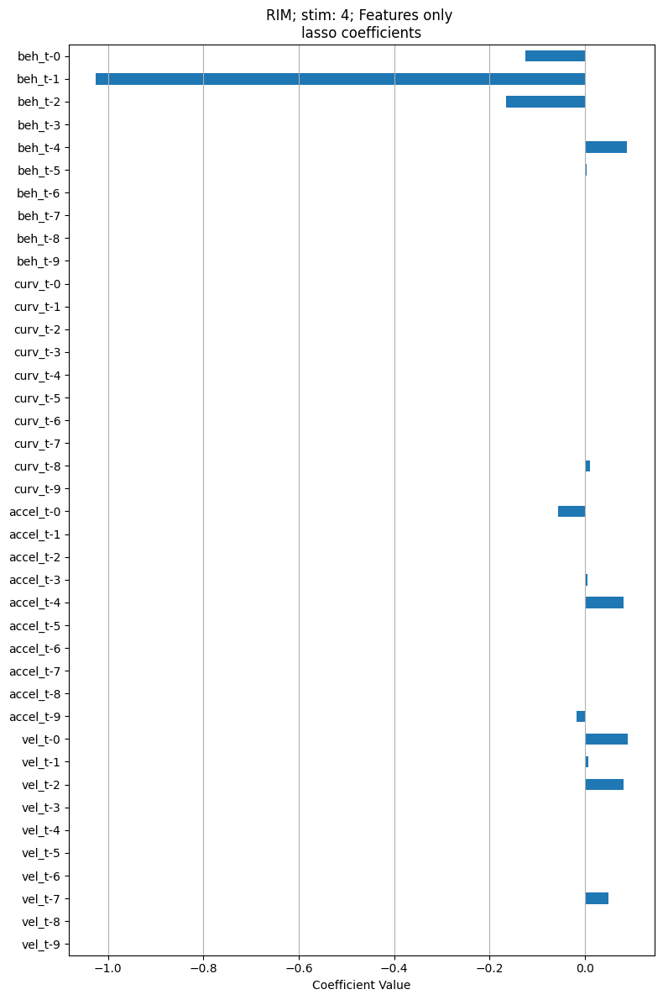

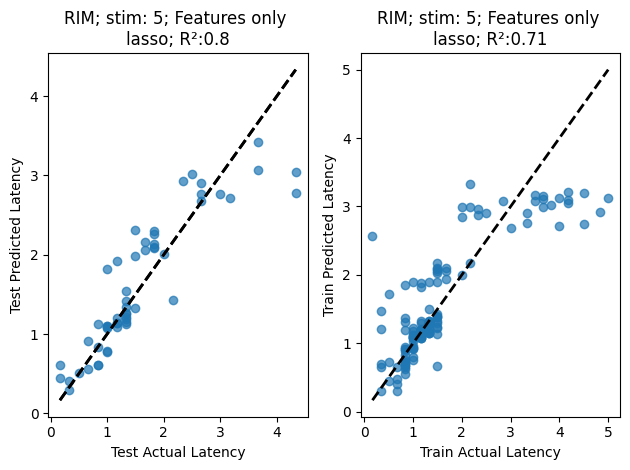

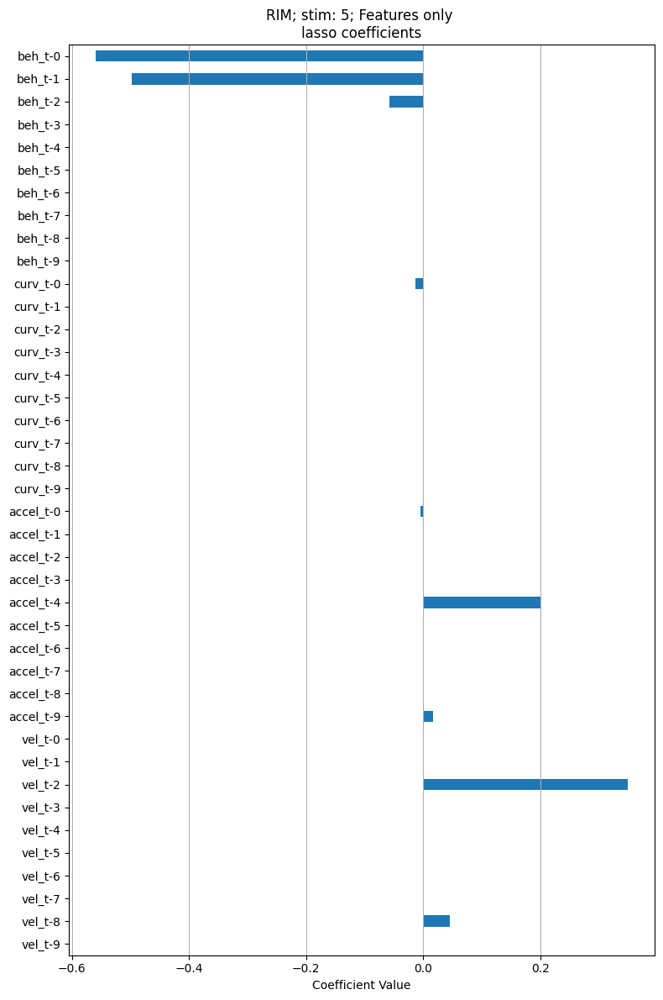

In [ ]:
#########
####predict latency from features only resmpale 
#############

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks  = resampled_vel.shape[0]
    # phase_resampled = feature_all_to_resampled(inferred_phases_all)
    # radii_resampled = feature_all_to_resampled(inferred_rad_all) 


    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    T = 5
    lstm_lag = 0
    fps = 1.6
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        all_r2s_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        # for n_timesteps in range(5, 10, 2):
        # for n_timesteps in range(1, 15, 1):
        for n_timesteps in range(1, 15, 3):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                    f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                    for t in range(n_timesteps)]).flatten()

            X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,  z, lstm_lag = lstm_lag,  include_beh = False)#shape (n_tracks, n_frames, n_features)


            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency=6 * durations[i] + 1) / 6
            valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            X_stim_all_latency = X_stim_all[valid_indices]
            Y_latency_valid = Y_latency[valid_indices]

            r2s = []
            models = []

            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

                alphas = np.logspace(-4, 2, 20)
                lasso = Lasso(max_iter=10000)
                grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
                grid_search.fit(X_train, y_train)

                best_model = grid_search.best_estimator_
                y_pred = best_model.predict(X_test)
                r2 = r2_score(y_test, y_pred)

                r2s.append(r2)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test))

            r2_mean = np.mean(r2s)
            r2_std = np.std(r2s)
            best_model_idx = np.argmax(r2s)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_r2s_per_i[(i, n_timesteps)] = r2s
            r2_means.append(r2_mean)
            r2_stds.append(r2_std)
            results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
            best_models[(i, n_timesteps)] = best_model_overall

            # # Optional: Save model to disk
            # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
            #     pickle.dump(best_model_overall, f)

            print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        # for x, n_t in enumerate(n_timesteps_list):
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
        # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
        ax.set_title(f"{neuron}; Latency prediction;\n features only;  Mean ± STD R²")
        ax.set_xlabel("max time delay (sec)")
        ax.set_ylabel("R²")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()



        
        
    n_timesteps = 10
    feature_names = np.array([[f"vel_t-{np.round((n_timesteps - t - 1)/fps,2)}", f"accel_t-{np.round((n_timesteps - t - 1)/fps,2)}",
                                f"curv_t-{np.round((n_timesteps - t - 1)/fps,2)}"]
                                for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
        
        # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        model_label= f"{neuron}; stim: {i}; Features only \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = True)#, xlim = [-2,1])



Processing i=0, n_timesteps=1
n_timesteps 459
n_timesteps 459
Best split R²: 0.190, Mean R²: 0.034 ± 0.076

Processing i=0, n_timesteps=4
n_timesteps 459
n_timesteps 459
Best split R²: 0.433, Mean R²: 0.321 ± 0.087

Processing i=0, n_timesteps=7
n_timesteps 459
n_timesteps 459
Best split R²: 0.684, Mean R²: 0.557 ± 0.079

Processing i=0, n_timesteps=10
n_timesteps 459
n_timesteps 459
Best split R²: 0.828, Mean R²: 0.743 ± 0.068

Processing i=0, n_timesteps=13
n_timesteps 459
n_timesteps 459
Best split R²: 0.828, Mean R²: 0.740 ± 0.067

Processing i=1, n_timesteps=1
n_timesteps 459
n_timesteps 459
Best split R²: 0.189, Mean R²: 0.097 ± 0.045

Processing i=1, n_timesteps=4
n_timesteps 459
n_timesteps 459
Best split R²: 0.270, Mean R²: 0.197 ± 0.063

Processing i=1, n_timesteps=7
n_timesteps 459
n_timesteps 459
Best split R²: 0.469, Mean R²: 0.332 ± 0.068

Processing i=1, n_timesteps=10
n_timesteps 459
n_timesteps 459
Best split R²: 0.592, Mean R²: 0.396 ± 0.163

Processing i=1, n_timest

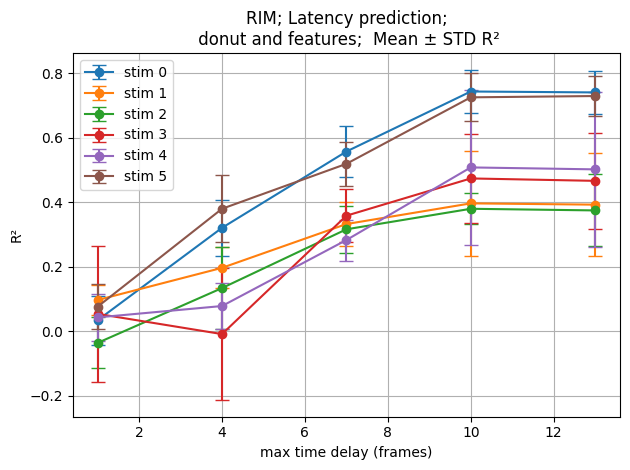

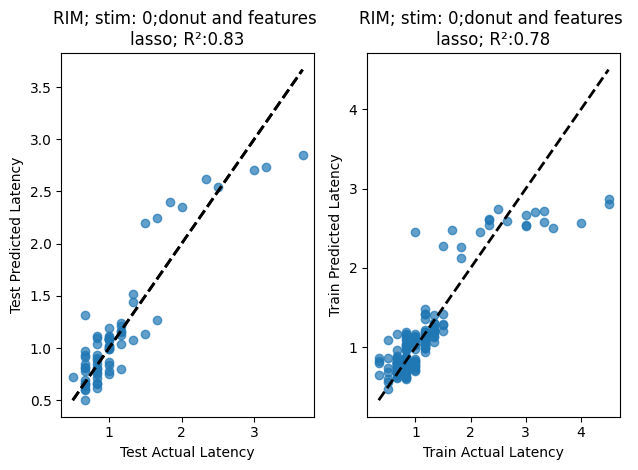

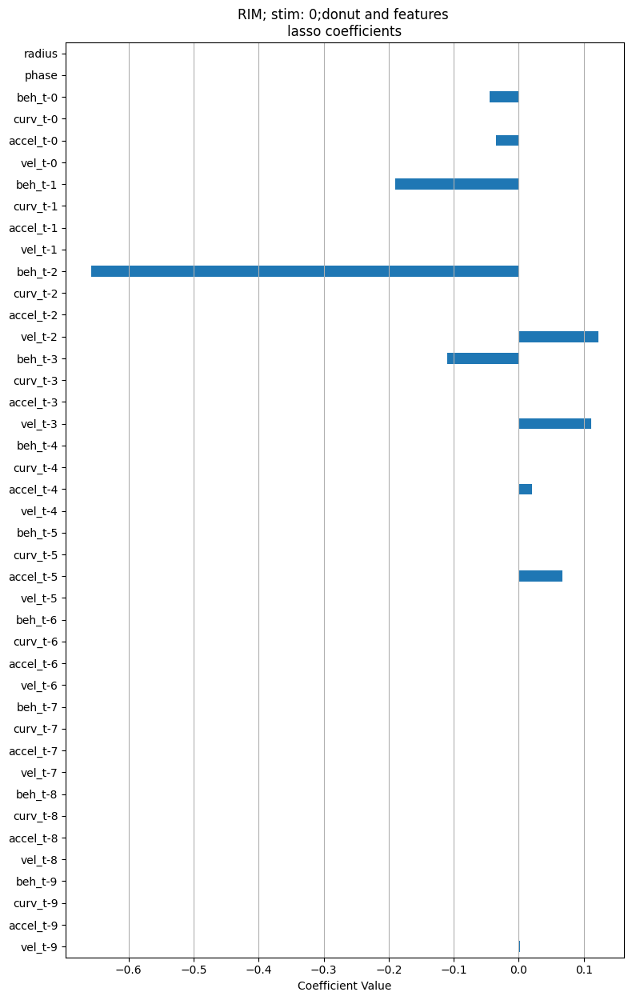

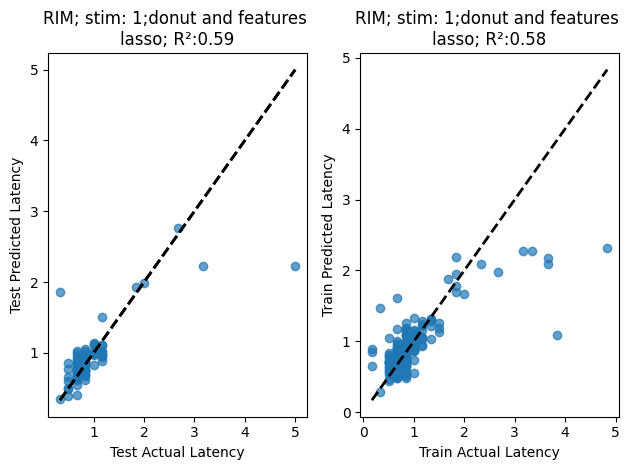

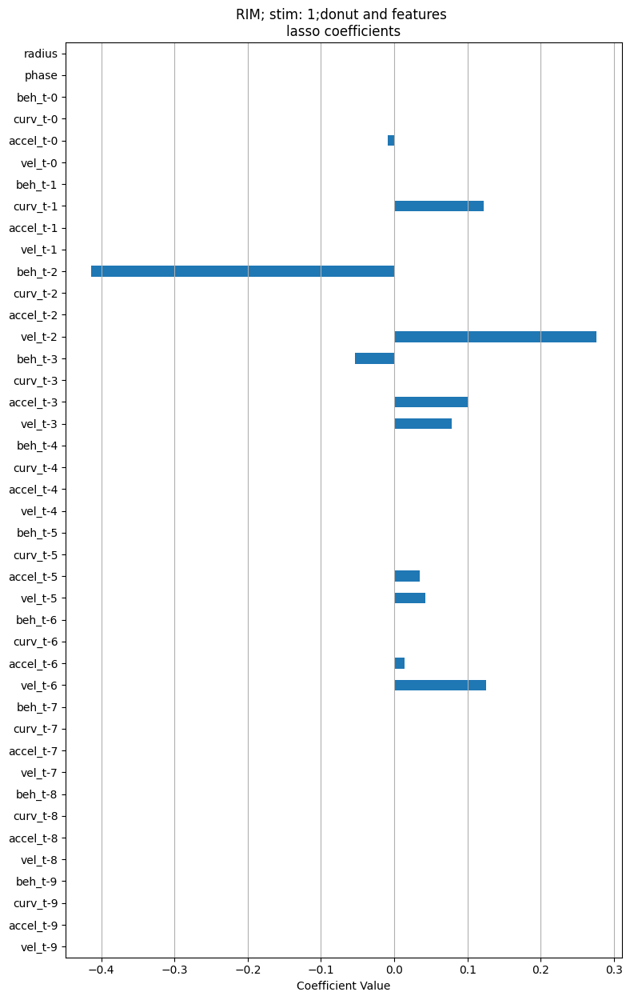

...

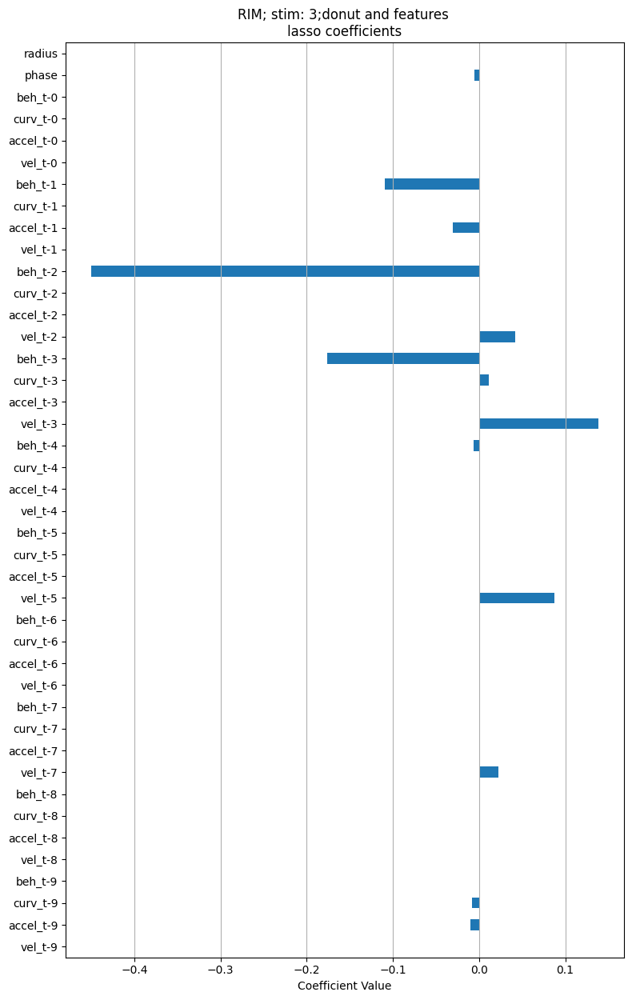

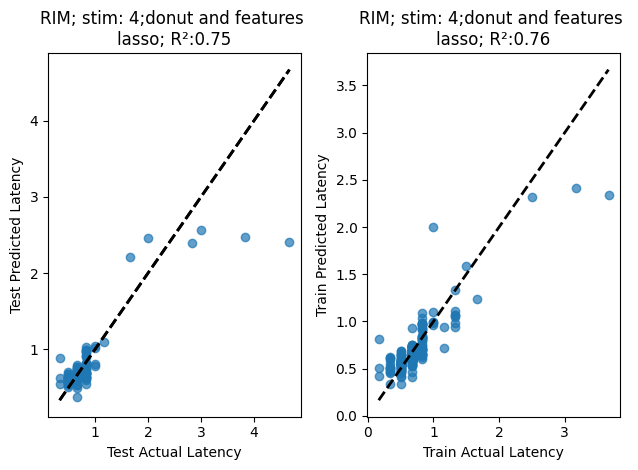

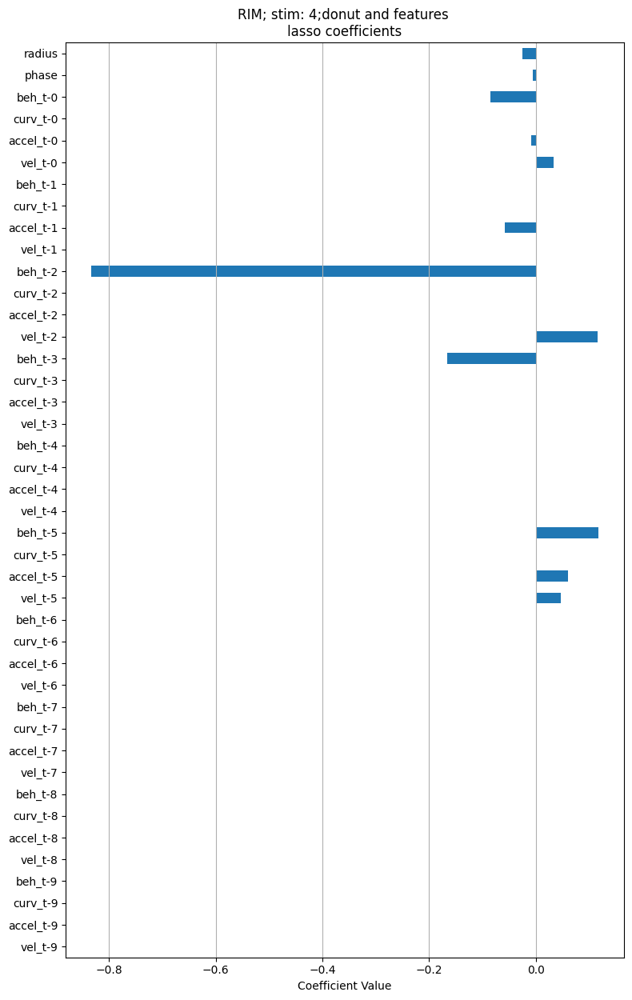

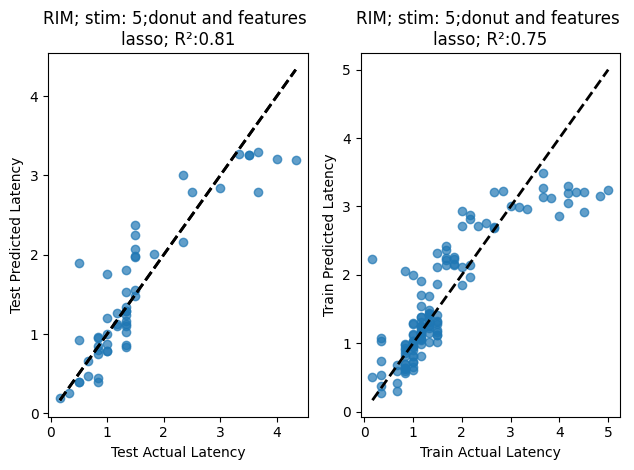

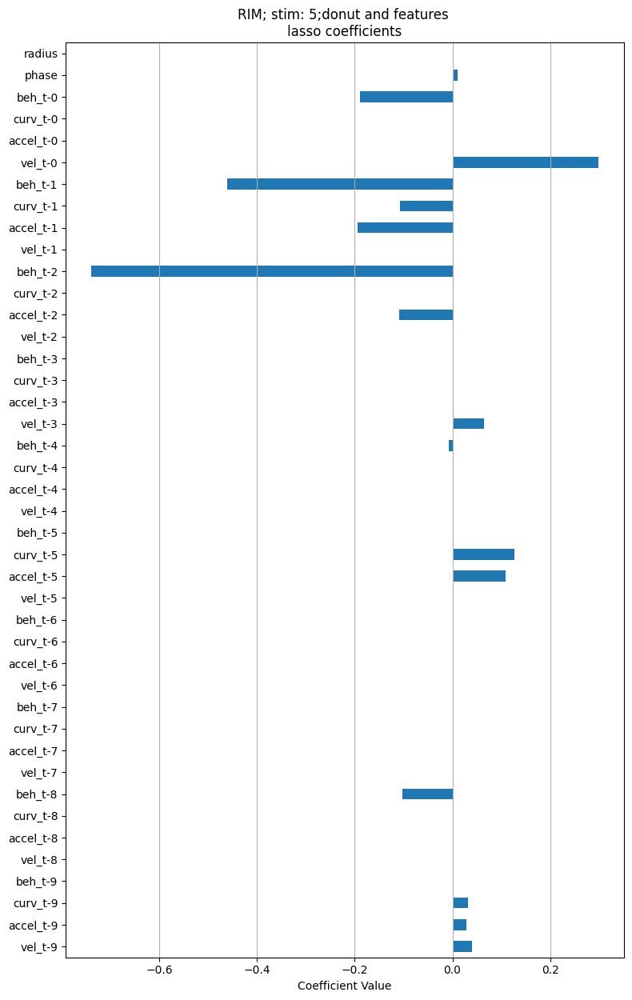

In [ ]:
############donut and features resampled fps 
from predict_latency_prob_from_features_donut_4 import prep_FB_inputs_features_only, prep_FB_inputs_feature_and_donut
with warnings.catch_warnings():
    fps = 1.6
    warnings.simplefilter("ignore")
    n_tracks  = resampled_vel.shape[0]
    # phase_resampled = feature_all_to_resampled(inferred_phases_all)
    # radii_resampled = feature_all_to_resampled(inferred_rad_all) 


    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    T = 5
    lstm_lag = 0
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        all_r2s_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        # for n_timesteps in range(5, 10, 2):
        # for n_timesteps in range(1, 15, 1):
        for n_timesteps in range(1, 15, 3):
            print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                    f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                    for t in range(n_timesteps)]).flatten()


            # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps, z, lstm_lag = 0)

            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency=6 * durations[i] + 1) / 6
            valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            X_stim_all_latency = X_stim_all[valid_indices]
            Y_latency_valid = Y_latency[valid_indices]

            r2s = []
            models = []

            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

                alphas = np.logspace(-4, 2, 20)
                lasso = Lasso(max_iter=10000)
                grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
                grid_search.fit(X_train, y_train)

                best_model = grid_search.best_estimator_
                y_pred = best_model.predict(X_test)
                r2 = r2_score(y_test, y_pred)

                r2s.append(r2)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test))

            r2_mean = np.mean(r2s)
            r2_std = np.std(r2s)
            best_model_idx = np.argmax(r2s)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_r2s_per_i[(i, n_timesteps)] = r2s
            r2_means.append(r2_mean)
            r2_stds.append(r2_std)
            results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
            best_models[(i, n_timesteps)] = best_model_overall

            # # Optional: Save model to disk
            # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
            #     pickle.dump(best_model_overall, f)

            print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        # for x, n_t in enumerate(n_timesteps_list):
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
        # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
        ax.set_title(f"{neuron}; Latency prediction;\n donut and features;  Mean ± STD R²")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("R²")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()



        
        
    n_timesteps = 10
    # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
    #                             f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
    #                             for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
        
        # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        X_stim_features, feature_names = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, resampled_onset,   n_timesteps, z,  lstm_lag = lstm_lag, fps = fps)#shape (n_tracks, n_frames, n_features)
        X_donut_stim, donut_names = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, resampled_onset, n_tracks)
        X_stim_all =  np.concatenate([X_stim_features ,  X_donut_stim], axis = 1)
        feature_names_all = np.array(feature_names.tolist()+donut_names)
        model_label= f"{neuron}; stim: {i};donut and features \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])



Processing i=0, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.138, Mean R²: 0.024 ± 0.057

Processing i=1, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.021, Mean R²: -0.020 ± 0.035

Processing i=2, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.038, Mean R²: -0.014 ± 0.044

Processing i=3, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.057, Mean R²: 0.023 ± 0.020

Processing i=4, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: -0.001, Mean R²: -0.047 ± 0.060

Processing i=5, n_timesteps=0
n_timesteps 459
n_timesteps 459
Best split R²: 0.013, Mean R²: -0.015 ± 0.016


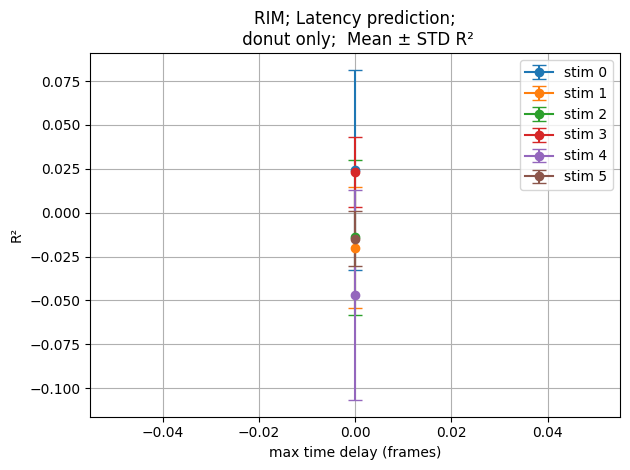

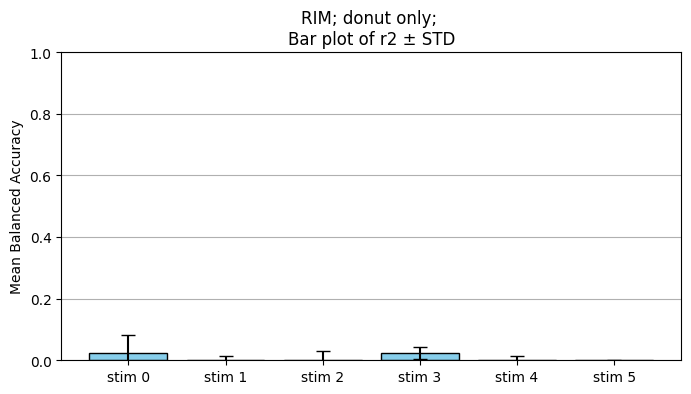

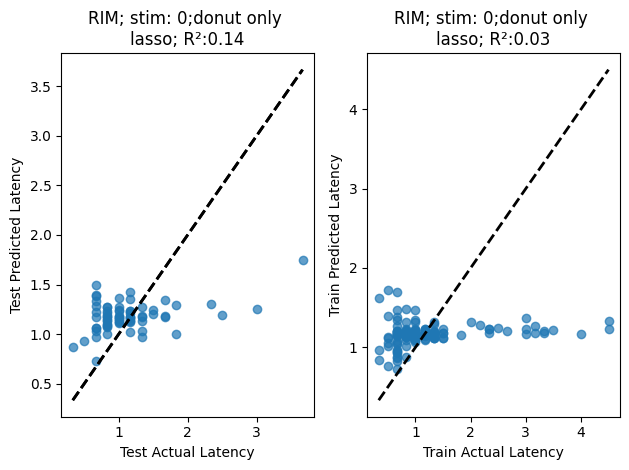

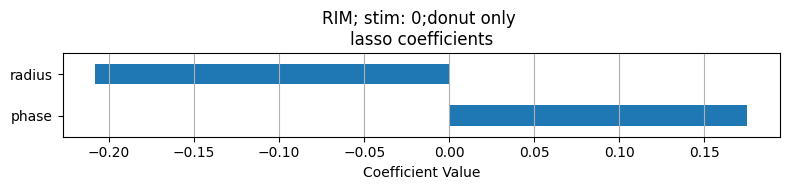

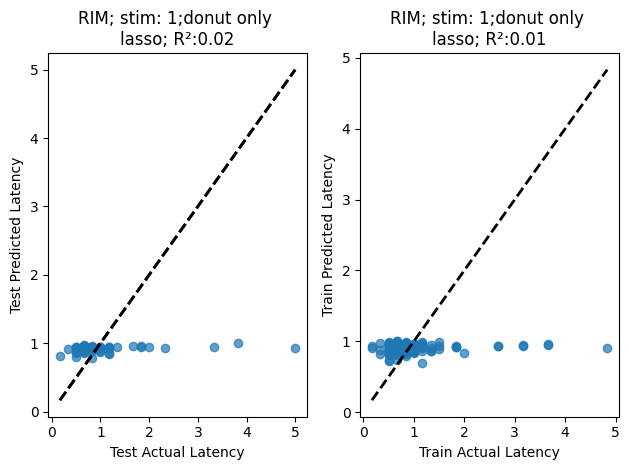

...

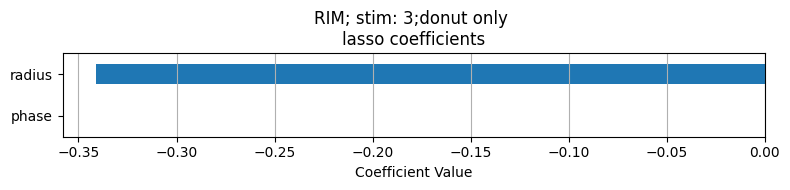

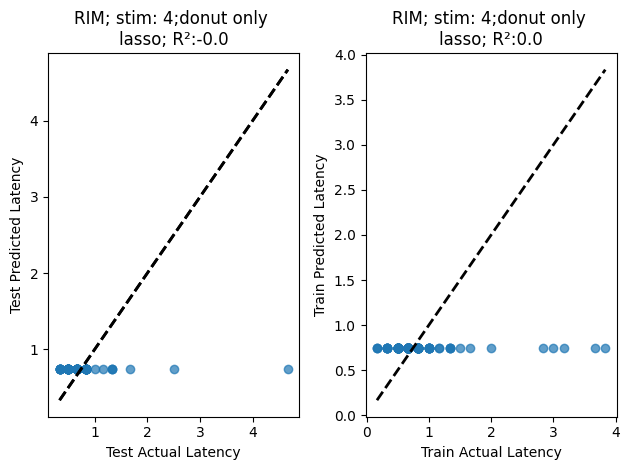

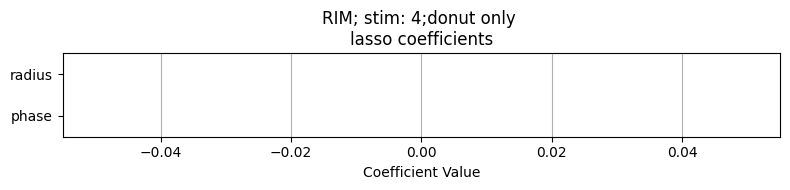

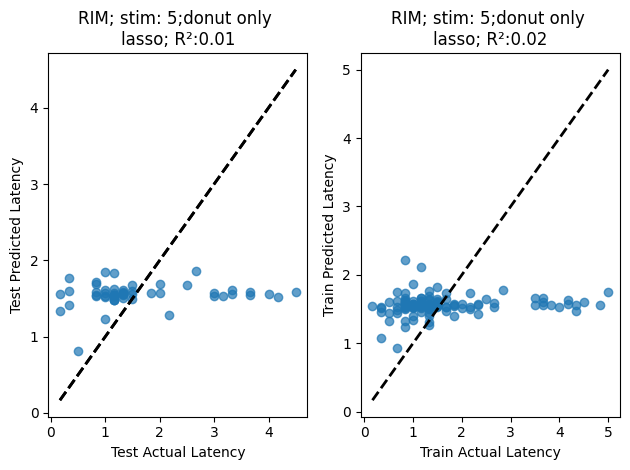

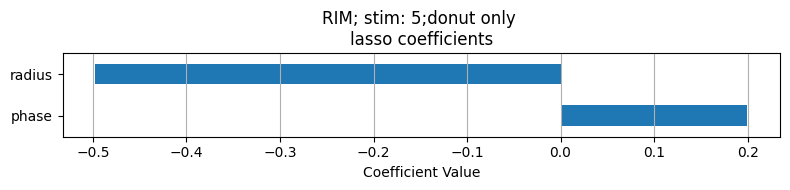

In [ ]:
#####get latency contribution donut only 
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    n_tracks  = resampled_vel.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    T = 5
    lstm_lag = 0
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        all_r2s_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        # for n_timesteps in range(5, 10, 2):
        # for n_timesteps in range(1, 15, 1):
        # for n_timesteps in range(1, 15, 3):
        n_timesteps = 0
        print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
        feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
                                f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
                                for t in range(n_timesteps)]).flatten()


        # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
        # X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps, lstm_lag = 0)
        X_stim_all, feature_names_all = prep_FB_inputs_donut_only( inferred_phases_all, inferred_rad_all, onset, n_tracks)

        Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency=6 * durations[i] + 1) / 6
        valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
        X_stim_all_latency = X_stim_all[valid_indices]
        Y_latency_valid = Y_latency[valid_indices]

        r2s = []
        models = []

        for split_idx in range(n_splits):
            X_train, X_test, y_train, y_test = train_test_split(
                X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

            alphas = np.logspace(-4, 2, 20)
            lasso = Lasso(max_iter=10000)
            grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
            grid_search.fit(X_train, y_train)

            best_model = grid_search.best_estimator_
            y_pred = best_model.predict(X_test)
            r2 = r2_score(y_test, y_pred)

            r2s.append(r2)
            # models.append(best_model)
            models.append((best_model,X_train, X_test, y_train, y_test))

        r2_mean = np.mean(r2s)
        r2_std = np.std(r2s)
        best_model_idx = np.argmax(r2s)
        best_model_overall = models[best_model_idx]

        # Save results
        n_timesteps_list.append(n_timesteps)
        # all_r2_means.append(r2s)
        all_r2s_per_i[(i, n_timesteps)] = r2s
        r2_means.append(r2_mean)
        r2_stds.append(r2_std)
        results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
        best_models[(i, n_timesteps)] = best_model_overall

        # # Optional: Save model to disk
        # with open(f"best_model_i{i}_T{n_timesteps}.pkl", "wb") as f:
        #     pickle.dump(best_model_overall, f)

        print(f"Best split R²: {r2s[best_model_idx]:.3f}, Mean R²: {r2_mean:.3f} ± {r2_std:.3f}")


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(n_timesteps_list, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")
        # for x, n_t in enumerate(n_timesteps_list):
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     plt.scatter([n_t]*len(r2s), r2s, color='gray', alpha=0.6, s=30, label='Split R²' if x == 0 else None)
        # for x, n_t in enumerate(n_timesteps_list): # plot jsut max 
        #     r2s = all_r2s_per_i[(i, n_t)]
        #     ax.scatter(n_t, max(r2s), color=cmap1(i), alpha=0.6, s=30, marker='^', facecolors='none', edgecolors=color, label='Split R²' if x == 0 else None)
        ax.set_title(f"{neuron}; Latency prediction;\n donut only;  Mean ± STD R²")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("R²")
        
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()
    
            
    fig_bar, ax_bar = plt.subplots(figsize=(8, 4))
    # Collect bar plot data
    x_vals = list(range(len(resampled_onsets)))  # i values
    bar_heights = [results_dict[(i, 0)][0] for i in x_vals]  # mean balanced accuracy
    bar_errors = [results_dict[(i, 0)][1] for i in x_vals]  # std 

    # Create bar plot
    ax_bar.bar(x_vals, bar_heights, yerr=bar_errors, capsize=5, color='skyblue', edgecolor='k')
    ax_bar.set_xticks(x_vals)
    ax_bar.set_xticklabels([f"stim {i}" for i in x_vals])
    ax_bar.set_ylabel("Mean Balanced Accuracy")
    ax_bar.set_title(f"{neuron}; donut only; \nBar plot of r2 ± STD")
    ax_bar.set_ylim(0, 1)
    ax_bar.grid(True, axis='y')




        
        
    n_timesteps = 0

    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 
        
        # print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV

        model_label= f"{neuron}; stim: {i};donut only \nlasso"#_a{np.round(alpha,2)}"#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])

In [ ]:
########compare latnecy prediciton singel feautre exp fps






# warnings.simplefilter("ignore")

# for feature, exp_feature, feature_lbl in zip([resampled_vel, resampled_acc, resampled_curve],
#                                                 [exp_vel, exp_acc, exp_curve], 
#                                                 ["vel", "accel", "curv"]):
#     print("feature_lbl", feature_lbl)
#     include_beh = False
#     n_tracks = resampled_rev.shape[0]
#     n_splits = 10
#     results_dict = {}  # Store mean/std r² per i and n_timesteps
#     best_models = {}   # Store best model per (i, n_timesteps)
#     lstm_lag = 0
#     idxs = [[0],[1],[2],[3],[4],[5]]
#     fig, ax = plt.subplots()
#     for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
#         score_means = []
#         score_stds = []
#         # all_r2_means = []
#         all_scores_per_i = {}
#         n_timesteps_list = []
#         onset = resampled_onset-1
        
        
        
#         for n_timesteps in range(1, 15, 3):
            
#             # phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
#             # radii_resampled =  feature_all_to_resampled(inferred_rad_all, n_tracks)
#             # features_list = [phase_resampled, radii_resampled]
#             # feature_labels = ["phase", "radii"]
#             # X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
#             #     # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
#             #     features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
            
#             #                 )
            
            
                    
        
#             features_list = [exp_feature]
#             feature_labels = [feature_lbl]
#             X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
#                 # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
#                 features_list, feature_labels, exp_onset-1,  n_timesteps, z, lstm_lag = lstm_lag, 
            
#                             )
#             # print(np.all(X_stim_all1==X_stim_all))
#             Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
#             valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
#             X_stim_all_latency = X_stim_all[valid_indices]
#             Y_latency_valid = Y_latency[valid_indices]

#             r2s = []
#             models = []

#             for split_idx in range(n_splits):
#                 X_train, X_test, y_train, y_test = train_test_split(
#                     X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

#                 alphas = np.logspace(-4, 2, 20)
#                 lasso = Lasso(max_iter=10000)
#                 grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
#                 grid_search.fit(X_train, y_train)

#                 best_model = grid_search.best_estimator_
#                 y_pred = best_model.predict(X_test)
#                 r2 = r2_score(y_test, y_pred)

#                 r2s.append(r2)
#                 # models.append(best_model)
#                 models.append((best_model,X_train, X_test, y_train, y_test))

#             r2_mean = np.mean(r2s)
#             r2_std = np.std(r2s)
#             best_model_idx = np.argmax(r2s)
#             best_model_overall = models[best_model_idx]

#             # Save results
#             n_timesteps_list.append(n_timesteps)
#             # all_r2_means.append(r2s)
#             all_r2s_per_i[(i, n_timesteps)] = r2s
#             r2_means.append(r2_mean)
#             r2_stds.append(r2_std)
#             results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
#             best_models[(i, n_timesteps)] = best_model_overall
            

#             # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
#             ax.errorbar(np.array(n_timesteps_list)/fps, r2_means, yerr=r2_stds, #color=cmap1(i),
#                         fmt='-o', capsize=5, label = f"stim {i}")

#             ax.set_title(f"{neuron}; {feature_lbl} only; Reversal prediction;\n Mean ± STD balanced accuracy")
#             ax.set_xlabel("max time delay (sec)")
#             ax.set_ylabel("balanced accuracy")
#         ax.legend()
#         plt.grid(True)
#         plt.tight_layout()


#         n_timesteps = 10
#         include_beh = False
        


#         feature_names = np.array([[f"{feature_lbl}-{np.round((n_timesteps - t - 1)/fps, 2) }"
#                         ]
#                                 for t in range(n_timesteps)]).flatten()
#         for i in range(len(resampled_onsets)):
#             model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

#             model_label= f"{neuron} stim: {i}; lasso; {feature_lbl} only "#; lasso_a{np.round(alpha,2)}"
#             visualize_model_regression(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])
# plt.show()


In [ ]:
#######compare altency vs all feature full fps 

feature_lbl vel
['vel_t-0']
['vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-6' 'vel_t-5' 'vel_t-4' 'vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-9' 'vel_t-8' 'vel_t-7' 'vel_t-6' 'vel_t-5' 'vel_t-4' 'vel_t-3'
 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-12' 'vel_t-11' 'vel_t-10' 'vel_t-9' 'vel_t-8' 'vel_t-7' 'vel_t-6'
 'vel_t-5' 'vel_t-4' 'vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-0']
['vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-6' 'vel_t-5' 'vel_t-4' 'vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-9' 'vel_t-8' 'vel_t-7' 'vel_t-6' 'vel_t-5' 'vel_t-4' 'vel_t-3'
 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-12' 'vel_t-11' 'vel_t-10' 'vel_t-9' 'vel_t-8' 'vel_t-7' 'vel_t-6'
 'vel_t-5' 'vel_t-4' 'vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-0']
['vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-6' 'vel_t-5' 'vel_t-4' 'vel_t-3' 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-9' 'vel_t-8' 'vel_t-7' 'vel_t-6' 'vel_t-5' 'vel_t-4' 'vel_t-3'
 'vel_t-2' 'vel_t-1' 'vel_t-0']
['vel_t-12' 'vel_t-11' 'v

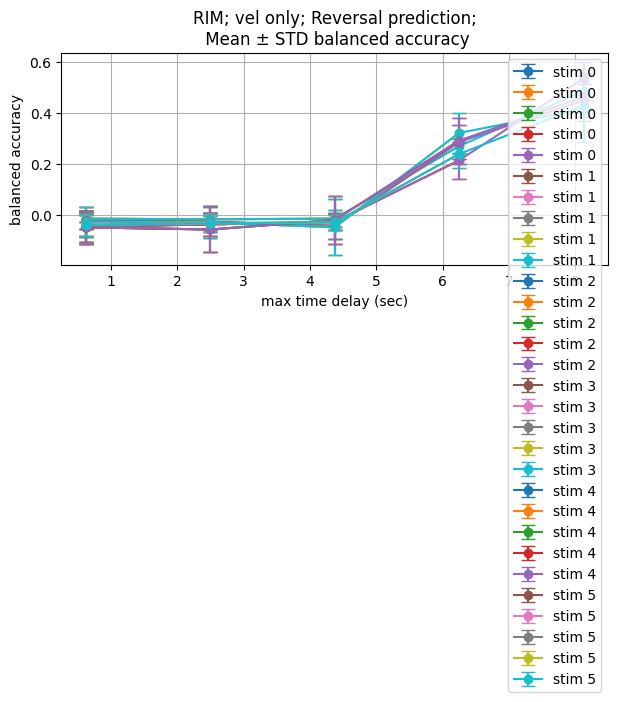

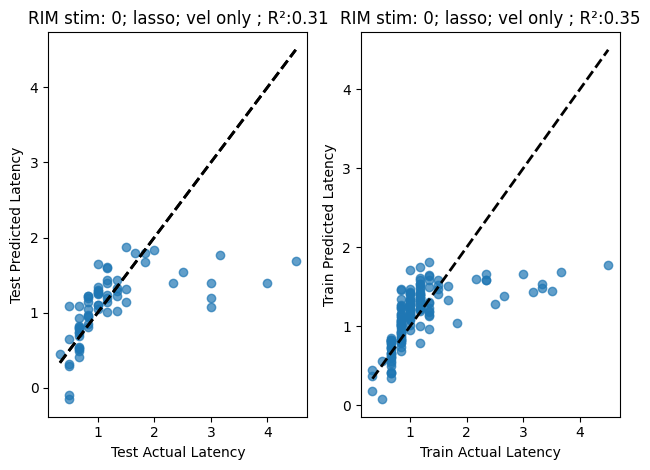

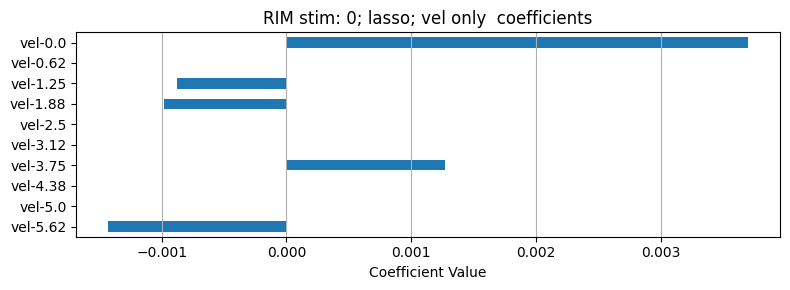

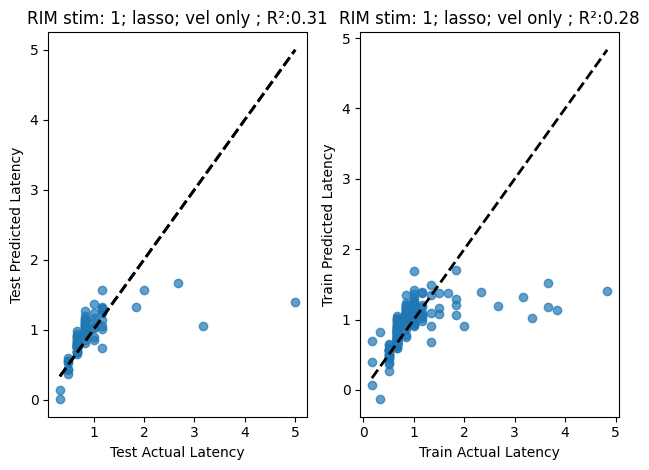

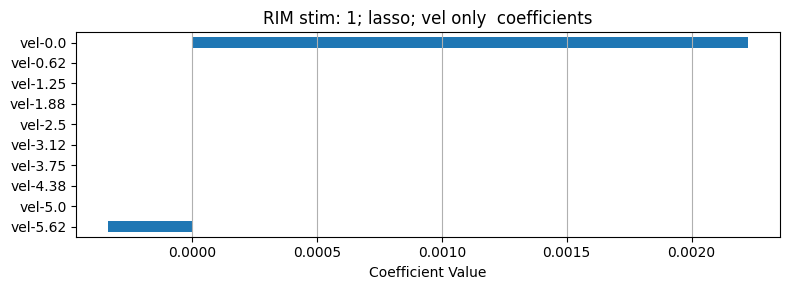

...

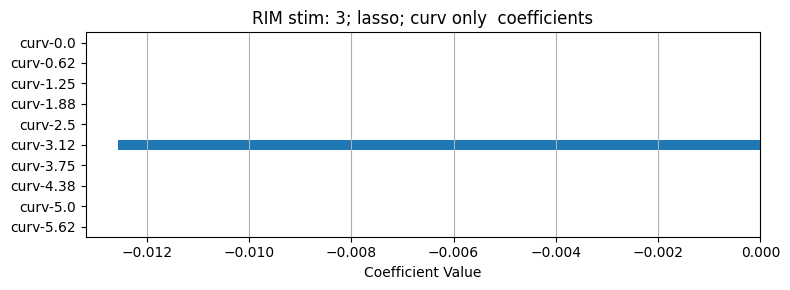

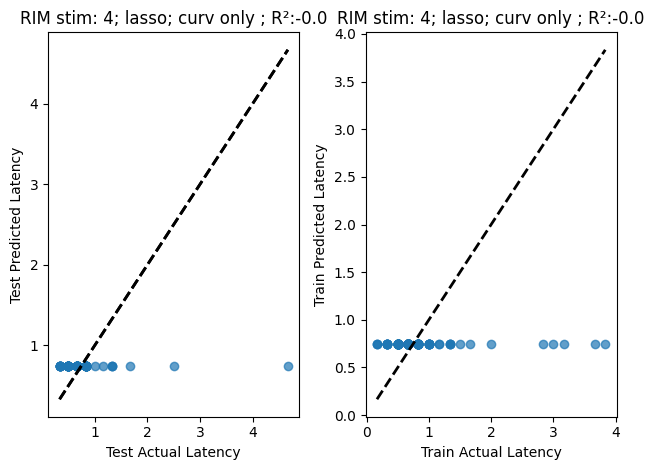

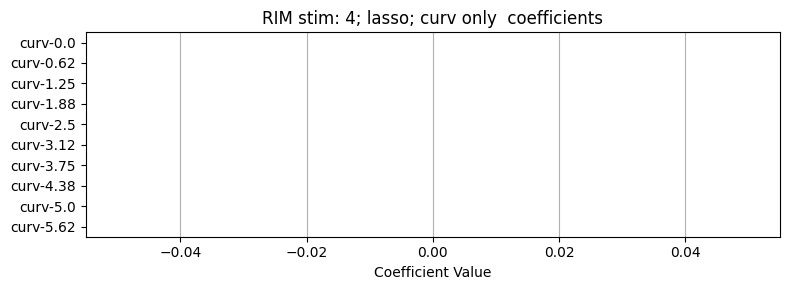

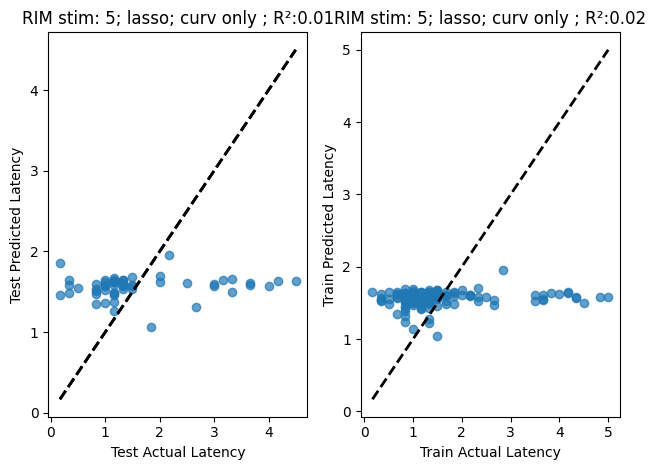

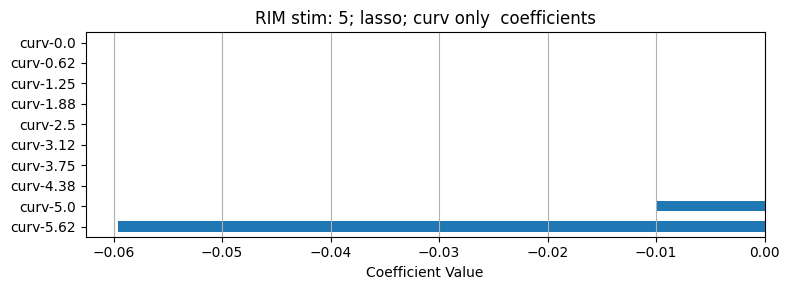

In [ ]:
########compare latnecy prediciton singel feautre resampled fps


warnings.simplefilter("ignore")

for feature, exp_feature, feature_lbl in zip([resampled_vel, resampled_acc, resampled_curve],
                                                [exp_vel, exp_acc, exp_curve], 
                                                ["vel", "accel", "curv"]):
    print("feature_lbl", feature_lbl)
    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    all_r2s_per_i ={}
    lstm_lag = 0
    

    
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        r2_means = []
        r2_stds = []
        # all_r2_means = []
        
        n_timesteps_list = []
        onset = resampled_onset-1
        
        
        
        for n_timesteps in range(1, 15, 3):
            
            # phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
            # radii_resampled =  feature_all_to_resampled(inferred_rad_all, n_tracks)
            # features_list = [phase_resampled, radii_resampled]
            # feature_labels = ["phase", "radii"]
            # X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
            #     # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
            #     features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
            
            #                 )
            
            
                    
        
            features_list = [exp_feature]
            feature_labels = [feature_lbl]
            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                features_list, feature_labels, exp_onset-1,  n_timesteps, z, lstm_lag = lstm_lag, 
            
                            )
            # print(feature_names_all)
            # print(np.all(X_stim_all1==X_stim_all))
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            X_stim_all_latency = X_stim_all[valid_indices]
            Y_latency_valid = Y_latency[valid_indices]

            r2s = []
            models = []

            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

                alphas = np.logspace(-4, 2, 20)
                lasso = Lasso(max_iter=10000)
                grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
                grid_search.fit(X_train, y_train)

                best_model = grid_search.best_estimator_
                y_pred = best_model.predict(X_test)
                r2 = r2_score(y_test, y_pred)

                r2s.append(r2)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test))

            r2_mean = np.mean(r2s)
            r2_std = np.std(r2s)
            best_model_idx = np.argmax(r2s)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_r2s_per_i[(i, n_timesteps)] = r2s
            r2_means.append(r2_mean)
            r2_stds.append(r2_std)
            results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
            best_models[(i, n_timesteps)] = best_model_overall
            

            # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
            ax.errorbar(np.array(n_timesteps_list)/fps, r2_means, yerr=r2_stds, #color=cmap1(i),
                        fmt='-o', capsize=5, label = f"stim {i}")

            ax.set_title(f"{neuron}; {feature_lbl} only; Reversal prediction;\n Mean ± STD balanced accuracy")
            ax.set_xlabel("max time delay (sec)")
            ax.set_ylabel("balanced accuracy")
        ax.legend()
        plt.grid(True)
        plt.tight_layout()


        n_timesteps = list(range(1, 15, 3))[-2]
        include_beh = False
        


    feature_names = np.array([[f"{feature_lbl}-{np.round((n_timesteps - t - 1)/fps, 2) }"
                    ]
                            for t in range(n_timesteps)]).flatten()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 

        model_label= f"{neuron} stim: {i}; lasso; {feature_lbl} only "#; lasso_a{np.round(alpha,2)}"
        visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])
plt.show()


KeyError: (1, 10)

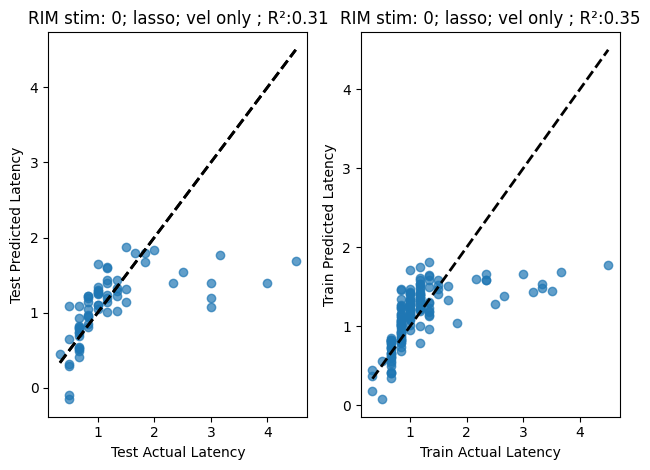

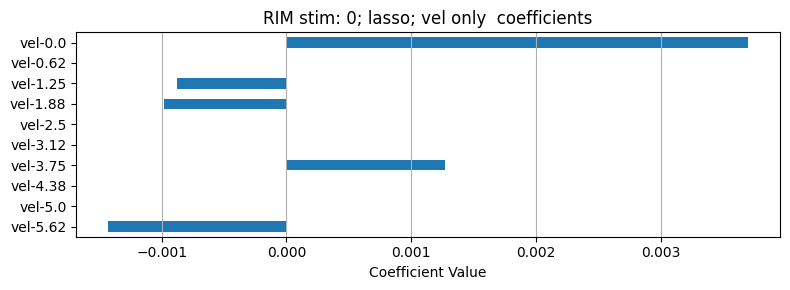

In [ ]:
########compare latnecy prediciton feautres single feature  exp fps

In [ ]:
########compare latnecy prediciton time delayed pahse resampled fps

from predict_latency_prob_from_features_donut_4 import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only, feature_all_to_resampled

with warnings.catch_warnings():
        
    # ##get inputs into lstm 
    # beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

    warnings.simplefilter("ignore")
    fps = 1.6

    include_beh = False
    n_tracks = resampled_rev.shape[0]
    n_splits = 10
    results_dict = {}  # Store mean/std r² per i and n_timesteps
    best_models = {}   # Store best model per (i, n_timesteps)
    lstm_lag = 0
    idxs = [[0],[1],[2],[3],[4],[5]]
    fig, ax = plt.subplots()
    for i, (resampled_onset, exp_onset) in enumerate(zip(resampled_onsets, exp_onsets)):
        score_means = []
        score_stds = []
        # all_r2_means = []
        all_scores_per_i = {}
        n_timesteps_list = []
        onset = resampled_onset-1

        for n_timesteps in range(1, 15, 3):
            
            phase_resampled = feature_all_to_resampled(inferred_phases_all, n_tracks)
            radii_resampled =  feature_all_to_resampled(inferred_rad_all, n_tracks)
            features_list = [phase_resampled, radii_resampled]
            feature_labels = ["phase", "radii"]
            X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                features_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, 
            
                            )
            # print(np.all(X_stim_all1==X_stim_all))
            Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
            
            
            # print(f"\nProcessing i={i}, n_timesteps={n_timesteps}")
            # feature_names = np.array([[f"vel_t-{n_timesteps - t - 1}", f"accel_t-{n_timesteps - t - 1}",
            #                         f"curv_t-{n_timesteps - t - 1}", f"beh_t-{n_timesteps - t - 1}"]
            #                         for t in range(n_timesteps)]).flatten()


            # # X_stim_all, feature_names_all = prep_FB_inputs_features_only(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, onset, n_timesteps,   lstm_lag = lstm_lag)#shape (n_tracks, n_frames, n_features)
            # X_stim_all, feature_names_all =  prep_FB_inputs_feature_and_donut(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, inferred_phases_all, inferred_rad_all,resampled_onset, n_tracks,   n_timesteps, z, lstm_lag = 0)

            # Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency=6 * durations[i] + 1) / 6
            valid_indices = np.argwhere((~np.isnan(Y_latency)) & (Y_latency != 0)).flatten() #non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
            X_stim_all_latency = X_stim_all[valid_indices]
            Y_latency_valid = Y_latency[valid_indices]

            r2s = []
            models = []

            for split_idx in range(n_splits):
                X_train, X_test, y_train, y_test = train_test_split(
                    X_stim_all_latency, Y_latency_valid, test_size=test_size, random_state=split_idx)

                alphas = np.logspace(-4, 2, 20)
                lasso = Lasso(max_iter=10000)
                grid_search = GridSearchCV(lasso, {'alpha': alphas}, cv=5, scoring='r2')
                grid_search.fit(X_train, y_train)

                best_model = grid_search.best_estimator_
                y_pred = best_model.predict(X_test)
                r2 = r2_score(y_test, y_pred)

                r2s.append(r2)
                # models.append(best_model)
                models.append((best_model,X_train, X_test, y_train, y_test))

            r2_mean = np.mean(r2s)
            r2_std = np.std(r2s)
            best_model_idx = np.argmax(r2s)
            best_model_overall = models[best_model_idx]

            # Save results
            n_timesteps_list.append(n_timesteps)
            # all_r2_means.append(r2s)
            all_r2s_per_i[(i, n_timesteps)] = r2s
            r2_means.append(r2_mean)
            r2_stds.append(r2_std)
            results_dict[(i, n_timesteps)] = (r2_mean, r2_std)
            best_models[(i, n_timesteps)] = best_model_overall


        # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
        ax.errorbar(np.array(n_timesteps_list)/fps, r2_means, yerr=r2_stds, #color=cmap1(i),
                    fmt='-o', capsize=5, label = f"stim {i}")

        ax.set_title(f"{neuron}; phase and rad only; Reversal prediction;\n Mean ± STD balanced accuracy")
        ax.set_xlabel("max time delay (frames)")
        ax.set_ylabel("balanced accuracy")
    ax.legend()
    plt.grid(True)
    plt.tight_layout()
    # plt.savefig(f"r2_plot_i{i}.png")
    # plt.close()

    n_timesteps = 10
    include_beh = False

    feature_names = np.array([[f"phase_t-{np.round((n_timesteps - t - 1)/fps, 2) }", f"rad_t-{np.round((n_timesteps - t - 1)/fps, 2) }"
                       ]
                            for t in range(n_timesteps)]).flatten()
    for i in range(len(resampled_onsets)):
        model,X_train, X_test, y_train, y_test, c  = best_models[(i, n_timesteps)] 

        model_label= f"{neuron} stim: {i}; linear SVC; {feature_lbl} only "#; lasso_a{np.round(alpha,2)}"
        visualize_model_classification(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, get_coeff = False, coeffs = model.coef_[0])#, xlim = [-1,1])
        
plt.show()

In [ ]:
########compare latnecy prediciton time delayed pahse exp fps


In [ ]:
#####fix so doing all with the same model across stim 

4; 1; logisticAccuracy: 0.9609375
4; 1; logisticPrecision: 0.92340087890625
4; 1; logisticRecall: 0.9609375
4; 1; logisticF1 Score: 0.9417953187250996
4;1; linear svc l1Accuracy: 0.9609375
4;1; linear svc l1Precision: 0.92340087890625
4;1; linear svc l1Recall: 0.9609375
4;1; linear svc l1F1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Best C: 0.001
Best CV accuracy: 0.5
4;1; linear svc l1 c 0.001Accuracy: 0.0390625
4;1; linear svc l1 c 0.001Precision: 0.00152587890625
4;1; linear svc l1 c 0.001Recall: 0.0390625
4;1; linear svc l1 c 0.001F1 Score: 0.0029370300751879698
4; 1; tree no max depthAccuracy: 0.921875
4; 1; tree no max depthPrecision: 0.921875
4; 1; tree no max depthRecall: 0.921875
4; 1; tree no max depthF1 Score: 0.921875


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4; 1; tree max depth = 3Accuracy: 0.953125
4; 1; tree max depth = 3Precision: 0.9231053149606299
4; 1; tree max depth = 3Recall: 0.953125
4; 1; tree max depth = 3F1 Score: 0.937875
4; 1; SVC rbf kernelAccuracy: 0.9609375
4; 1; SVC rbf kernelPrecision: 0.92340087890625
4; 1; SVC rbf kernelRecall: 0.9609375
4; 1; SVC rbf kernelF1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Best alpha lasso: 0.06951927961775606
Best CV R²: -0.041714940634256514


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_7228/3247618565.py:153: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,2)


4; 3; logisticAccuracy: 0.9609375
4; 3; logisticPrecision: 0.92340087890625
4; 3; logisticRecall: 0.9609375
4; 3; logisticF1 Score: 0.9417953187250996
4;3; linear svc l1Accuracy: 0.9609375
4;3; linear svc l1Precision: 0.92340087890625
4;3; linear svc l1Recall: 0.9609375
4;3; linear svc l1F1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/svm/_base.py:1250: Convergenc

Best C: 0.001
Best CV accuracy: 0.5
4;3; linear svc l1 c 0.001Accuracy: 0.0390625
4;3; linear svc l1 c 0.001Precision: 0.00152587890625
4;3; linear svc l1 c 0.001Recall: 0.0390625
4;3; linear svc l1 c 0.001F1 Score: 0.0029370300751879698
4; 3; tree no max depthAccuracy: 0.8984375
4; 3; tree no max depthPrecision: 0.9208984375
4; 3; tree no max depthRecall: 0.8984375
4; 3; tree no max depthF1 Score: 0.9095293209876544
4; 3; tree max depth = 3Accuracy: 0.9453125
4; 3; tree max depth = 3Precision: 0.9228050595238095
4; 3; tree max depth = 3Recall: 0.9453125
4; 3; tree max depth = 3F1 Score: 0.9339231927710844
4; 3; SVC rbf kernelAccuracy: 0.9609375
4; 3; SVC rbf kernelPrecision: 0.92340087890625
4; 3; SVC rbf kernelRecall: 0.9609375
4; 3; SVC rbf kernelF1 Score: 0.9417953187250996


/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


KeyboardInterrupt: 

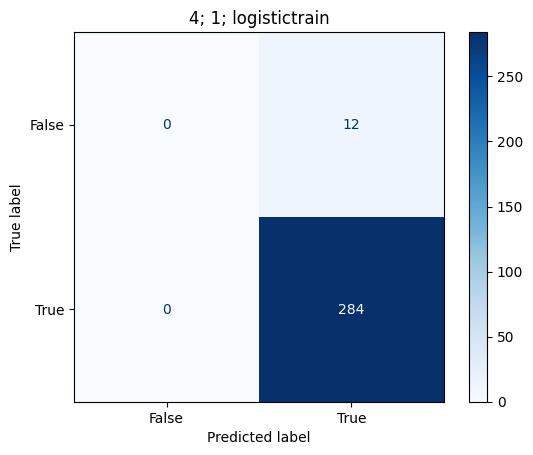

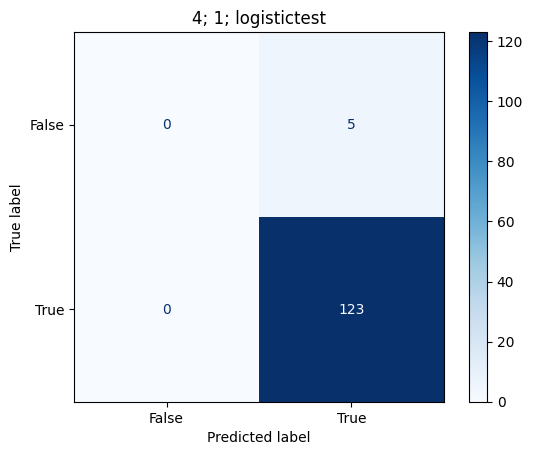

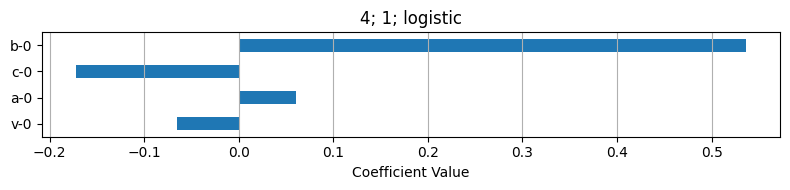

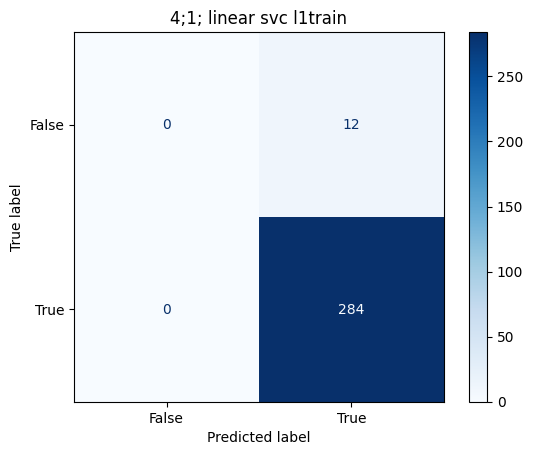

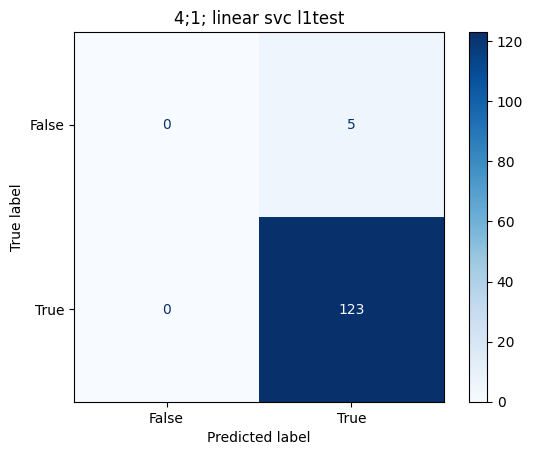

...

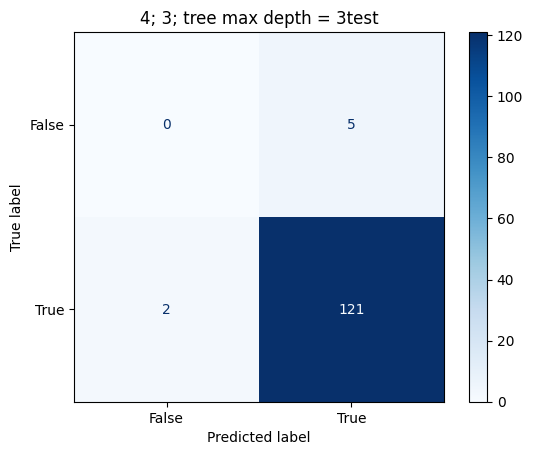

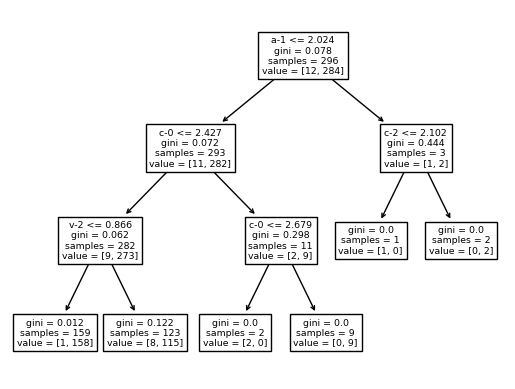

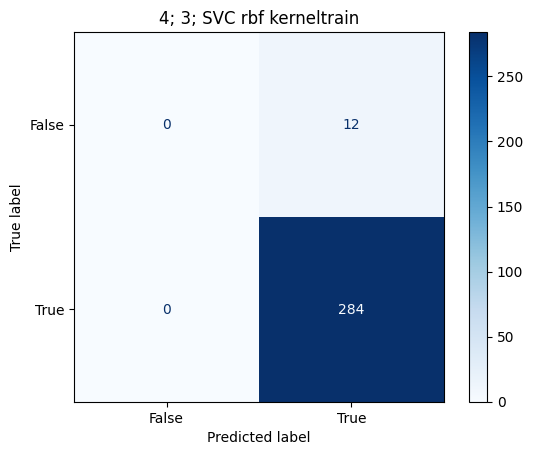

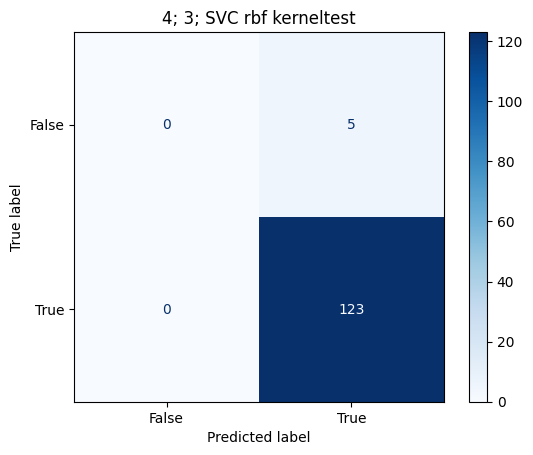

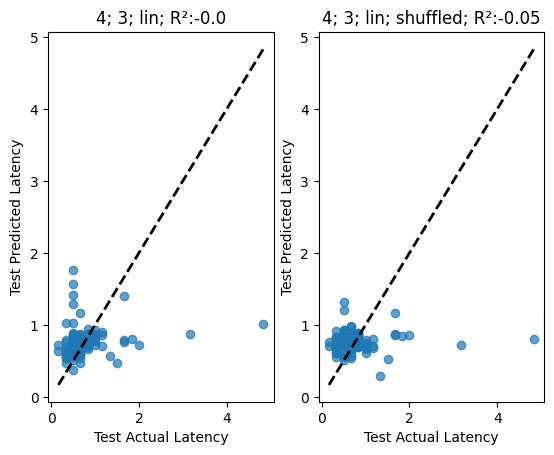

In [ ]:

###get inputs into lstm 
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]
if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]
        

    
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, TweedieRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import tree
##get latency and features for each stim 
# random_state = 42
# test_size = 0.2

random_state = 30
test_size = 0.3

feature_names_ordered = True

resampled_onsets= onsets
for n_timesteps in range(1, 10, 2 ):
    feature_names = np.array([[f"v-{n_timesteps-t-1}", f"a-{n_timesteps-t-1}", f"c-{n_timesteps-t-1}", f"b-{n_timesteps-t-1}"] for t in range(n_timesteps)]).flatten()
    # feature_names_ordered = np.array([[f"v-{T-t-1}", f"a-{T-t-1}", f"c-{T-t-1}", f"b-{T-t-1}"] for t in range(0,n_timesteps)]).reshape((len(feature_names), -1), order='F').flatten()
    X_stim = prep_FB_inputs(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,  n_timesteps= n_timesteps ) #shape (n_tracks, n_frames, n_features)
    # X_stim = [X_all_LSTM[i].numpy() for i in range(len(X_all_LSTM))]
    # rev_bin = exp_behaviors
    for i, (resampled_onset, exp_onset) in [list(enumerate(zip(resampled_onsets, exp_onsets)))[4]]:
        X_stim_all =X_stim[:, resampled_onset-T-1, :]# X_all_LSTM[resampled_onset-T, :]
        # Get rid of already reversing guys###

        Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
        no_rev_at_onset = Y_latency!=0
        
        Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
        X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
        
        ###    
        X_train, X_test, y_train, y_test = train_test_split(X_prob, Y_prob, test_size=test_size, random_state=random_state)
        model = LogisticRegression(max_iter=1000, random_state=random_state)#, class_weight="balanced")
        model_label = f"{i}; {n_timesteps}; logistic"
        fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)

        
        
        model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
        model_label = f"{i};{n_timesteps}; linear svc l1"
        fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
        # Grid of C values to search
        param_grid = {
            'C': [0.001, 0.01, 0.1, 1, 10, 100]
        }

        model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
        # Grid search
        grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
        grid.fit(X_train, y_train)

        # Best parameters and score
        print("Best C:", grid.best_params_['C'])
        print("Best CV accuracy:", grid.best_score_)
        c = grid.best_params_['C']
        model = LinearSVC(penalty='l1', dual=False, max_iter=10000, C = c)
        model_label = f"{i};{n_timesteps}; linear svc l1 c {c}"
        fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
        
        model = tree.DecisionTreeClassifier()
        model_label = f"{i}; {n_timesteps}; tree no max depth"
        model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, get_coeff = False, feature_names_ordered = feature_names_ordered)
        fig, ax = plt.subplots()
        tree.plot_tree(model, feature_names = feature_names)
        
        model = tree.DecisionTreeClassifier(max_depth=3)
        model_label = f"{i}; {n_timesteps}; tree max depth = 3"
        model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  get_coeff = False, feature_names_ordered = feature_names_ordered)
        fig, ax = plt.subplots()
        tree.plot_tree(model, feature_names = feature_names)
        
        model = svm.SVC()
        model_label = f"{i}; {n_timesteps}; SVC rbf kernel"
        model, y_pred = fit_visualize_model_classifiction(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, get_coeff = False, feature_names_ordered = feature_names_ordered)

        
        ###########try latency 
        
        non_nan_non_rev_is = np.argwhere(np.logical_and(np.logical_not(np.isnan(Y_latency)), Y_latency!=0)).flatten()
        X_stim_all_latency = X_stim_all[non_nan_non_rev_is]# classfy y/n did stim happen
        Y_latency = Y_latency[non_nan_non_rev_is]
        
        X_train, X_test, y_train, y_test = train_test_split(X_stim_all_latency, Y_latency, test_size=test_size, random_state=random_state)

        model = LinearRegression()
        model_label= f"{i}; {n_timesteps}; lin"
        fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps, feature_names_ordered = feature_names_ordered)
        # model_lr.fit(X_train, y_train)
        # print("Linear Regression R²:", model_lr.score(X_test, y_test))
        # print("Coefficients:", model_lr.coef_)
        
        alphas = np.logspace(-4, 2, 20)
        lasso = Lasso(max_iter=10000)
        param_grid = {'alpha': alphas}
        grid_search_lasso = GridSearchCV(lasso, param_grid, cv=5, scoring='r2')
        grid_search_lasso.fit(X_train, y_train)

        best_lasso = grid_search_lasso.best_estimator_

        print("Best alpha lasso:", grid_search_lasso.best_params_['alpha'])
        print("Best CV R²:", grid_search_lasso.best_score_)
        alpha = grid_search_lasso.best_params_['alpha']
        model = Lasso(alpha=alpha)  # You can tune alpha with CV
        model_label= f"{i};{n_timesteps}; lasso_a{np.round(alpha,2)}"
        fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = feature_names_ordered)
        
        
        # model_lasso.fit(X_train, y_train)
        
        # print("Lasso R²:", model_lasso.score(X_test, y_test))
        # print("Coefficients:", model_lasso.coef_)# Range of alpha values to try (log scale)
        
        # Gamma regression
        #If your latencies are tightly distributed, or variance is constant → LinearRegression or Lasso
        # If variance grows with latency (heteroscedasticity) → TweedieRegressor(power=2)
        
        # param_grid = {
        #     'alpha': np.logspace(-4, 2, 10),  # Try a wide range
        # }

        # model = TweedieRegressor(power=2, alpha=0.0, link='log')  # log link enforces positivity
        # model_label=f"{i};gamma_a0.0"
        # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test)
        # grid_search_lasso = GridSearchCV(model, param_grid, cv=5, scoring='r2')
        # grid_search_lasso.fit(X_train, y_train)
        # best_lasso = grid_search_lasso.best_estimator_

        # print("Best alpha gamma:", grid_search_lasso.best_params_['alpha'])
        # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        # model_label= f"{i};gamma_a{np.round(alpha,2)}"
        # fit_visualize_model_regression(model, model_label, feature_names, X_train, X_test, y_train, y_test)
        
        
        # model_gamma.fit(X_train, y_train)
        # print("Gamma GLM R²:", model_gamma.score(X_train, y_test))
        # print("Coefficients:", model_gamma.coef_)
        
        
        
        # ###########
        # ####scaled
        # scaler = StandardScaler()
        # X_train_scaled = scaler.fit_transform(X_train)
        # X_train = X_train_scaled
        # X_test_scaled = scaler.transform(X_test)
        
        
        # model = LinearRegression()
        # model_label= f"{i};lin;scaled"
        # fit_visualize_model_regression(model, model_label, feature_names, X_train_scaled, X_test_scaled, y_train, y_test)
        # # model_lr.fit(X_train, y_train)
        # # print("Linear Regression R²:", model_lr.score(X_test, y_test))
        # # print("Coefficients:", model_lr.coef_)

        
        # alphas = np.logspace(-4, 2, 20)
        # lasso = Lasso(max_iter=10000)
        # param_grid = {'alpha': alphas}
        # grid_search_lasso = GridSearchCV(lasso, param_grid, cv=5, scoring='r2')
        # grid_search_lasso.fit(X_train, y_train)

        # best_lasso = grid_search_lasso.best_estimator_

        # # print("Best alpha:", grid_search_lasso.best_params_['alpha'])
        # # print("Best CV R²:", grid_search_lasso.best_score_)
        # alpha = grid_search_lasso.best_params_['alpha']
        # model = Lasso(alpha=alpha)  # You can tune alpha with CV
        # model_label= f"{i}; scaled;lasso_a{np.round(alpha,2)}"
        # fit_visualize_model_regression(model, model_label, feature_names,X_train_scaled, X_test_scaled, y_train, y_test)
        
        
        # # model_lasso.fit(X_train, y_train)
        
        # # print("Lasso R²:", model_lasso.score(X_test, y_test))
        # # print("Coefficients:", model_lasso.coef_)# Range of alpha values to try (log scale)
        
        # # Gamma regression
        # #If your latencies are tightly distributed, or variance is constant → LinearRegression or Lasso
        # # If variance grows with latency (heteroscedasticity) → TweedieRegressor(power=2)
        # model = TweedieRegressor(power=2, alpha=0.0, link='log')  # log link enforces positivity
        # model_label=f"{i};scaled; gamma"
        # fit_visualize_model_regression(model, model_label, feature_names,X_train_scaled, X_test_scaled, y_train, y_test)
        break
        
        ##try gam 
        
    


# simulate data

In [ ]:
# try: #no need to redo it
#     final_behs
# except:
final_behs = simulate_exp([0,1,3,5], input_durs=[8], neuron=neuron, input_dict = input_dict,new_slds = new_slds, q_x = q_x, pca=pca,  z= z, total_dur=8, thresh=2, remove_rev=False)

NameError: name 'z' is not defined

# plot

(0.0, 40.0)

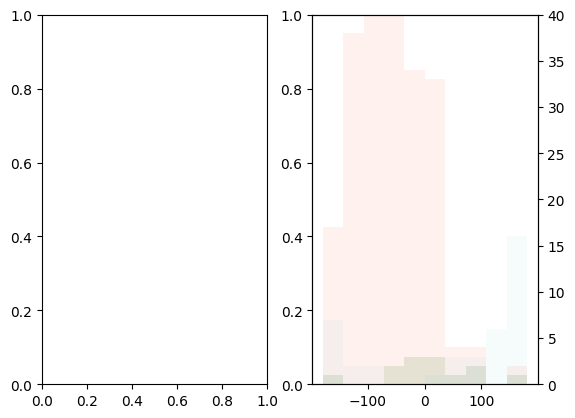

In [ ]:
fig,ax_2 = plt.subplots(1,2)
ax2 = ax_2[1].twinx()
idxs=[0,-1]
transformed_angles = np.degrees(np.concatenate(inferred_phases[[idxs]]))
# transformed_angles = (transformed_angles)%360 - 180
behs = np.concatenate(initial_behaviors[[idxs]])
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]
for i in range(3):
    ax2.hist(transformed_angles[np.abs(behs -beh_map[i]) < 0.01], bins=np.linspace(-180,181,11), density=False, alpha=0.1, color=palette[i])
ax2.set_ylim(0,40)

In [ ]:
ax_2[0].set_title(neuron)
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][1:]
colors[0] = (0,0,0,1)



times = onsets
inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM = analyze_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, times, model_beh_directed, z_norm,input_stats,  z, lag=16, inclusion_thresh = 2, model_type="ff",normalize=False, remove_revs=False)


for i in range(len(final_behs)):
    test_angs = np.concatenate(worm_angles[0:5])
    plot_rev_pro2(np.degrees(test_angs), final_behs[i], np.concatenate(np.array(q_z[0:5])[:,5+T:]), ax=ax_2[0],  label=f"input: {input_str}", color=colors[i], window_size=np.pi/4, plot_type="line", num_bins=10)

if condition == "control":
    plot_rev_pro2(np.degrees(inferred_phases_all[:10000]), final_behaviors_all[:10000], ax=ax_2[1], color="k", window_size=np.pi/4, beh1=False, plot_type="line", num_bins=10)
    ax_2[1].set_title("control")
else:
    plot_results([0,1,2,3], inferred_phases, final_behaviors, combined=False, ax=ax_2[1], colors=colors[:], num_bins=10, window_size=np.pi/4, plot_type="box", noise_level=0)
    ax_2[1].set_title(neuron)


ax_2[0].set_xlabel(r"$\theta$")
ax_2[1].set_xlabel(r"$\theta$")

# ax_2[1].set_xlim(-120,50)
# ax_2[0].set_xlim(-120,50)

fig.tight_layout()


NameError: name 'final_behs' is not defined

# Kernel regression

NameError: name 'final_behs' is not defined

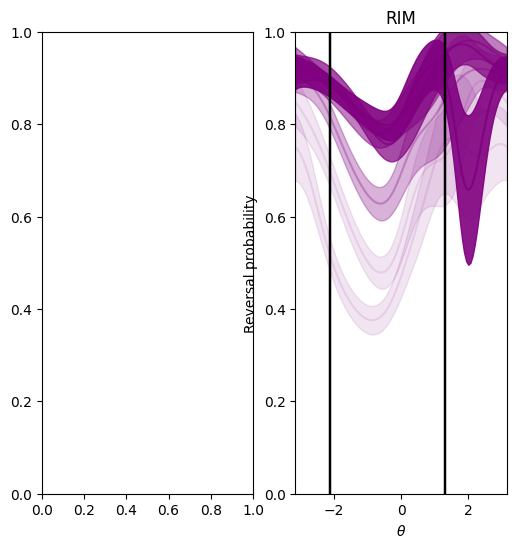

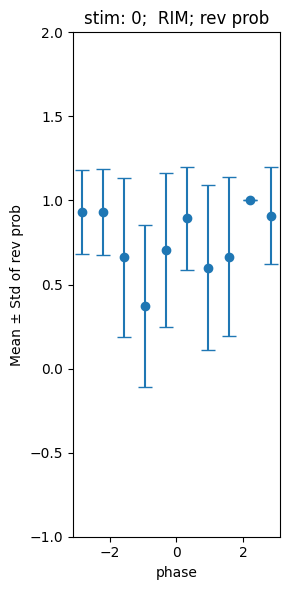

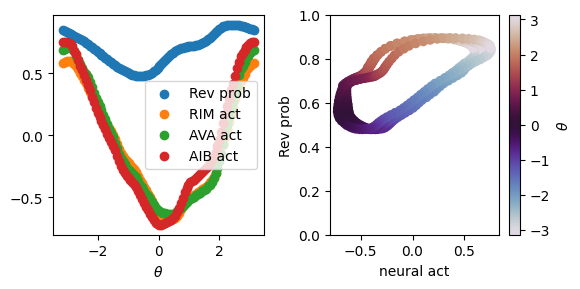

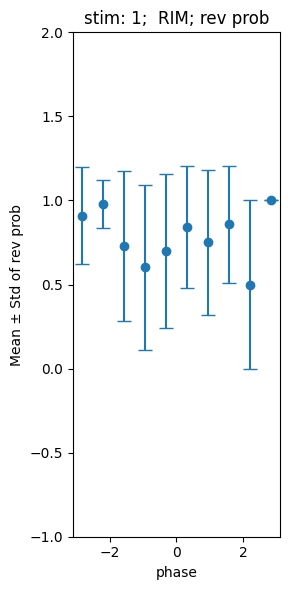

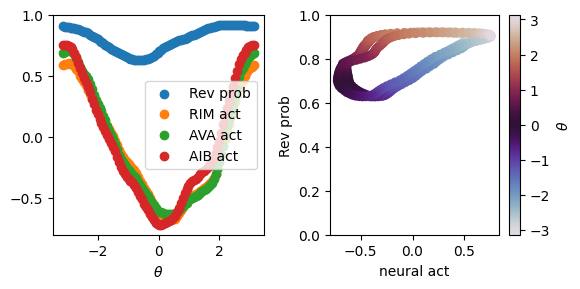

...

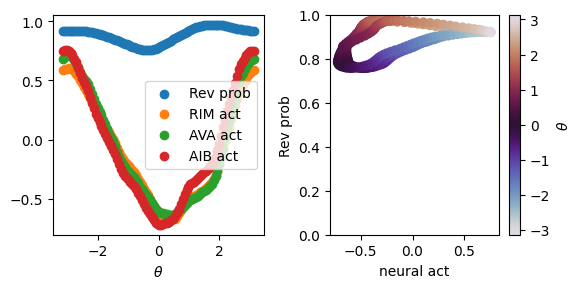

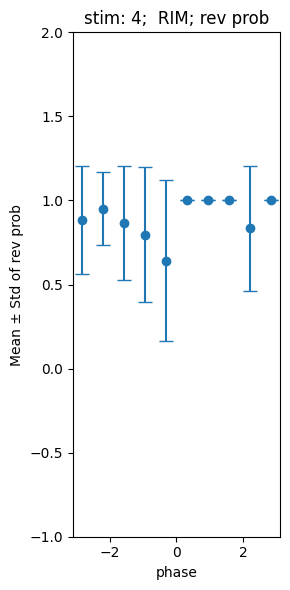

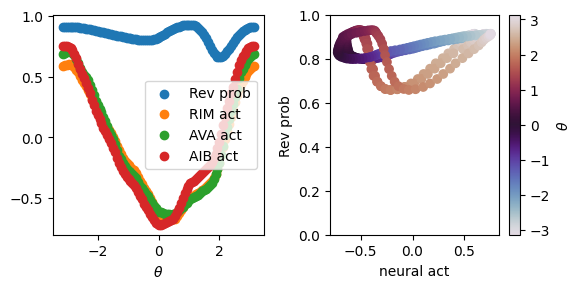

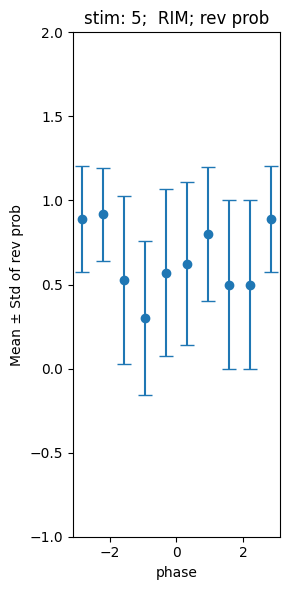

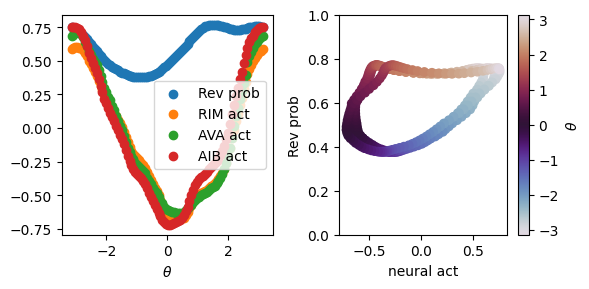

In [ ]:
def plot_binned_counts(x,y,title_supp="",  fig = None, ax = None, n_bins = 10):
    # Define bin edges
    bin_edges = np.linspace(-1*np.pi, np.pi, n_bins + 1)

    # Digitize x values to bin indices
    bin_indices = np.digitize(x, bin_edges) - 1

    # Preallocate arrays
    means = np.zeros(n_bins)
    stds = np.zeros(n_bins)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

    # Compute mean and std per bin
    for i in range(n_bins):
        mask = bin_indices == i
        if np.any(mask):
            means[i] = np.mean(y[mask])
            stds[i] = np.std(y[mask])
        else:
            means[i] = np.nan
            stds[i] = np.nan

    ax.errorbar(bin_centers, means, yerr=stds, fmt='o', capsize=5)
    ax.set_xlabel('phase')
    ax.set_ylabel('Mean ± Std of rev prob')
    ax.set_ylim([-1, 2])
    ax.set_title(f'{title_supp} {neuron}; rev prob')
    # plt.show()


# Plot
fig,ax = plt.subplots(1,2,figsize=(6,6))

if neuron == "AVA":
    idxs = [[0,-1],[1],[2], [3,4]]
    idxs = [[0],[1],[2],[3],[4],[5]]
if neuron == "RIM":
    idxs = [[0,-1],[1], [2,3,4]]
    idxs = [[0],[1],[2],[3],[4],[5]]
if neuron == "AIB":
    idxs = [[0,-1],[1,2], [3,4]]
# if neuron == "AIB":
#     idxs = [[0,-1],[1], [2], [3], [4]]
#     idxs = [[0],[1],[2],[3],[4],[5]]

for i in range(len(idxs)):

    x0,x1 = np.concatenate(inferred_phases[idxs[i]]), np.concatenate(inferred_rad[idxs[i]])
    y = np.concatenate(final_behaviors[idxs[i]])
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]

    fig1,ax1 = plt.subplots(figsize=(3,6))
    # ax1.scatter(x0[non_nan_ys], y, label = i)
    plot_binned_counts(x0,y,title_supp = f"stim: {i}; ",fig = fig1, ax = ax1, n_bins = 10)
    
    
    
    y_est = fit_and_evaluate_kernel_regression(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax[1], alpha = 0.1 + 0.2*(i%5), return_est=True)
    ax[1].set_xlabel(r"$\theta$")
    ax[1].set_ylabel("Reversal probability")
    ax[1].set_ylim(0,1)
    ax[1].set_title(neuron)
    ax[1].axvline(-2.1, color='k')
    ax[1].axvline(1.3, color='k')
    ax[1].set_xlim(-np.pi, np.pi)


    if True: # plot rev probability vs mean trace
        fig2,ax2  = plt.subplots(1,2, figsize=(6,3))
        ax2[0].scatter(np.linspace(-np.pi, np.pi, 100), y_est, label="Rev prob")

        neuron_names = ["RIM", "AVA", "AIB"]
        i = 0
        for y_est2 in y_est2s:
            ax2[0].scatter(np.linspace(-np.pi, np.pi, 100), y_est2, label=f"{neuron_names[i]} act")
            im = ax2[1].scatter(y_est2, y_est, c = np.linspace(-np.pi, np.pi, 100), cmap="twilight")
            i+=1


        ax2[0].set_xlabel(r"$\theta$")
        cb = fig.colorbar(im)
        cb.set_label(r"$\theta$")
        ax2[1].set_ylabel("Rev prob")
        ax2[1].set_xlabel(f"neural act")
        ax2[1].set_ylim(0,1)
        ax2[0].legend()
        fig2.tight_layout()


for i in range(1,len(final_behs)):


    x0,x1 = np.concatenate(worm_angles[0:5]), np.concatenate(worm_radii[0:5])
    y = np.array(final_behs[i])
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]


    
    
    y_est = fit_and_evaluate_kernel_regression(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax[0], alpha = 0.1 + 0.2*(i%5), return_est=True)


    ax[0].set_xlabel(r"$\theta$")
    ax[0].set_ylabel("Reversal probability")
    ax[0].set_title("Simulations")
    ax[0].axvline(-2.1, color='k')
    ax[0].axvline(1.3, color='k')
    ax[0].set_ylim(0,1)


fig.tight_layout()
